# 1. Import & Preprocess Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import os
from tqdm import tqdm
import warnings
import seaborn as sns

In [2]:
warnings.filterwarnings("ignore")
plt.style.use("seaborn-darkgrid")
sns.set_context("paper", font_scale=1.4)

id_map = {
    0: (0, 0, 0), # unlabelled
    1: (111, 74,  0), #static
    2: ( 81,  0, 81), #ground
    3: (128, 64,127), #road
    4: (244, 35,232), #sidewalk
    5: (250,170,160), #parking
    6: (230,150,140), #rail track
    7: (70, 70, 70), #building
    8: (102,102,156), #wall
    9: (190,153,153), #fence
    10: (180,165,180), #guard rail
    11: (150,100,100), #bridge
    12: (150,120, 90), #tunnel
    13: (153,153,153), #pole
    14: (153,153,153), #polegroup
    15: (250,170, 30), #traffic light
    16: (220,220,  0), #traffic sign
    17: (107,142, 35), #vegetation
    18: (152,251,152), #terrain
    19: ( 70,130,180), #sky
    20: (220, 20, 60), #person
    21: (255,  0,  0), #rider
    22: (  0,  0,142), #car
    23: (  0,  0, 70), #truck
    24: (  0, 60,100), #bus
    25: (  0,  0, 90), #caravan
    26: (  0,  0,110), #trailer
    27: (  0, 80,100), #train
    28: (  0,  0,230), #motorcycle
    29: (119, 11, 32), #bicycle
    30: (  0,  0,142) #license plate 
}

category_map = {
    0: 0,
    1: 0,
    2: 0,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    7: 2,
    8: 2,
    9: 2,
    10: 2,
    11: 2,
    12: 2,
    13: 3,
    14: 3,
    15: 3,
    16: 3,
    17: 4,
    18: 4,
    19: 5,
    20: 6,
    21: 6,
    22: 7,
    23: 7,
    24: 7,
    25: 7,
    26: 7,
    27: 7,
    28: 7,
    29: 7,
    30: 7
}

num_classes = len(id_map.keys())

In [3]:
def preprocess(path):
    img = Image.open(path)
    
    # separate the Data & Target
    # crop region of size (256, 256) from the input image, starting from the top-left corner
    # resize cropped image to a new size of (128, 128)
    img1 = img.crop((0, 0, 256, 256)).resize((128, 128))
    img2 = img.crop((256, 0, 512, 256)).resize((128, 128))
    
    # Normalize the image
    img1 = np.array(img1) / 255. 
    img2 = np.array(img2)
    
    # create a black mask of the same size as the input image to store the pixel-wise segmentation labels
    # height and width of img2
    mask = np.zeros(shape=(img2.shape[0], img2.shape[1]), dtype = np.uint32) #  unsigned 32-bit integer
    
    #  perform a color to class mapping on an image
    # iterate over each pixel
    for row in range(img2.shape[0]):
        for col in range(img2.shape[1]):
            # pixel at (row, col) is extracted from the image as a three-dimensional RGB color vector
            a = img2[row, col, :]
            final_key = None
            final_d = None
            
            for key, value in id_map.items():
                #  calculate Euclidean distance between the current pixel color vector a and the value of the dictionary
                d = np.sum(np.sqrt(pow(a - value, 2)))
                
                # for first iteration of loop
                if final_key == None:
                    final_d = d
                    final_key = key
                # update if d is smaller 
                elif d < final_d:
                    final_d = d
                    final_key = key
            # class label corresponding to smallest distance final_key is assigned to pixel at (row, col) in the mask array
            mask[row, col] = final_key
    
    # reshaped to a three-dimensional array with a single channel
    mask = np.reshape(mask, (mask.shape[0], mask.shape[1], 1))
    
    del img2
    return img1, mask


# preprocess each image in the training and validation sets, and appends the resulting preprocessed images and masks
def prepare_tensor_dataset(train_path, val_path):
    X_train = []
    Y_train = []
    X_val = []
    Y_val = []
    for file in tqdm(os.listdir(train_path)):
        img, mask = preprocess(f"{train_path}/{file}")
        X_train.append(img)
        Y_train.append(mask)
    
    for file in tqdm(os.listdir(val_path)):
        img, mask = preprocess(f"{val_path}/{file}")
        X_val.append(img)
        Y_val.append(mask)

    return X_train, Y_train, X_val, Y_val

# **Dataset Preparation**

In [4]:
# load the processed images: https://www.kaggle.com/datasets/sapreatharva/data00
X_train = np.load('/kaggle/input/data00/xtrain.npy')
Y_train = np.load('/kaggle/input/data00/ytrain.npy')
X_valid = np.load('/kaggle/input/data00/xval.npy')
Y_valid = np.load('/kaggle/input/data00/yval.npy')
X_test = np.load('/kaggle/input/data00/xtest.npy')
Y_test = np.load('/kaggle/input/data00/ytest.npy')

# convert to array
X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_valid = np.array(X_valid)
Y_valid = np.array(Y_valid)
X_test= np.array(X_test)
Y_test = np.array(Y_test)

# 2. Models

## 2.1 FCN

In [6]:
def get_fcn_model():
    
    # instantiate a Keras tensor
    inputs = tf.keras.layers.Input(shape = [128, 128, 3])
    
    #First Downsample
    f1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(inputs)
    b1 = tf.keras.layers.BatchNormalization()(f1)
    f2 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b1)    # Used later for residual connection
    
    m3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f2)
    d4 = tf.keras.layers.Dropout(0.2)(m3)
    
    # Second Downsample
    f5 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d4)
    b5 = tf.keras.layers.BatchNormalization()(f5)
    f6 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b5)    # Used later for residual connection
    
    m7 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f6)
    d8 = tf.keras.layers.Dropout(0.2)(m7)
    
    # Third Downsample
    f9 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d8)
    b9 = tf.keras.layers.BatchNormalization()(f9)
    f10 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b9)    # Used later for residual connection
    
    m11 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f10)
    d12 = tf.keras.layers.Dropout(0.2)(m11)
    
    #Forth Downsample
    f13 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d12)
    b13 = tf.keras.layers.BatchNormalization()(f13)
    f14 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b13)    # Used later for residual connection
    
    m15 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f14)
    d16 = tf.keras.layers.Dropout(0.2)(m15)
    
    #Fifth Downsample
    f17 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d16)
    b17 = tf.keras.layers.BatchNormalization()(f17)
    f18 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b17)

    
    # First Upsample
    m19 = tf.keras.layers.UpSampling2D(size = (2, 2))(f18)
    d19 = tf.keras.layers.Dropout(0.2)(m19)
    #c20 = tf.keras.layers.Concatenate()([d19, f14])
    f21 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(d19)
    b21 = tf.keras.layers.BatchNormalization()(f21)
    f22 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b21)
    
    # Second Upsample
    m23 = tf.keras.layers.UpSampling2D(size = (2, 2))(f22)
    d23 = tf.keras.layers.Dropout(0.2)(m23)
    #c24 = tf.keras.layers.Concatenate()([d23, f10])
    f25 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d23)
    b25 = tf.keras.layers.BatchNormalization()(f25)
    f26 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b25)
    
    # Third Upsample
    m27 = tf.keras.layers.UpSampling2D(size = (2, 2))(f26)
    d27 = tf.keras.layers.Dropout(0.2)(m27)
    #c28 = tf.keras.layers.Concatenate()([d27, f6])
    f29 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d27)
    b29 = tf.keras.layers.BatchNormalization()(f29)
    f30 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b29)
    
    #Forth Upsample
    m31 = tf.keras.layers.UpSampling2D(size = (2, 2))(f30)
    d31 = tf.keras.layers.Dropout(0.2)(m31)
    #c32 = tf.keras.layers.Concatenate()([d31, f2])
    f33 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d31)
    b33 = tf.keras.layers.BatchNormalization()(f33)
    f34 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b33)
    
    # Output Layer
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(f34)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])
    return model

## 2.2 UNET

In [7]:
def get_unet_model():
    
    inputs = tf.keras.layers.Input(shape = [128, 128, 3])
    
    #First Downsample
    f1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(inputs)
    b1 = tf.keras.layers.BatchNormalization()(f1)
    f2 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b1)    # Used later for residual connection
    
    m3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f2)
    d4 = tf.keras.layers.Dropout(0.2)(m3)
    
    # Second Downsample
    f5 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d4)
    b5 = tf.keras.layers.BatchNormalization()(f5)
    f6 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b5)    # Used later for residual connection
    
    m7 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f6)
    d8 = tf.keras.layers.Dropout(0.2)(m7)
    
    # Third Downsample
    f9 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d8)
    b9 = tf.keras.layers.BatchNormalization()(f9)
    f10 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b9)    # Used later for residual connection
    
    m11 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f10)
    d12 = tf.keras.layers.Dropout(0.2)(m11)
    
    #Forth Downsample
    f13 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d12)
    b13 = tf.keras.layers.BatchNormalization()(f13)
    f14 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b13)    # Used later for residual connection
    
    m15 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f14)
    d16 = tf.keras.layers.Dropout(0.2)(m15)
    
    #Fifth Downsample
    f17 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d16)
    b17 = tf.keras.layers.BatchNormalization()(f17)
    f18 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b17)

    
    # First Upsample
    m19 = tf.keras.layers.UpSampling2D(size = (2, 2))(f18)
    d19 = tf.keras.layers.Dropout(0.2)(m19)
    c20 = tf.keras.layers.Concatenate()([d19, f14])
    f21 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(c20)
    b21 = tf.keras.layers.BatchNormalization()(f21)
    f22 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b21)
    
    # Second Upsample
    m23 = tf.keras.layers.UpSampling2D(size = (2, 2))(f22)
    d23 = tf.keras.layers.Dropout(0.2)(m23)
    c24 = tf.keras.layers.Concatenate()([d23, f10])
    f25 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c24)
    b25 = tf.keras.layers.BatchNormalization()(f25)
    f26 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b25)
    
    # Third Upsample
    m27 = tf.keras.layers.UpSampling2D(size = (2, 2))(f26)
    d27 = tf.keras.layers.Dropout(0.2)(m27)
    c28 = tf.keras.layers.Concatenate()([d27, f6])
    f29 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c28)
    b29 = tf.keras.layers.BatchNormalization()(f29)
    f30 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b29)
    
    #Forth Upsample
    m31 = tf.keras.layers.UpSampling2D(size = (2, 2))(f30)
    d31 = tf.keras.layers.Dropout(0.2)(m31)
    c32 = tf.keras.layers.Concatenate()([d31, f2])
    f33 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c32)
    b33 = tf.keras.layers.BatchNormalization()(f33)
    f34 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b33)
    
    # Output Layer
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(f34)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])
    return model

## 2.3 UNET + Residual

In [8]:
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras import backend as K


#convolutional block
def conv_block(x, kernelsize, filters, dropout, batchnorm=False): 
    conv = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding="same")(x)
    if batchnorm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation("relu")(conv)
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)
    conv = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding="same")(conv)
    if batchnorm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation("relu")(conv)
    return conv


#residual convolutional block
def res_conv_block(x, kernelsize, filters, dropout, batchnorm=False):
    conv1 = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding='same')(x)
    if batchnorm is True:
        conv1 = layers.BatchNormalization(axis=3)(conv1)
    conv1 = layers.Activation('relu')(conv1)    
    conv2 = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding='same')(conv1)
    if batchnorm is True:
        conv2 = layers.BatchNormalization(axis=3)(conv2)
        conv2 = layers.Activation("relu")(conv2)
    if dropout > 0:
        conv2 = layers.Dropout(dropout)(conv2)
        
    #skip connection    
    shortcut = layers.Conv2D(filters, kernel_size=(1, 1), kernel_initializer='he_normal', padding='same')(x)
    if batchnorm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)
    shortcut = layers.Activation("relu")(shortcut)
    respath = layers.add([shortcut, conv2])       
    return respath


#gating signal for attention unit
def gatingsignal(input, out_size, batchnorm=False):
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batchnorm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

#attention unit/block based on soft attention
def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)
    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), kernel_initializer='he_normal', padding='same')(x) 
    shape_theta_x = K.int_shape(theta_x)
    phi_g = layers.Conv2D(inter_shape, (1, 1), kernel_initializer='he_normal', padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3), strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]), kernel_initializer='he_normal', padding='same')(phi_g)
    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), kernel_initializer='he_normal', padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg) 
    upsample_psi = layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3), arguments={'repnum': shape_x[3]})(upsample_psi)                          
    y = layers.multiply([upsample_psi, x])
    result = layers.Conv2D(shape_x[3], (1, 1), kernel_initializer='he_normal', padding='same')(y)
    attenblock = layers.BatchNormalization()(result)
    return attenblock

In [9]:
def get_resunet_model():
    
    inputs = tf.keras.layers.Input(shape = [128, 128, 3])
    
    #First Downsample
    f1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(inputs)
    b1 = tf.keras.layers.BatchNormalization()(f1)
    f2 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b1)    # Used later for residual connection
    
    m3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f2)
    d4 = tf.keras.layers.Dropout(0.2)(m3)
    
    
    # Second Downsample
    f5 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d4)
    b5 = tf.keras.layers.BatchNormalization()(f5)
    f6 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b5)    # Used later for residual connection
    
    #Residual connection + Addition
    resid1=tf.keras.layers.Conv2D(128, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d4)
    resid_bn1= tf.keras.layers.BatchNormalization()(resid1)
    out1= tf.keras.layers.add([resid_bn1,f6]) 
    
    m7 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out1)
    d8 = tf.keras.layers.Dropout(0.2)(m7)
    
    
    # Third Downsample
    f9 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d8)
    b9 = tf.keras.layers.BatchNormalization()(f9)
    f10 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b9)    # Used later for residual connection
    
    #Residual connection + Addition
    resid2=tf.keras.layers.Conv2D(256, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d8)
    resid_bn2= tf.keras.layers.BatchNormalization()(resid2)
    out2= tf.keras.layers.add([resid_bn2,f10]) 
    
    
    m11 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out2)
    d12 = tf.keras.layers.Dropout(0.2)(m11)
    
    
    
    #Forth Downsample
    f13 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d12)
    b13 = tf.keras.layers.BatchNormalization()(f13)
    f14 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b13)    # Used later for residual connection
    
    #Residual connection + Addition
    resid3=tf.keras.layers.Conv2D(512, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d12)
    resid_bn3=tf.keras.layers.BatchNormalization()(resid3)
    out3= tf.keras.layers.add([resid_bn3,f14]) 
    
    m15 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out3)
    d16 = tf.keras.layers.Dropout(0.2)(m15)
    
    
    #Fifth Downsample
    f17 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d16)
    b17 = tf.keras.layers.BatchNormalization()(f17)
    f18 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b17)
    
    #Residual connection + Addition
    resid4=tf.keras.layers.Conv2D(1024, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d16)
    resid_bn4=tf.keras.layers.BatchNormalization()(resid4)
    out4= tf.keras.layers.add([resid_bn4,f18]) 
    
    
    
    
    # First Upsample
    m19 = tf.keras.layers.UpSampling2D(size = (2, 2))(out4)
    d19 = tf.keras.layers.Dropout(0.2)(m19)
    c20 = tf.keras.layers.Concatenate()([d19, f14])
    
    f21 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(c20)
    b21 = tf.keras.layers.BatchNormalization()(f21)
    f22 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b21)
    
    #Residual connection + Addition
    resid5=tf.keras.layers.Conv2D(512, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c20)
    resid_bn5=tf.keras.layers.BatchNormalization()(resid5)
    out5= tf.keras.layers.add([resid_bn5,f22])
    
    
    # Second Upsample
    m23 = tf.keras.layers.UpSampling2D(size = (2, 2))(out5)
    d23 = tf.keras.layers.Dropout(0.2)(m23)
    c24 = tf.keras.layers.Concatenate()([d23, f10])
    
    f25 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c24)
    b25 = tf.keras.layers.BatchNormalization()(f25)
    f26 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b25)
    
    #Residual connection + Addition
    resid6=tf.keras.layers.Conv2D(256, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c24)
    resid_bn6=tf.keras.layers.BatchNormalization()(resid6)
    out6= tf.keras.layers.add([resid_bn6,f26])
    
    # Third Upsample
    m27 = tf.keras.layers.UpSampling2D(size = (2, 2))(out6)
    d27 = tf.keras.layers.Dropout(0.2)(m27)
    c28 = tf.keras.layers.Concatenate()([d27, f6])
    
    f29 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c28)
    b29 = tf.keras.layers.BatchNormalization()(f29)
    f30 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b29)
    
    #Residual connection + Addition
    resid7=tf.keras.layers.Conv2D(128, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c28)
    resid_bn7=tf.keras.layers.BatchNormalization()(resid7)
    out7= tf.keras.layers.add([resid_bn7,f30])
    
    #Forth Upsample
    m31 = tf.keras.layers.UpSampling2D(size = (2, 2))(out7)
    d31 = tf.keras.layers.Dropout(0.2)(m31)
    c32 = tf.keras.layers.Concatenate()([d31, f2])
    
    f33 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c32)
    b33 = tf.keras.layers.BatchNormalization()(f33)
    f34 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b33)
    
    #Residual connection + Addition
    resid8=tf.keras.layers.Conv2D(64, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c32)
    resid_bn8=tf.keras.layers.BatchNormalization()(resid8)
    out8= tf.keras.layers.add([resid_bn8,f34])
    
    # Output Layer
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(out8)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])
    return model

## 2.4 UNET + Attention

In [10]:
def get_unet_attn_model():
    
    inputs = tf.keras.layers.Input(shape = [128, 128, 3])
    
    #First Downsample
    f1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(inputs)
    b1 = tf.keras.layers.BatchNormalization()(f1)
    f2 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b1)    # Used later for residual connection
    
    m3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f2)
    d4 = tf.keras.layers.Dropout(0.2)(m3)
    
    # Second Downsample
    f5 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d4)
    b5 = tf.keras.layers.BatchNormalization()(f5)
    f6 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b5)    # Used later for residual connection
    
    m7 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f6)
    d8 = tf.keras.layers.Dropout(0.2)(m7)
    
    # Third Downsample
    f9 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d8)
    b9 = tf.keras.layers.BatchNormalization()(f9)
    f10 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b9)    # Used later for residual connection
    
    m11 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f10)
    d12 = tf.keras.layers.Dropout(0.2)(m11)
    
    #Forth Downsample
    f13 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d12)
    b13 = tf.keras.layers.BatchNormalization()(f13)
    f14 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b13)    # Used later for residual connection
    
    m15 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f14)
    d16 = tf.keras.layers.Dropout(0.2)(m15)
    
    #Fifth Downsample
    f17 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d16)
    b17 = tf.keras.layers.BatchNormalization()(f17)
    f18 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b17)

    
    # First Upsample
    gating_5 = gatingsignal(f18, 512, batchnorm)
    att_5 = attention_block(f14, gating_5, 512)
    m19 = tf.keras.layers.UpSampling2D(size = (2, 2))(f18)
    d19 = tf.keras.layers.Dropout(0.2)(m19)
    c20 = tf.keras.layers.Concatenate()([d19, att_5])
    f21 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(c20)
    b21 = tf.keras.layers.BatchNormalization()(f21)
    f22 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b21)
    
    # Second Upsample
    gating_4 = gatingsignal(f22, 256, batchnorm)
    att_4 = attention_block(f10, gating_4, 256)
    m23 = tf.keras.layers.UpSampling2D(size = (2, 2))(f22)
    d23 = tf.keras.layers.Dropout(0.2)(m23)
    c24 = tf.keras.layers.Concatenate()([d23, att_4])
    f25 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c24)
    b25 = tf.keras.layers.BatchNormalization()(f25)
    f26 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b25)
    
    # Third Upsample
    gating_3 = gatingsignal(f26, 128, batchnorm)
    att_3 = attention_block(f6, gating_3, 128)
    m27 = tf.keras.layers.UpSampling2D(size = (2, 2))(f26)
    d27 = tf.keras.layers.Dropout(0.2)(m27)
    c28 = tf.keras.layers.Concatenate()([d27, att_3])
    f29 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c28)
    b29 = tf.keras.layers.BatchNormalization()(f29)
    f30 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b29)
    
    #Forth Upsample
    gating_2 = gatingsignal(f30, 64, batchnorm)
    att_2 = attention_block(f2, gating_2, 64)
    m31 = tf.keras.layers.UpSampling2D(size = (2, 2))(f30)
    d31 = tf.keras.layers.Dropout(0.2)(m31)
    c32 = tf.keras.layers.Concatenate()([d31, att_2])
    f33 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c32)
    b33 = tf.keras.layers.BatchNormalization()(f33)
    f34 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b33)
    
    # Output Layer
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(f34)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])
    return model

## 2.5 UNET + Residual + Attention

In [11]:
def get_res_att_unet_model():
    
    inputs = tf.keras.layers.Input(shape = [128, 128, 3])
    
    # First Downsample
    f1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(inputs)
    b1 = tf.keras.layers.BatchNormalization()(f1)
    f2 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b1)    # Used later for residual connection
    #Residual connection + Addition
    resid1=tf.keras.layers.Conv2D(64, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(inputs)
    resid_bn1= tf.keras.layers.BatchNormalization()(resid1)
    out1= tf.keras.layers.add([resid_bn1,f2])    
    m3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out1)
    d4 = tf.keras.layers.Dropout(0.2)(m3)
    
    
    # Second Downsample
    f5 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d4)
    b5 = tf.keras.layers.BatchNormalization()(f5)
    f6 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b5)    # Used later for residual connection
    #Residual connection + Addition
    resid2=tf.keras.layers.Conv2D(128, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d4)
    resid_bn2= tf.keras.layers.BatchNormalization()(resid2)
    out2= tf.keras.layers.add([resid_bn2,f6]) 
    m7 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out2)
    d8 = tf.keras.layers.Dropout(0.2)(m7)
    
    
    # Third Downsample
    f9 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d8)
    b9 = tf.keras.layers.BatchNormalization()(f9)
    f10 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b9)    # Used later for residual connection
    #Residual connection + Addition
    resid3=tf.keras.layers.Conv2D(256, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d8)
    resid_bn3= tf.keras.layers.BatchNormalization()(resid3)
    out3= tf.keras.layers.add([resid_bn3,f10]) 
    m11 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out3)
    d12 = tf.keras.layers.Dropout(0.2)(m11)
    
    
    #Forth Downsample
    f13 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d12)
    b13 = tf.keras.layers.BatchNormalization()(f13)
    f14 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b13)    # Used later for residual connection
    #Residual connection + Addition
    resid4=tf.keras.layers.Conv2D(512, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d12)
    resid_bn4=tf.keras.layers.BatchNormalization()(resid4)
    out4= tf.keras.layers.add([resid_bn4,f14]) 
    m15 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(out4)
    d16 = tf.keras.layers.Dropout(0.2)(m15)
    
    
    #Fifth Downsample
    f17 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d16)
    b17 = tf.keras.layers.BatchNormalization()(f17)
    f18 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b17)
    #Residual connection + Addition
    resid5=tf.keras.layers.Conv2D(1024, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(d16)
    resid_bn5=tf.keras.layers.BatchNormalization()(resid5)
    out5= tf.keras.layers.add([resid_bn5,f18]) 
    
    
    
    
    # First Upsample
    gating_5 = gatingsignal(out5, 512, batchnorm)
    att_5 = attention_block(out4, gating_5, 512)
    m19 = tf.keras.layers.UpSampling2D(size = (2, 2))(out5)
    d19 = tf.keras.layers.Dropout(0.2)(m19)
    c20 = tf.keras.layers.Concatenate()([d19, f14])
    f21 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(c20)
    b21 = tf.keras.layers.BatchNormalization()(f21)
    f22 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b21)
    #Residual connection + Addition
    resid6=tf.keras.layers.Conv2D(512, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c20)
    resid_bn6=tf.keras.layers.BatchNormalization()(resid6)
    out6= tf.keras.layers.add([resid_bn6,f22])
    
    
    # Second Upsample
    gating_4 = gatingsignal(out6, 256, batchnorm)
    att_4 = attention_block(out3, gating_4, 256)
    m23 = tf.keras.layers.UpSampling2D(size = (2, 2))(out6)
    d23 = tf.keras.layers.Dropout(0.2)(m23)
    c24 = tf.keras.layers.Concatenate()([d23, f10])
    f25 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c24)
    b25 = tf.keras.layers.BatchNormalization()(f25)
    f26 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b25)
    #Residual connection + Addition
    resid7=tf.keras.layers.Conv2D(256, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c24)
    resid_bn7=tf.keras.layers.BatchNormalization()(resid7)
    out7= tf.keras.layers.add([resid_bn7,f26])
    
    
    # Third Upsample
    gating_3 = gatingsignal(out7, 128, batchnorm)
    att_3 = attention_block(out2, gating_3, 128)
    m27 = tf.keras.layers.UpSampling2D(size = (2, 2))(out7)
    d27 = tf.keras.layers.Dropout(0.2)(m27)
    c28 = tf.keras.layers.Concatenate()([d27, f6])
    f29 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c28)
    b29 = tf.keras.layers.BatchNormalization()(f29)
    f30 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b29)
    #Residual connection + Addition
    resid8=tf.keras.layers.Conv2D(128, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c28)
    resid_bn8=tf.keras.layers.BatchNormalization()(resid8)
    out8= tf.keras.layers.add([resid_bn8,f30])
    
    #Forth Upsample
    gating_2 = gatingsignal(out8, 64, batchnorm)
    att_2 = attention_block(out1, gating_2, 64)
    m31 = tf.keras.layers.UpSampling2D(size = (2, 2))(out8)
    d31 = tf.keras.layers.Dropout(0.2)(m31)
    c32 = tf.keras.layers.Concatenate()([d31, f2])
    f33 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c32)
    b33 = tf.keras.layers.BatchNormalization()(f33)
    f34 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b33)
    #Residual connection + Addition
    resid9=tf.keras.layers.Conv2D(64, kernel_size = (1, 1), padding = "same", strides = 1, activation = "relu")(c32)
    resid_bn9=tf.keras.layers.BatchNormalization()(resid9)
    out9= tf.keras.layers.add([resid_bn9,f34])

    # Output Layer
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(out9)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])
    return model

## 2.6 UNET + ASPP

In [12]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, Concatenate, Conv2DTranspose, GlobalAveragePooling2D
from keras.layers import Reshape
from keras.layers import BatchNormalization, Activation
#from keras.layers import AtrousConvolution2D
def create_aspp(input_tensor, n_filters):
    # ASPP module with dilated convolutions at different rates
    # and global average pooling

    # Dilated convolution with rate=1
    conv1x1_1 = Conv2D(n_filters, (1, 1), padding='same', kernel_initializer='he_normal')(input_tensor)

    # Dilated convolution with rate=6
    conv3x3_1 = Conv2D(n_filters, (3, 3), padding='same', dilation_rate=(6, 6), kernel_initializer='he_normal')(input_tensor)

    # Dilated convolution with rate=12
    conv3x3_2 = Conv2D(n_filters, (3, 3), padding='same', dilation_rate=(12, 12), kernel_initializer='he_normal')(input_tensor)

    # Dilated convolution with rate=18
    conv3x3_3 = Conv2D(n_filters, (3, 3), padding='same', dilation_rate=(18, 18), kernel_initializer='he_normal')(input_tensor)

    # Global average pooling
    avg_pool = GlobalAveragePooling2D()(input_tensor)
    avg_pool = Reshape((1, 1, n_filters))(avg_pool)
    avg_pool = Conv2D(n_filters, (1, 1), padding='same', kernel_initializer='he_normal')(avg_pool)
    avg_pool = UpSampling2D(size=(input_tensor.shape[1], input_tensor.shape[2]), interpolation='bilinear')(avg_pool)

    # Concatenate all paths
    concatenated = Concatenate()([conv1x1_1, conv3x3_1, conv3x3_2, conv3x3_3, avg_pool])
    concatenated = Conv2D(n_filters, (1, 1), padding='same', kernel_initializer='he_normal')(concatenated)
    concatenated = BatchNormalization()(concatenated)
    concatenated = Activation('relu')(concatenated)

    return concatenated

In [13]:
def get_unet_aspp_model():
    
    inputs = tf.keras.layers.Input(shape = [128, 128, 3])
    
    #First Downsample
    f1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(inputs)
    b1 = tf.keras.layers.BatchNormalization()(f1)
    f2 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b1)    # Used later for residual connection
    
    m3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f2)
    d4 = tf.keras.layers.Dropout(0.2)(m3)
    
    # Second Downsample
    f5 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d4)
    b5 = tf.keras.layers.BatchNormalization()(f5)
    f6 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b5)    # Used later for residual connection
    
    m7 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f6)
    d8 = tf.keras.layers.Dropout(0.2)(m7)
    
    # Third Downsample
    f9 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d8)
    b9 = tf.keras.layers.BatchNormalization()(f9)
    f10 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b9)    # Used later for residual connection
    
    m11 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f10)
    d12 = tf.keras.layers.Dropout(0.2)(m11)
    
    #Forth Downsample
    f13 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d12)
    b13 = tf.keras.layers.BatchNormalization()(f13)
    f14 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b13)    # Used later for residual connection
    
    m15 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(f14)
    d16 = tf.keras.layers.Dropout(0.2)(m15)
    
    #Fifth Downsample
    f17 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(d16)
    b17 = tf.keras.layers.BatchNormalization()(f17)
    f18 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b17)
    
    
    #ASPP
    aspp = create_aspp(f18, 1024)
    f18 = tf.keras.layers.Dropout(0.2)(aspp)
    
    # First Upsample
    m19 = tf.keras.layers.UpSampling2D(size = (2, 2))(f18)
    d19 = tf.keras.layers.Dropout(0.2)(m19)
    c20 = tf.keras.layers.Concatenate()([d19, f14])
    f21 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(c20)
    b21 = tf.keras.layers.BatchNormalization()(f21)
    f22 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b21)
    
    # Second Upsample
    m23 = tf.keras.layers.UpSampling2D(size = (2, 2))(f22)
    d23 = tf.keras.layers.Dropout(0.2)(m23)
    c24 = tf.keras.layers.Concatenate()([d23, f10])
    f25 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c24)
    b25 = tf.keras.layers.BatchNormalization()(f25)
    f26 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b25)
    
    # Third Upsample
    m27 = tf.keras.layers.UpSampling2D(size = (2, 2))(f26)
    d27 = tf.keras.layers.Dropout(0.2)(m27)
    c28 = tf.keras.layers.Concatenate()([d27, f6])
    f29 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c28)
    b29 = tf.keras.layers.BatchNormalization()(f29)
    f30 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b29)
    
    #Forth Upsample
    m31 = tf.keras.layers.UpSampling2D(size = (2, 2))(f30)
    d31 = tf.keras.layers.Dropout(0.2)(m31)
    c32 = tf.keras.layers.Concatenate()([d31, f2])
    f33 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(c32)
    b33 = tf.keras.layers.BatchNormalization()(f33)
    f34 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(b33)
    
    # Output Layer
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(f34)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])
    return model

## 2.6 RESNET50 - UNET (Transfer Learning)

In [14]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

def conv_block_resnet(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block_resnet(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block_resnet(x, num_filters)
    return x

def build_resnet50_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained ResNet50 Model """
    resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = resnet50.get_layer("input_1").output           ## (512 x 512)
    s2 = resnet50.get_layer("conv1_relu").output        ## (256 x 256)
    s3 = resnet50.get_layer("conv2_block3_out").output  ## (128 x 128)
    s4 = resnet50.get_layer("conv3_block4_out").output  ## (64 x 64)

    """ Bridge """
    b1 = resnet50.get_layer("conv4_block6_out").output  ## (32 x 32)

    """ Decoder """
    d1 = decoder_block_resnet(b1, s4, 128)                     ## (64 x 64)
    d2 = decoder_block_resnet(d1, s3, 64)                     ## (128 x 128)
    d3 = decoder_block_resnet(d2, s2, 32)                     ## (256 x 256)
    d4 = decoder_block_resnet(d3, s1, 16)                      ## (512 x 512)
    """ Output """
    #outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(d4)
    
    model = tf.keras.Model(inputs = [inputs], outputs = [outputs],name="ResNet50_U-Net")

    #model = Model(inputs, outputs, name="ResNet50_U-Net")
    return model

if __name__ == "__main__":
    input_shape = (128, 128, 3)
    model = build_resnet50_unet(input_shape)
    model.summary()
    


94765736/94765736 [==============================] - 3s 0us/step
Model: "ResNet50_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 134, 134, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 64, 64, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNorm

# 3. Utility Metrics & Callbacks classes

In [15]:
class UpdatedMeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self,
               y_true=None,
               y_pred=None,
               num_classes=None,
               name=None,
               dtype=None):
        super(UpdatedMeanIoU, self).__init__(num_classes = num_classes,name=name, dtype=dtype)
    
    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.math.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

class VizCallback(tf.keras.callbacks.Callback):
    
    def __init__(self, file_path, **kwargs):
        super().__init__(**kwargs)
        self.file_path = file_path
    
    def on_epoch_end(self, epoch, logs=None):
        img, mask = preprocess(self.file_path)
        img = np.array(img)
        img = np.reshape(img, (1, 128, 128, 3))
        pred = model.predict(img)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (128, 128))
        fig, axes = plt.subplots(nrows = 1, ncols = 2)
        axes[0].imshow(mask, cmap="gist_rainbow")
        axes[0].set_title("Original Mask")
        axes[1].imshow(y_pred, cmap="gist_rainbow")
        axes[1].set_title("Predicted Mask")
        plt.tight_layout()
        plt.show()

def plot_history(history):
    fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(20, 7))
    #Training    
    sns.lineplot(x = range(1, len(history.history["loss"]) + 1), y= history.history["loss"], ax = axes[0])#, label="Training Loss")
    sns.lineplot(x = range(1, len(history.history["loss"]) + 1), y= history.history["accuracy"], ax = axes[1])#, label="Training Accuracy")
    sns.lineplot(x = range(1, len(history.history["loss"]) + 1), y= history.history["mean_iou"], ax = axes[2])#, label="Training Mean IOU")

    # Validation
    sns.lineplot(x = range(1, len(history.history["loss"]) + 1), y= history.history["val_loss"], ax = axes[0])#, label="Validation Loss")
    sns.lineplot(x = range(1, len(history.history["loss"]) + 1), y= history.history["val_accuracy"], ax = axes[1])#, label="Validation Accuracy")
    sns.lineplot(x = range(1, len(history.history["loss"]) + 1), y= history.history["val_mean_iou"], ax = axes[2])#, label="Validation Mean IOU")
    
    axes[0].set_title("Loss Comparison", fontdict = {'fontsize': 15})
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")

    axes[1].set_title("Accuracy Comparison", fontdict = {'fontsize': 15})
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")

    axes[2].set_title("Mean IOU Comparison", fontdict = {'fontsize': 15})
    axes[2].set_xlabel("Epoch")
    axes[2].set_ylabel("Mean IOU")
    plt.tight_layout()
    plt.show()
    
    
    


# 4. Training

## 4.1 FCN

Epoch 1/100


2023-04-25 04:31:03.600282: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_1/dropout_8/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 0s 290ms/steposs: 1.3952 - accuracy: 0.5896 - mean_iou: 0.08


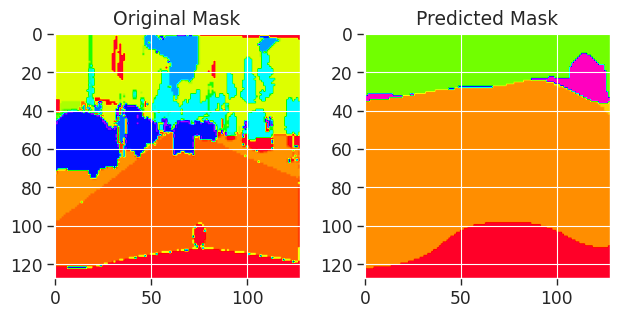

93/93 [==============================] - 40s 331ms/step - loss: 1.3952 - accuracy: 0.5896 - mean_iou: 0.0813 - val_loss: 3.6259 - val_accuracy: 0.4044 - val_mean_iou: 0.0352
Epoch 2/100
1/1 [==============================] - 0s 27ms/steploss: 1.0586 - accuracy: 0.7065 - mean_iou: 0.13


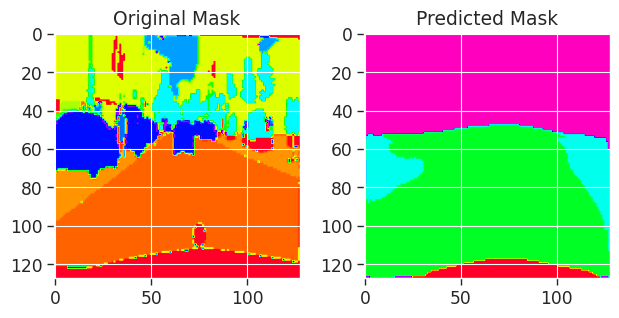

93/93 [==============================] - 29s 315ms/step - loss: 1.0586 - accuracy: 0.7065 - mean_iou: 0.1393 - val_loss: 1.9371 - val_accuracy: 0.5373 - val_mean_iou: 0.0598
Epoch 3/100
1/1 [==============================] - 0s 22ms/steploss: 0.9496 - accuracy: 0.7417 - mean_iou: 0.16


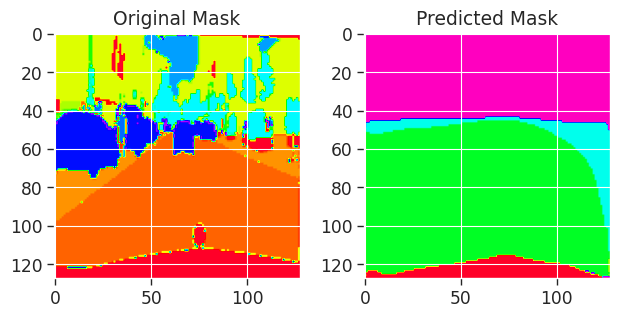

93/93 [==============================] - 30s 319ms/step - loss: 0.9496 - accuracy: 0.7417 - mean_iou: 0.1670 - val_loss: 2.0213 - val_accuracy: 0.5374 - val_mean_iou: 0.0609
Epoch 4/100
1/1 [==============================] - 0s 23ms/steploss: 0.8806 - accuracy: 0.7609 - mean_iou: 0.18


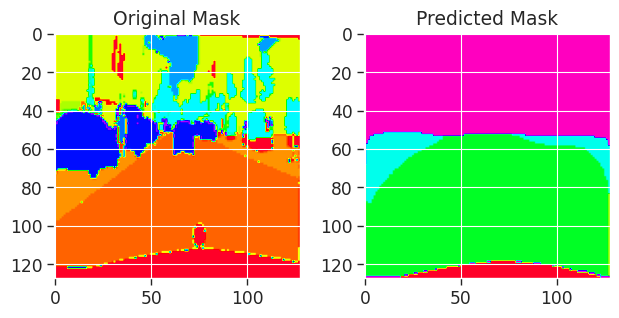

93/93 [==============================] - 29s 316ms/step - loss: 0.8806 - accuracy: 0.7609 - mean_iou: 0.1839 - val_loss: 1.6646 - val_accuracy: 0.5528 - val_mean_iou: 0.0669
Epoch 5/100
1/1 [==============================] - 0s 23ms/steploss: 0.8269 - accuracy: 0.7765 - mean_iou: 0.19


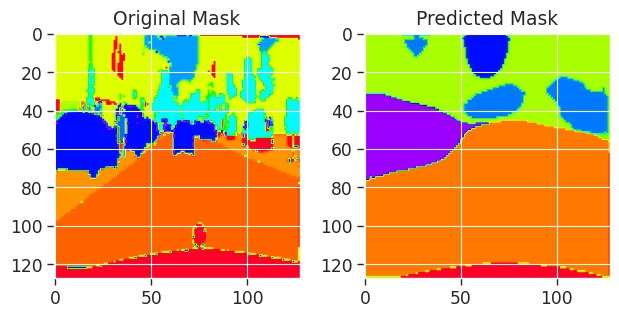

93/93 [==============================] - 29s 318ms/step - loss: 0.8269 - accuracy: 0.7765 - mean_iou: 0.1953 - val_loss: 1.4743 - val_accuracy: 0.6708 - val_mean_iou: 0.1233
Epoch 6/100
1/1 [==============================] - 0s 25ms/steploss: 0.7898 - accuracy: 0.7857 - mean_iou: 0.20


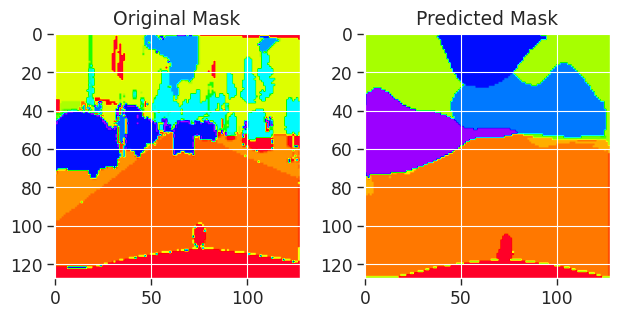

93/93 [==============================] - 30s 321ms/step - loss: 0.7898 - accuracy: 0.7857 - mean_iou: 0.2051 - val_loss: 1.2207 - val_accuracy: 0.7018 - val_mean_iou: 0.1453
Epoch 7/100
1/1 [==============================] - 0s 26ms/steploss: 0.7640 - accuracy: 0.7915 - mean_iou: 0.21


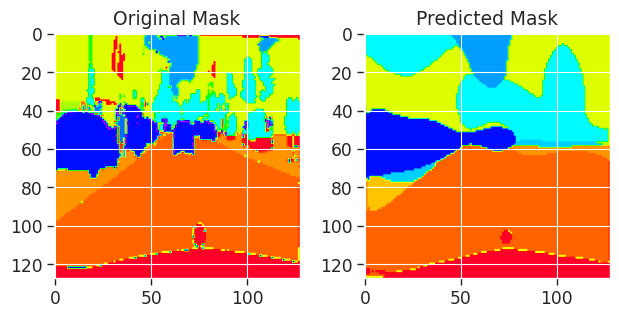

93/93 [==============================] - 30s 323ms/step - loss: 0.7640 - accuracy: 0.7915 - mean_iou: 0.2123 - val_loss: 1.0346 - val_accuracy: 0.7382 - val_mean_iou: 0.1740
Epoch 8/100
1/1 [==============================] - 0s 24ms/steploss: 0.7415 - accuracy: 0.7976 - mean_iou: 0.21


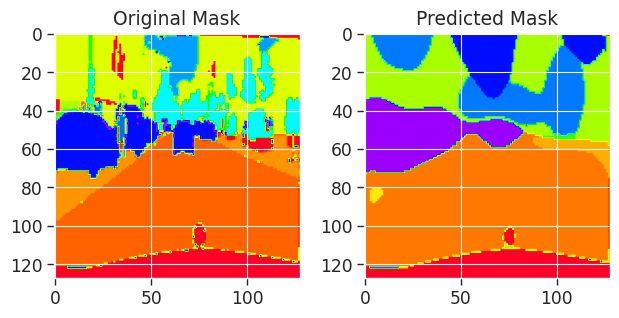

93/93 [==============================] - 30s 322ms/step - loss: 0.7415 - accuracy: 0.7976 - mean_iou: 0.2184 - val_loss: 0.8894 - val_accuracy: 0.7699 - val_mean_iou: 0.1938
Epoch 9/100
1/1 [==============================] - 0s 26ms/steploss: 0.7129 - accuracy: 0.8038 - mean_iou: 0.22


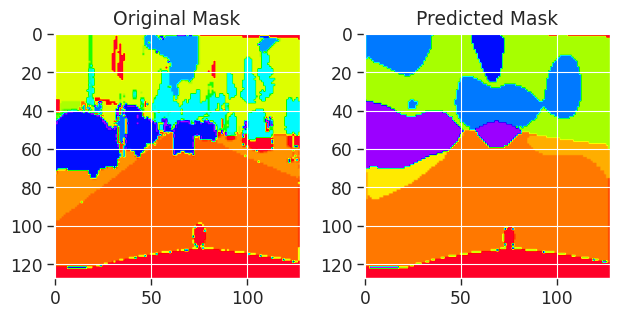

93/93 [==============================] - 29s 317ms/step - loss: 0.7129 - accuracy: 0.8038 - mean_iou: 0.2276 - val_loss: 0.8356 - val_accuracy: 0.7769 - val_mean_iou: 0.1964
Epoch 10/100
1/1 [==============================] - 0s 23ms/steploss: 0.6942 - accuracy: 0.8084 - mean_iou: 0.23


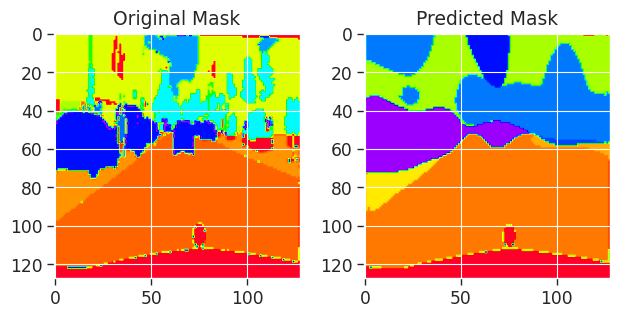

93/93 [==============================] - 30s 319ms/step - loss: 0.6942 - accuracy: 0.8084 - mean_iou: 0.2362 - val_loss: 0.8802 - val_accuracy: 0.7702 - val_mean_iou: 0.2059
Epoch 11/100
1/1 [==============================] - 0s 22ms/steploss: 0.6760 - accuracy: 0.8124 - mean_iou: 0.24


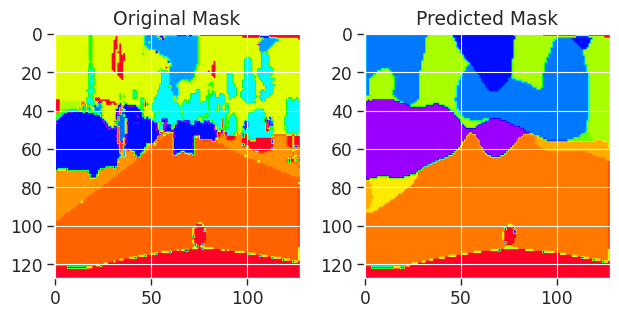

93/93 [==============================] - 31s 329ms/step - loss: 0.6760 - accuracy: 0.8124 - mean_iou: 0.2434 - val_loss: 0.8964 - val_accuracy: 0.7674 - val_mean_iou: 0.2010
Epoch 12/100
1/1 [==============================] - 0s 24ms/steploss: 0.6647 - accuracy: 0.8152 - mean_iou: 0.25


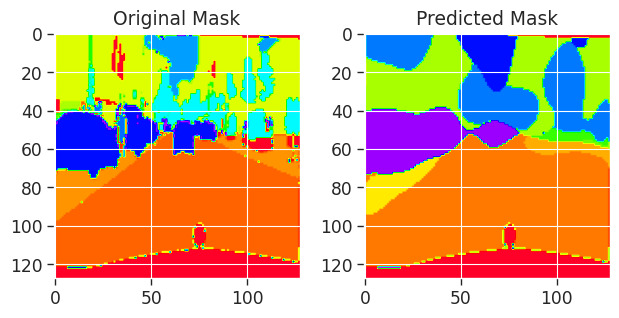

93/93 [==============================] - 30s 325ms/step - loss: 0.6647 - accuracy: 0.8152 - mean_iou: 0.2529 - val_loss: 0.8322 - val_accuracy: 0.7855 - val_mean_iou: 0.2100
Epoch 13/100
1/1 [==============================] - 0s 33ms/steploss: 0.6507 - accuracy: 0.8187 - mean_iou: 0.26


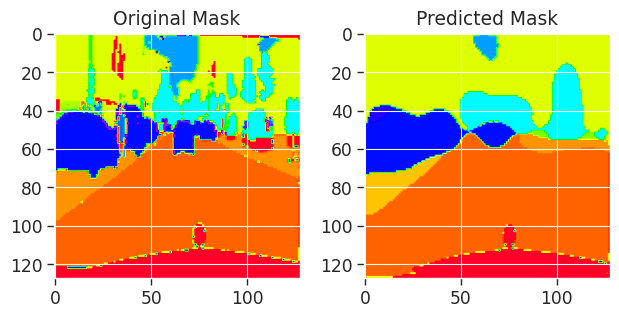

93/93 [==============================] - 29s 316ms/step - loss: 0.6507 - accuracy: 0.8187 - mean_iou: 0.2613 - val_loss: 0.9677 - val_accuracy: 0.7506 - val_mean_iou: 0.1923
Epoch 14/100
1/1 [==============================] - 0s 23ms/steploss: 0.6361 - accuracy: 0.8225 - mean_iou: 0.26


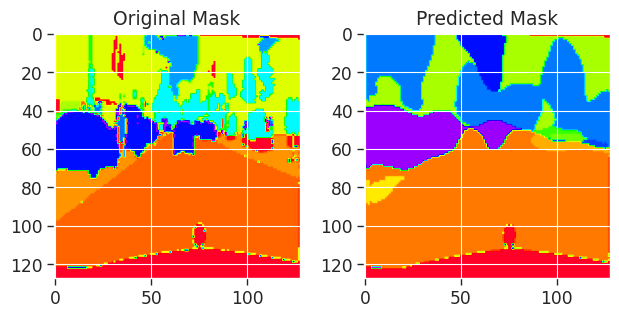

93/93 [==============================] - 29s 316ms/step - loss: 0.6361 - accuracy: 0.8225 - mean_iou: 0.2686 - val_loss: 0.8248 - val_accuracy: 0.7752 - val_mean_iou: 0.2104
Epoch 15/100
1/1 [==============================] - 0s 23ms/steploss: 0.6097 - accuracy: 0.8297 - mean_iou: 0.28


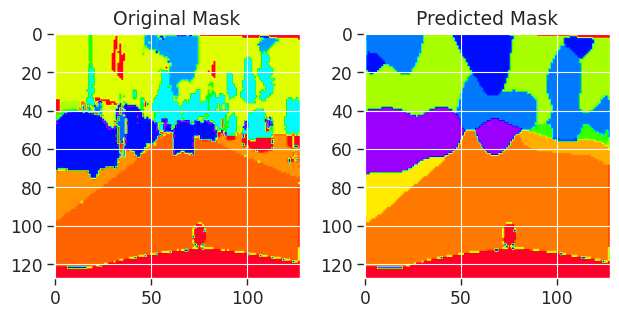

93/93 [==============================] - 29s 317ms/step - loss: 0.6097 - accuracy: 0.8297 - mean_iou: 0.2859 - val_loss: 0.7742 - val_accuracy: 0.7909 - val_mean_iou: 0.2235
Epoch 16/100
1/1 [==============================] - 0s 25ms/steploss: 0.6016 - accuracy: 0.8318 - mean_iou: 0.28


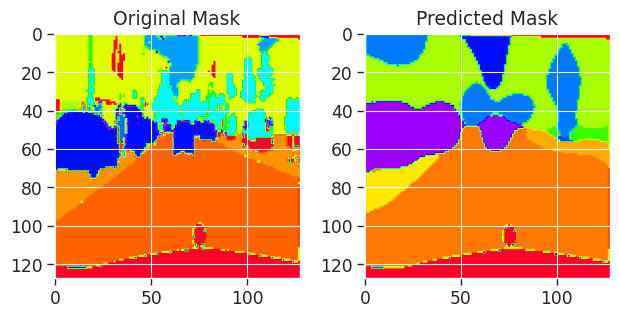

93/93 [==============================] - 30s 319ms/step - loss: 0.6016 - accuracy: 0.8318 - mean_iou: 0.2897 - val_loss: 0.7874 - val_accuracy: 0.7886 - val_mean_iou: 0.2226
Epoch 17/100
1/1 [==============================] - 0s 23ms/steploss: 0.5853 - accuracy: 0.8360 - mean_iou: 0.30


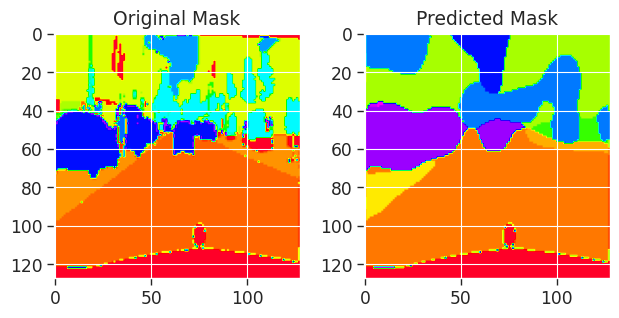

93/93 [==============================] - 30s 321ms/step - loss: 0.5853 - accuracy: 0.8360 - mean_iou: 0.3026 - val_loss: 0.7986 - val_accuracy: 0.7926 - val_mean_iou: 0.2231
Epoch 18/100
1/1 [==============================] - 0s 23ms/steploss: 0.5627 - accuracy: 0.8423 - mean_iou: 0.32


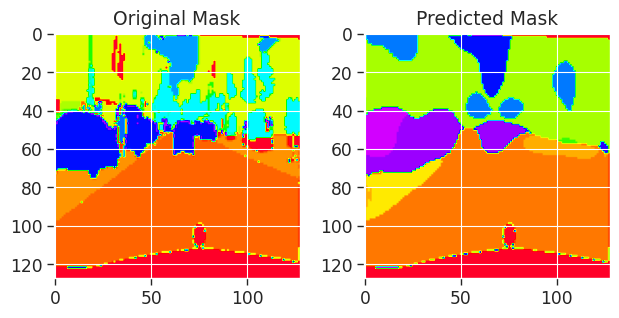

93/93 [==============================] - 29s 317ms/step - loss: 0.5627 - accuracy: 0.8423 - mean_iou: 0.3220 - val_loss: 0.8294 - val_accuracy: 0.7737 - val_mean_iou: 0.2296
Epoch 19/100
1/1 [==============================] - 0s 24ms/steploss: 0.5605 - accuracy: 0.8431 - mean_iou: 0.32


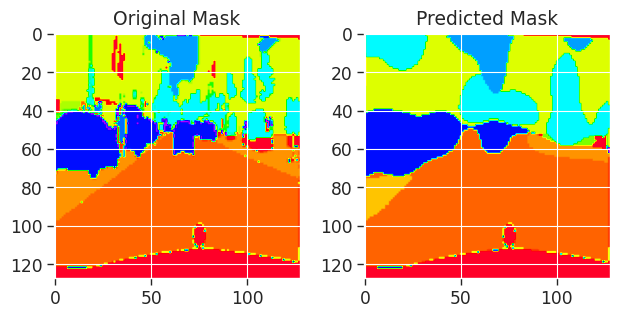

93/93 [==============================] - 29s 314ms/step - loss: 0.5605 - accuracy: 0.8431 - mean_iou: 0.3240 - val_loss: 0.8086 - val_accuracy: 0.7842 - val_mean_iou: 0.2288
Epoch 20/100
1/1 [==============================] - 0s 26ms/steploss: 0.5373 - accuracy: 0.8492 - mean_iou: 0.34


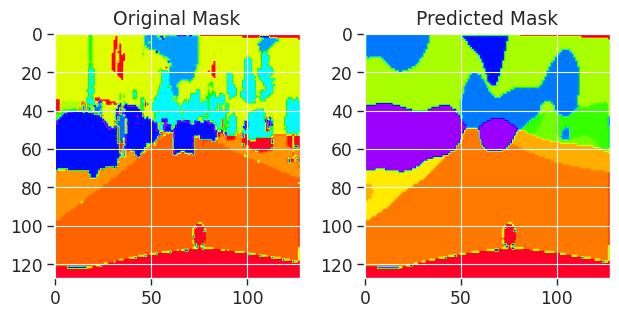

93/93 [==============================] - 30s 318ms/step - loss: 0.5373 - accuracy: 0.8492 - mean_iou: 0.3406 - val_loss: 0.7479 - val_accuracy: 0.8036 - val_mean_iou: 0.2527
Epoch 21/100
1/1 [==============================] - 0s 26ms/steploss: 0.5179 - accuracy: 0.8544 - mean_iou: 0.35


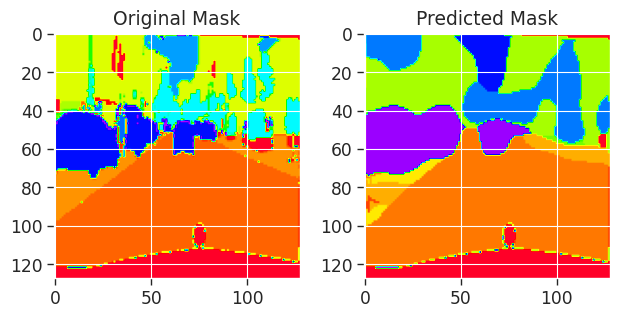

93/93 [==============================] - 29s 316ms/step - loss: 0.5179 - accuracy: 0.8544 - mean_iou: 0.3528 - val_loss: 0.7605 - val_accuracy: 0.8090 - val_mean_iou: 0.2475
Epoch 22/100
1/1 [==============================] - 0s 22ms/steploss: 0.5166 - accuracy: 0.8549 - mean_iou: 0.36


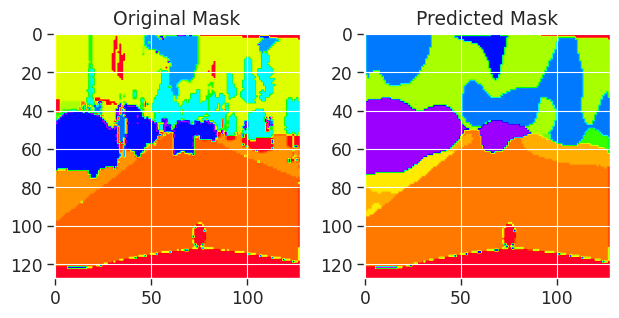

93/93 [==============================] - 29s 314ms/step - loss: 0.5166 - accuracy: 0.8549 - mean_iou: 0.3624 - val_loss: 0.7568 - val_accuracy: 0.7997 - val_mean_iou: 0.2480
Epoch 23/100
1/1 [==============================] - 0s 25ms/steploss: 0.5079 - accuracy: 0.8570 - mean_iou: 0.36


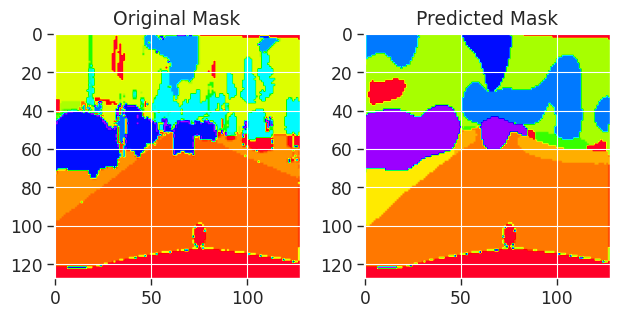

93/93 [==============================] - 29s 315ms/step - loss: 0.5079 - accuracy: 0.8570 - mean_iou: 0.3695 - val_loss: 0.7667 - val_accuracy: 0.8030 - val_mean_iou: 0.2430
Epoch 24/100
1/1 [==============================] - 0s 24ms/steploss: 0.5052 - accuracy: 0.8576 - mean_iou: 0.37


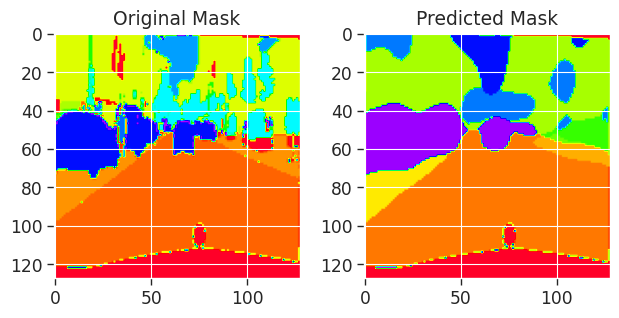

93/93 [==============================] - 29s 315ms/step - loss: 0.5052 - accuracy: 0.8576 - mean_iou: 0.3731 - val_loss: 0.8073 - val_accuracy: 0.8003 - val_mean_iou: 0.2389
Epoch 25/100
1/1 [==============================] - 0s 25ms/steploss: 0.4855 - accuracy: 0.8627 - mean_iou: 0.38


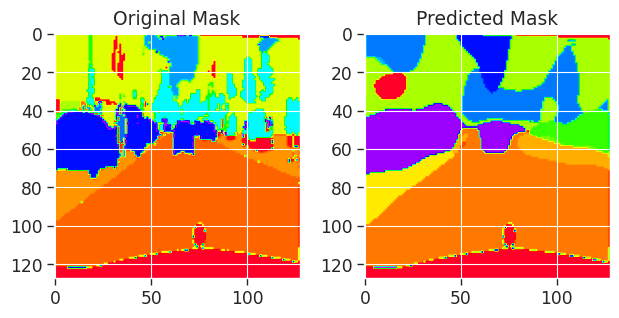

93/93 [==============================] - 30s 322ms/step - loss: 0.4855 - accuracy: 0.8627 - mean_iou: 0.3888 - val_loss: 0.7451 - val_accuracy: 0.8047 - val_mean_iou: 0.2550
Epoch 26/100
1/1 [==============================] - 0s 25ms/steploss: 0.4685 - accuracy: 0.8672 - mean_iou: 0.40


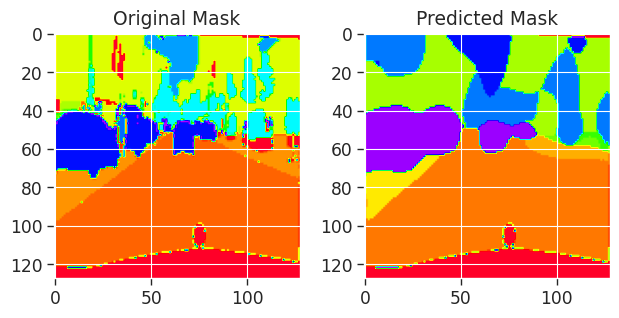

93/93 [==============================] - 30s 321ms/step - loss: 0.4685 - accuracy: 0.8672 - mean_iou: 0.4038 - val_loss: 0.8038 - val_accuracy: 0.8046 - val_mean_iou: 0.2430
Epoch 27/100
1/1 [==============================] - 0s 22ms/steploss: 0.4540 - accuracy: 0.8714 - mean_iou: 0.41


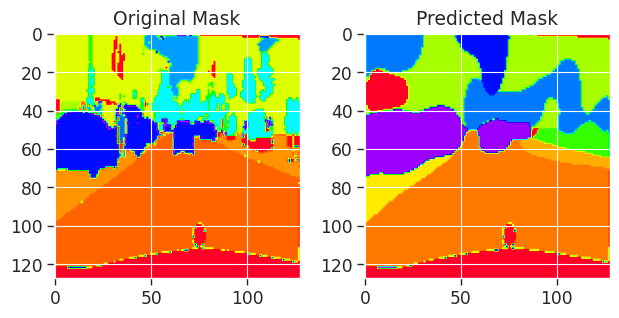

93/93 [==============================] - 30s 325ms/step - loss: 0.4540 - accuracy: 0.8714 - mean_iou: 0.4157 - val_loss: 0.7672 - val_accuracy: 0.8081 - val_mean_iou: 0.2563
Epoch 28/100
1/1 [==============================] - 0s 69ms/steploss: 0.4442 - accuracy: 0.8739 - mean_iou: 0.42


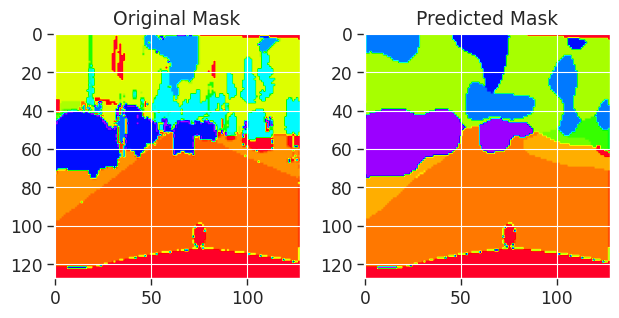

93/93 [==============================] - 30s 321ms/step - loss: 0.4442 - accuracy: 0.8739 - mean_iou: 0.4279 - val_loss: 0.7625 - val_accuracy: 0.8109 - val_mean_iou: 0.2608
Epoch 29/100
1/1 [==============================] - 0s 23ms/steploss: 0.4414 - accuracy: 0.8744 - mean_iou: 0.43


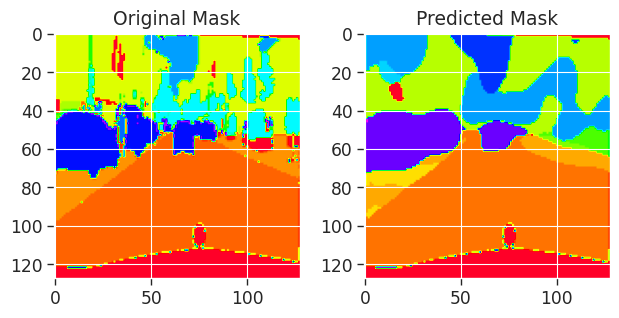

93/93 [==============================] - 29s 318ms/step - loss: 0.4414 - accuracy: 0.8744 - mean_iou: 0.4309 - val_loss: 0.7435 - val_accuracy: 0.8102 - val_mean_iou: 0.2622
Epoch 30/100
1/1 [==============================] - 0s 24ms/steploss: 0.4261 - accuracy: 0.8786 - mean_iou: 0.44


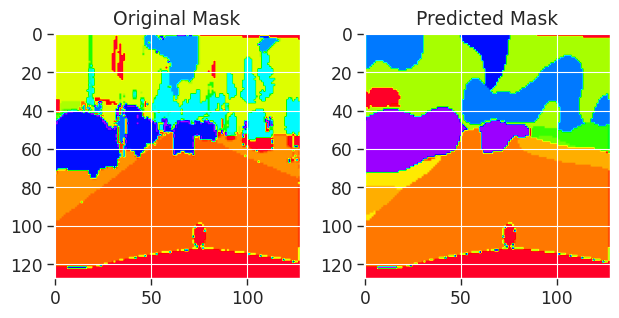

93/93 [==============================] - 30s 320ms/step - loss: 0.4261 - accuracy: 0.8786 - mean_iou: 0.4486 - val_loss: 0.7574 - val_accuracy: 0.8127 - val_mean_iou: 0.2637
Epoch 31/100
1/1 [==============================] - 0s 27ms/steploss: 0.4124 - accuracy: 0.8821 - mean_iou: 0.45


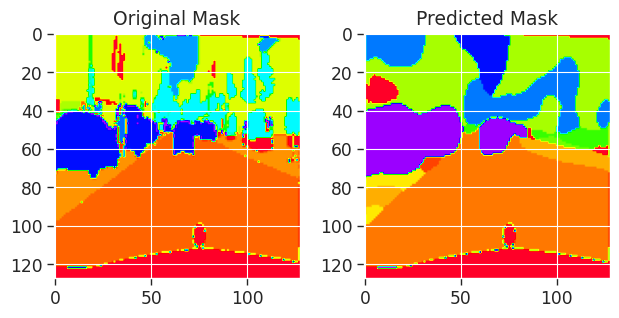

93/93 [==============================] - 29s 317ms/step - loss: 0.4124 - accuracy: 0.8821 - mean_iou: 0.4588 - val_loss: 0.7682 - val_accuracy: 0.8131 - val_mean_iou: 0.2590
Epoch 32/100
1/1 [==============================] - 0s 23ms/steploss: 0.4032 - accuracy: 0.8845 - mean_iou: 0.46


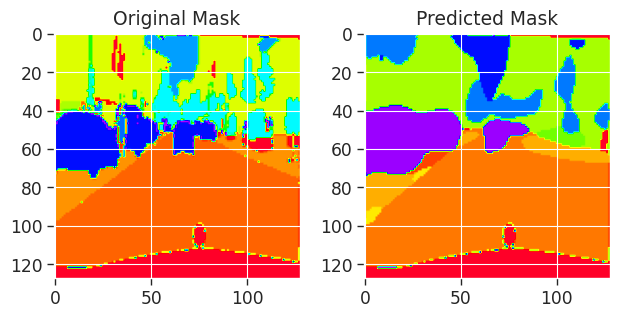

93/93 [==============================] - 29s 314ms/step - loss: 0.4032 - accuracy: 0.8845 - mean_iou: 0.4673 - val_loss: 0.8035 - val_accuracy: 0.8106 - val_mean_iou: 0.2617
Epoch 33/100
1/1 [==============================] - 0s 25ms/steploss: 0.3946 - accuracy: 0.8864 - mean_iou: 0.47


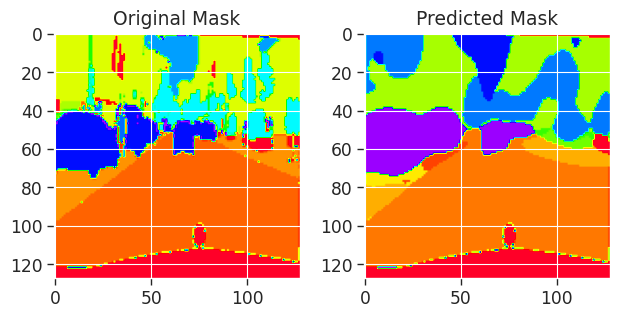

93/93 [==============================] - 29s 316ms/step - loss: 0.3946 - accuracy: 0.8864 - mean_iou: 0.4772 - val_loss: 0.8077 - val_accuracy: 0.8021 - val_mean_iou: 0.2542
Epoch 34/100
1/1 [==============================] - 0s 22ms/steploss: 0.3891 - accuracy: 0.8876 - mean_iou: 0.48


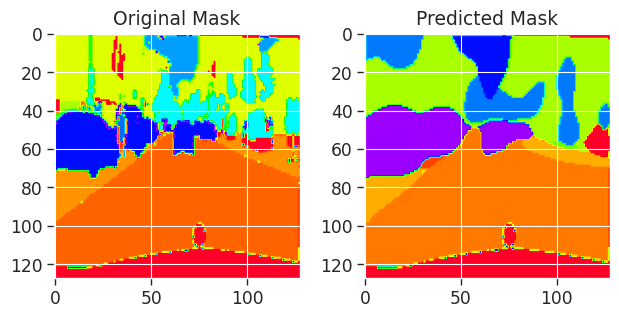

93/93 [==============================] - 30s 319ms/step - loss: 0.3891 - accuracy: 0.8876 - mean_iou: 0.4817 - val_loss: 0.8107 - val_accuracy: 0.8160 - val_mean_iou: 0.2591
Epoch 35/100
1/1 [==============================] - 0s 25ms/steploss: 0.3835 - accuracy: 0.8888 - mean_iou: 0.48


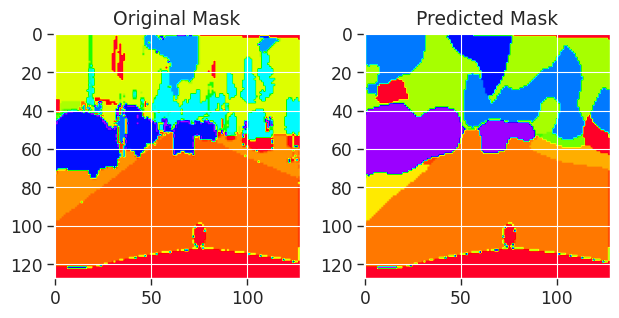

93/93 [==============================] - 29s 318ms/step - loss: 0.3835 - accuracy: 0.8888 - mean_iou: 0.4858 - val_loss: 0.8188 - val_accuracy: 0.8081 - val_mean_iou: 0.2573
Epoch 36/100
1/1 [==============================] - 0s 21ms/steploss: 0.3894 - accuracy: 0.8870 - mean_iou: 0.48


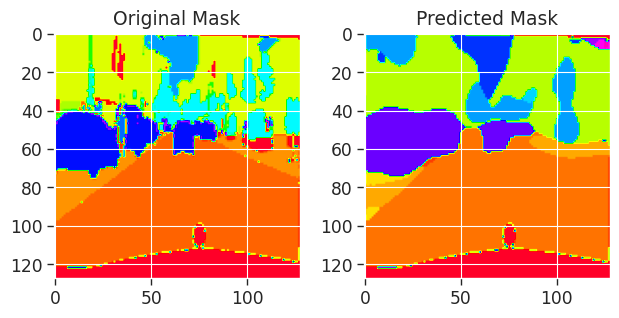

93/93 [==============================] - 29s 313ms/step - loss: 0.3894 - accuracy: 0.8870 - mean_iou: 0.4835 - val_loss: 0.8825 - val_accuracy: 0.8041 - val_mean_iou: 0.2472
Epoch 37/100
1/1 [==============================] - 0s 23ms/steploss: 0.4059 - accuracy: 0.8823 - mean_iou: 0.46


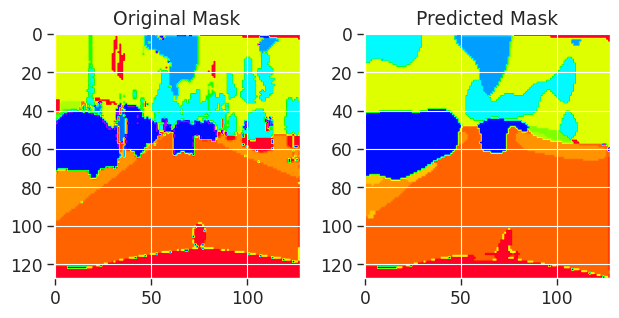

93/93 [==============================] - 29s 315ms/step - loss: 0.4059 - accuracy: 0.8823 - mean_iou: 0.4677 - val_loss: 0.8270 - val_accuracy: 0.8026 - val_mean_iou: 0.2480
Epoch 38/100
1/1 [==============================] - 0s 25ms/steploss: 0.3944 - accuracy: 0.8855 - mean_iou: 0.47


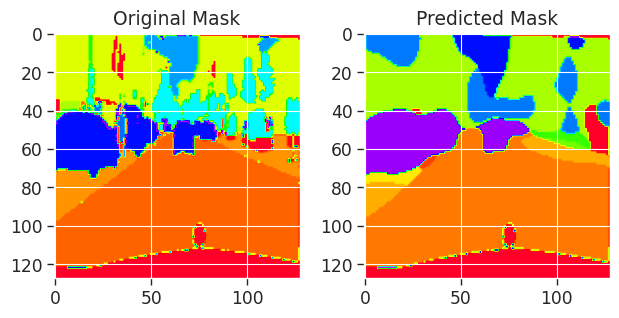

93/93 [==============================] - 29s 318ms/step - loss: 0.3944 - accuracy: 0.8855 - mean_iou: 0.4786 - val_loss: 0.8007 - val_accuracy: 0.8131 - val_mean_iou: 0.2628
Epoch 39/100
1/1 [==============================] - 0s 23ms/steploss: 0.3720 - accuracy: 0.8912 - mean_iou: 0.49


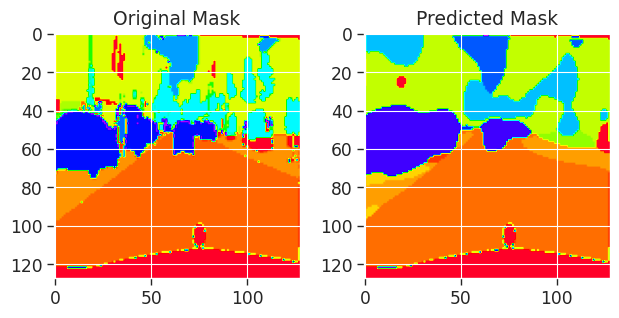

93/93 [==============================] - 29s 317ms/step - loss: 0.3720 - accuracy: 0.8912 - mean_iou: 0.4964 - val_loss: 0.8201 - val_accuracy: 0.8125 - val_mean_iou: 0.2640


In [15]:
input_shape = (128, 128, 3)
batchnorm=True
model = get_fcn_model()
# model.summary()

# Training Configuration
BATCH_SIZE = 32
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("../input/cityscapes-image-pairs/cityscapes_data/val/122.jpg")
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = BATCH_SIZE, validation_data = (X_valid, Y_valid), callbacks=[viz_callback, early_stopping])

In [16]:
# !zip -r file.zip /kaggle/working/fcn_bs16
# from IPython.display import FileLink
# FileLink(r'file.zip')

# serialize model to JSON
model_json = model.to_json()
with open("fcn_bs16.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("fcn_bs16.h5")
print("Saved model to disk")

Saved model to disk


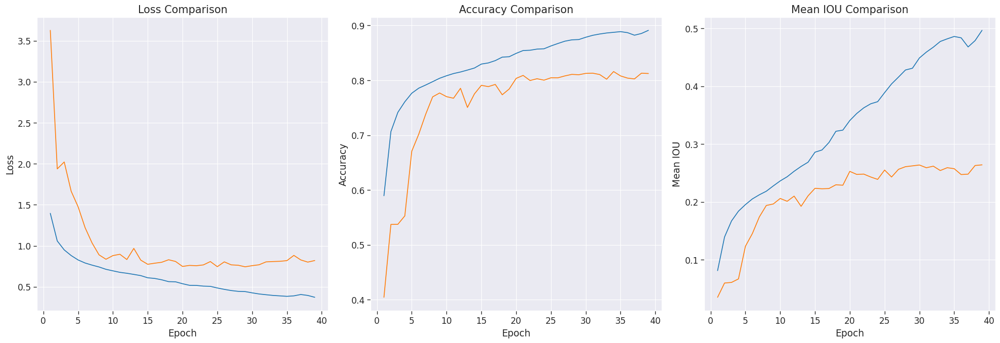

In [19]:
# Training Results
plot_history(history)

# Evaluating on Test data set

In [16]:
#Evaluating Model on test
input_shape = (128, 128, 3)
batchnorm=True
model = get_fcn_model()


BATCH_SIZE = 32
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
# Loads the weights
model.load_weights("/kaggle/input/fcn-bs16-esh5/fcn_bs16_es.h5")

# Re-evaluate the model
print("Test Metrics: ")
out=model.evaluate(X_test, Y_test, verbose=2)


Test Metrics: 
10/10 - 10s - loss: 0.7406 - accuracy: 0.8090 - mean_iou: 0.2666 - 10s/epoch - 957ms/step


## 4.2 UNET

Epoch 1/100


2023-04-25 04:53:29.636747: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/dropout_16/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 0s 439ms/step loss: 1.0345 - accuracy: 0.7162 - mean_iou: 0.14


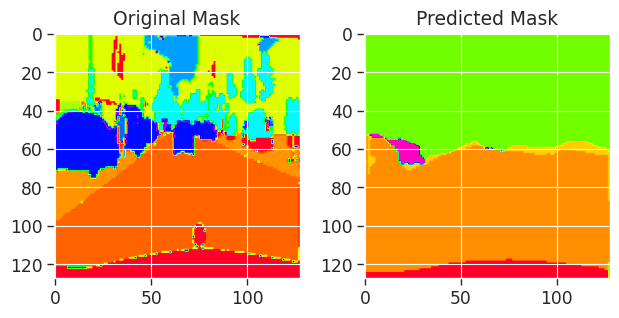

372/372 [==============================] - 60s 126ms/step - loss: 1.0345 - accuracy: 0.7162 - mean_iou: 0.1460 - val_loss: 2.0073 - val_accuracy: 0.5445 - val_mean_iou: 0.0646
Epoch 2/100
1/1 [==============================] - 0s 26ms/step- loss: 0.8139 - accuracy: 0.7806 - mean_iou: 0.20


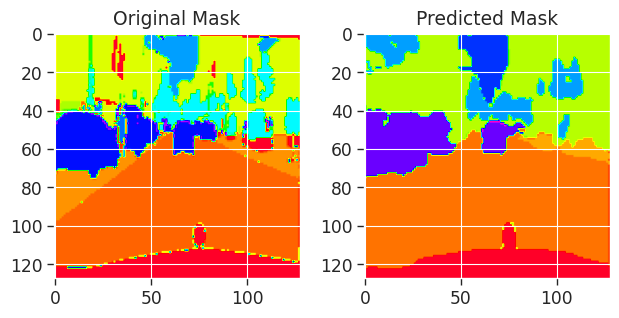

372/372 [==============================] - 42s 114ms/step - loss: 0.8139 - accuracy: 0.7806 - mean_iou: 0.2053 - val_loss: 0.8870 - val_accuracy: 0.7655 - val_mean_iou: 0.1917
Epoch 3/100
1/1 [==============================] - 0s 25ms/step- loss: 0.7375 - accuracy: 0.8006 - mean_iou: 0.22


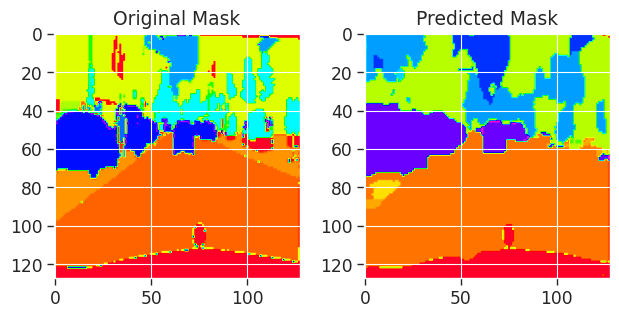

372/372 [==============================] - 43s 115ms/step - loss: 0.7375 - accuracy: 0.8006 - mean_iou: 0.2275 - val_loss: 0.7436 - val_accuracy: 0.8004 - val_mean_iou: 0.2225
Epoch 4/100
1/1 [==============================] - 0s 26ms/step- loss: 0.6871 - accuracy: 0.8127 - mean_iou: 0.24


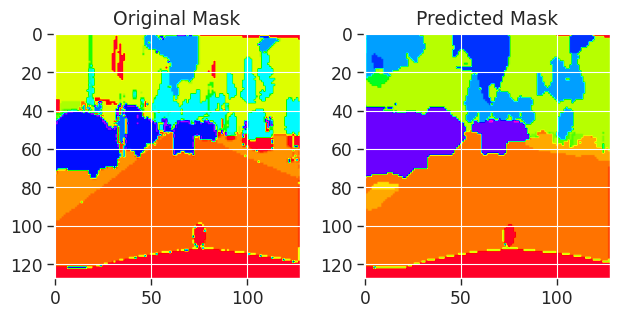

372/372 [==============================] - 43s 116ms/step - loss: 0.6871 - accuracy: 0.8127 - mean_iou: 0.2458 - val_loss: 0.8248 - val_accuracy: 0.7890 - val_mean_iou: 0.2161
Epoch 5/100
1/1 [==============================] - 0s 26ms/step- loss: 0.6535 - accuracy: 0.8219 - mean_iou: 0.26


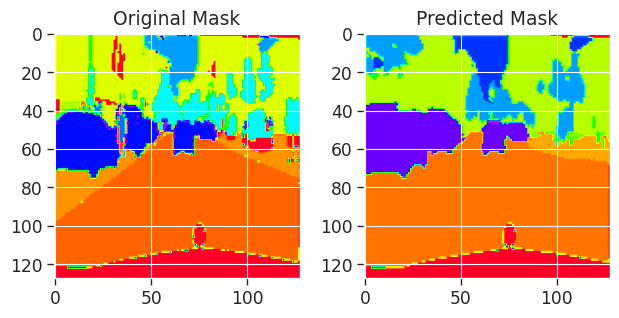

372/372 [==============================] - 43s 117ms/step - loss: 0.6535 - accuracy: 0.8219 - mean_iou: 0.2611 - val_loss: 0.7306 - val_accuracy: 0.8034 - val_mean_iou: 0.2444
Epoch 6/100
1/1 [==============================] - 0s 24ms/step- loss: 0.6248 - accuracy: 0.8274 - mean_iou: 0.27


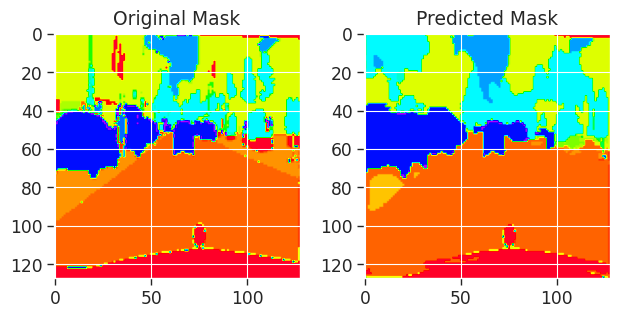

372/372 [==============================] - 43s 115ms/step - loss: 0.6248 - accuracy: 0.8274 - mean_iou: 0.2731 - val_loss: 0.7787 - val_accuracy: 0.7855 - val_mean_iou: 0.2391
Epoch 7/100
1/1 [==============================] - 0s 23ms/step- loss: 0.6040 - accuracy: 0.8327 - mean_iou: 0.28


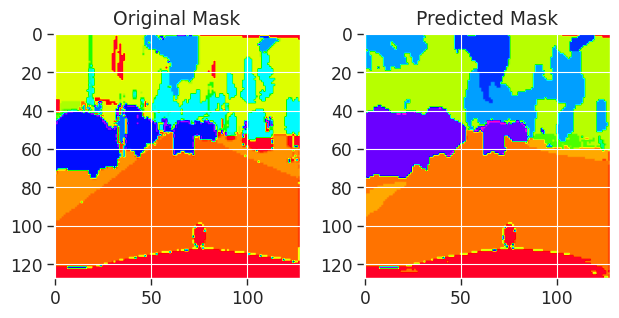

372/372 [==============================] - 43s 116ms/step - loss: 0.6040 - accuracy: 0.8327 - mean_iou: 0.2858 - val_loss: 0.7341 - val_accuracy: 0.8138 - val_mean_iou: 0.2492
Epoch 8/100
1/1 [==============================] - 0s 25ms/step- loss: 0.5851 - accuracy: 0.8368 - mean_iou: 0.29


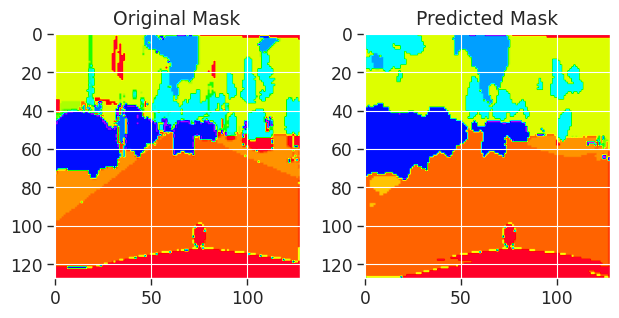

372/372 [==============================] - 42s 114ms/step - loss: 0.5851 - accuracy: 0.8368 - mean_iou: 0.2973 - val_loss: 0.6534 - val_accuracy: 0.8163 - val_mean_iou: 0.2610
Epoch 9/100
1/1 [==============================] - 0s 25ms/step- loss: 0.5684 - accuracy: 0.8407 - mean_iou: 0.30


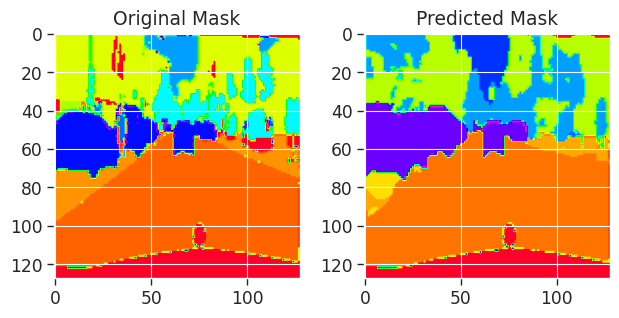

372/372 [==============================] - 43s 116ms/step - loss: 0.5684 - accuracy: 0.8407 - mean_iou: 0.3067 - val_loss: 0.6386 - val_accuracy: 0.8192 - val_mean_iou: 0.2730
Epoch 10/100
1/1 [==============================] - 0s 24ms/step- loss: 0.5519 - accuracy: 0.8443 - mean_iou: 0.31


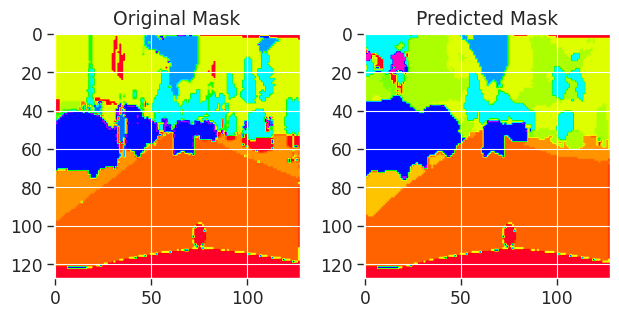

372/372 [==============================] - 43s 116ms/step - loss: 0.5519 - accuracy: 0.8443 - mean_iou: 0.3177 - val_loss: 0.6591 - val_accuracy: 0.8134 - val_mean_iou: 0.2794
Epoch 11/100
1/1 [==============================] - 0s 28ms/step- loss: 0.5391 - accuracy: 0.8475 - mean_iou: 0.32


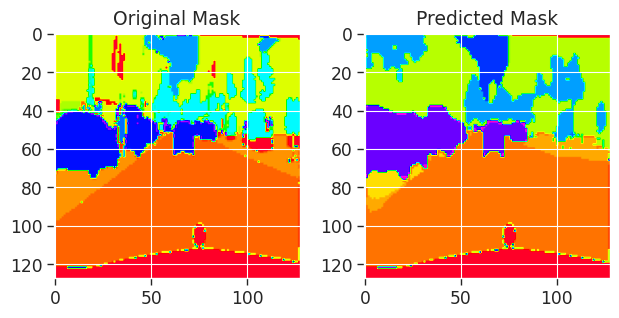

372/372 [==============================] - 42s 114ms/step - loss: 0.5391 - accuracy: 0.8475 - mean_iou: 0.3267 - val_loss: 0.6469 - val_accuracy: 0.8306 - val_mean_iou: 0.2811
Epoch 12/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5248 - accuracy: 0.8508 - mean_iou: 0.33


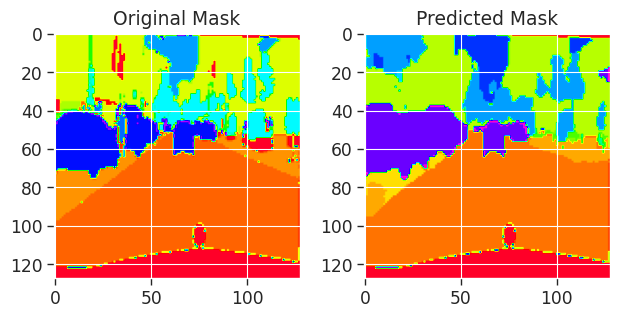

372/372 [==============================] - 42s 114ms/step - loss: 0.5248 - accuracy: 0.8508 - mean_iou: 0.3340 - val_loss: 0.5895 - val_accuracy: 0.8301 - val_mean_iou: 0.2950
Epoch 13/100
1/1 [==============================] - 0s 26ms/step- loss: 0.5118 - accuracy: 0.8541 - mean_iou: 0.34


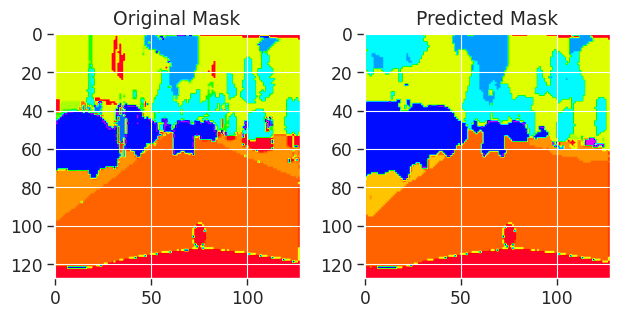

372/372 [==============================] - 43s 116ms/step - loss: 0.5118 - accuracy: 0.8541 - mean_iou: 0.3457 - val_loss: 0.6254 - val_accuracy: 0.8207 - val_mean_iou: 0.2772
Epoch 14/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4978 - accuracy: 0.8574 - mean_iou: 0.35


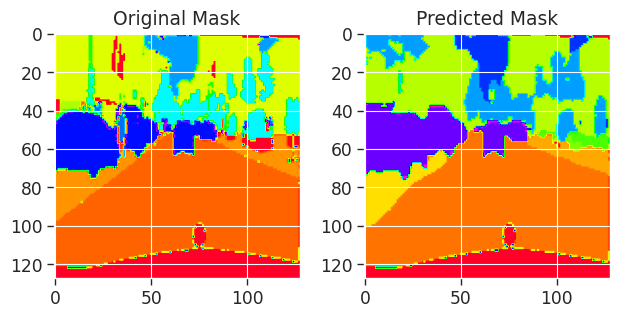

372/372 [==============================] - 43s 117ms/step - loss: 0.4978 - accuracy: 0.8574 - mean_iou: 0.3521 - val_loss: 0.6278 - val_accuracy: 0.8222 - val_mean_iou: 0.2924
Epoch 15/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4892 - accuracy: 0.8598 - mean_iou: 0.36


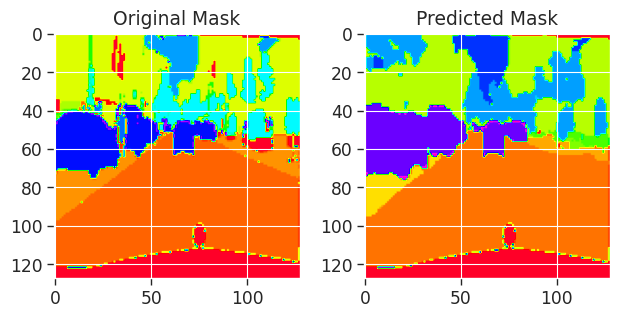

372/372 [==============================] - 43s 116ms/step - loss: 0.4892 - accuracy: 0.8598 - mean_iou: 0.3643 - val_loss: 0.6145 - val_accuracy: 0.8311 - val_mean_iou: 0.2971
Epoch 16/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4764 - accuracy: 0.8631 - mean_iou: 0.37


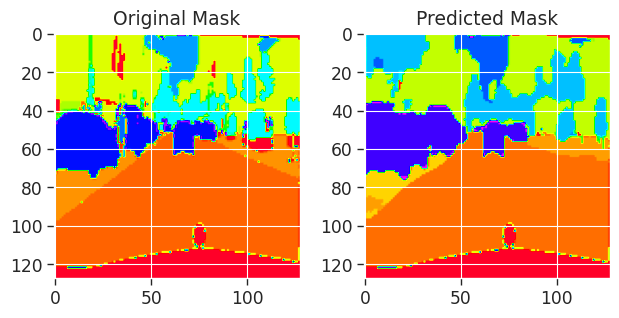

372/372 [==============================] - 42s 114ms/step - loss: 0.4764 - accuracy: 0.8631 - mean_iou: 0.3730 - val_loss: 0.6452 - val_accuracy: 0.8324 - val_mean_iou: 0.2985
Epoch 17/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4725 - accuracy: 0.8644 - mean_iou: 0.37


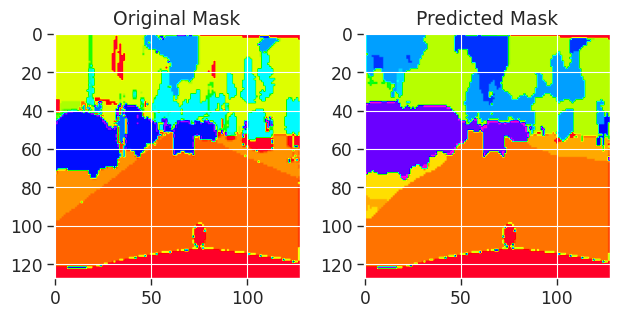

372/372 [==============================] - 43s 116ms/step - loss: 0.4725 - accuracy: 0.8644 - mean_iou: 0.3758 - val_loss: 0.6189 - val_accuracy: 0.8291 - val_mean_iou: 0.2950
Epoch 18/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4588 - accuracy: 0.8677 - mean_iou: 0.38


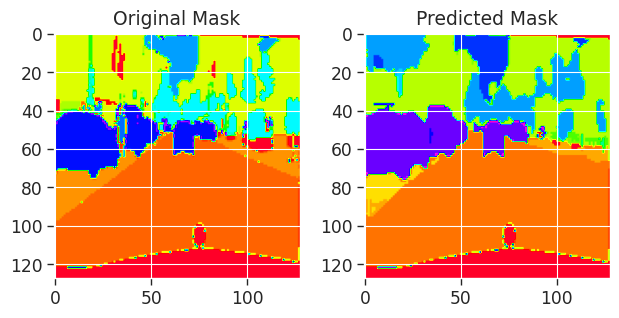

372/372 [==============================] - 44s 118ms/step - loss: 0.4588 - accuracy: 0.8677 - mean_iou: 0.3895 - val_loss: 0.5761 - val_accuracy: 0.8419 - val_mean_iou: 0.3190
Epoch 19/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4471 - accuracy: 0.8714 - mean_iou: 0.39


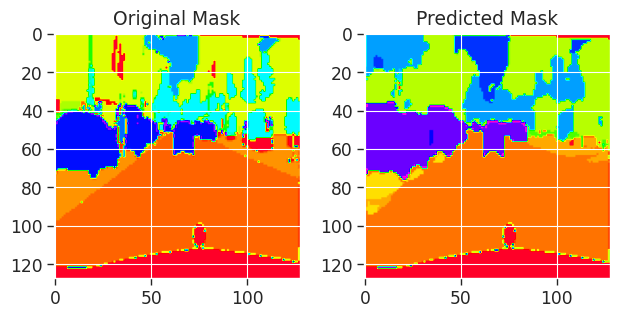

372/372 [==============================] - 43s 116ms/step - loss: 0.4471 - accuracy: 0.8714 - mean_iou: 0.3976 - val_loss: 0.6186 - val_accuracy: 0.8263 - val_mean_iou: 0.2994
Epoch 20/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4401 - accuracy: 0.8731 - mean_iou: 0.40


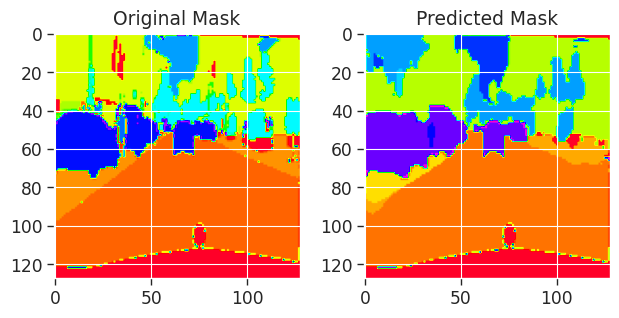

372/372 [==============================] - 42s 114ms/step - loss: 0.4401 - accuracy: 0.8731 - mean_iou: 0.4089 - val_loss: 0.6206 - val_accuracy: 0.8316 - val_mean_iou: 0.3231
Epoch 21/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4350 - accuracy: 0.8741 - mean_iou: 0.40


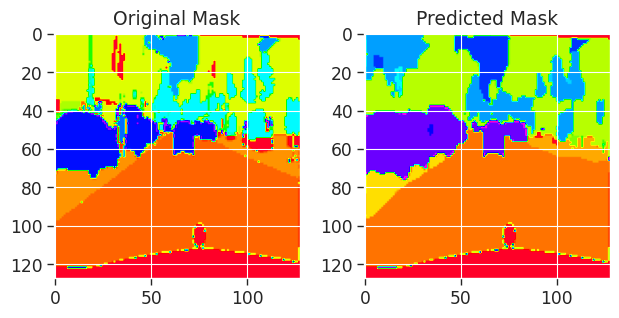

372/372 [==============================] - 43s 116ms/step - loss: 0.4350 - accuracy: 0.8741 - mean_iou: 0.4099 - val_loss: 0.5996 - val_accuracy: 0.8367 - val_mean_iou: 0.3266
Epoch 22/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4255 - accuracy: 0.8769 - mean_iou: 0.41


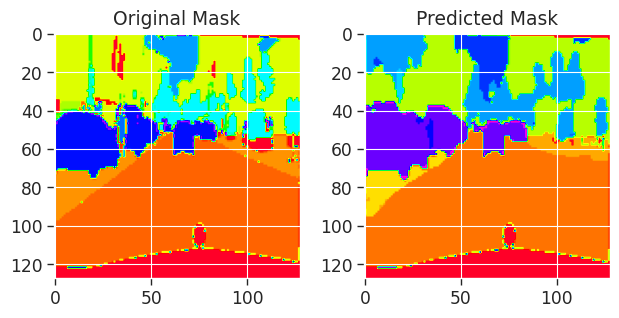

372/372 [==============================] - 42s 114ms/step - loss: 0.4255 - accuracy: 0.8769 - mean_iou: 0.4187 - val_loss: 0.6339 - val_accuracy: 0.8274 - val_mean_iou: 0.3136
Epoch 23/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4103 - accuracy: 0.8809 - mean_iou: 0.43


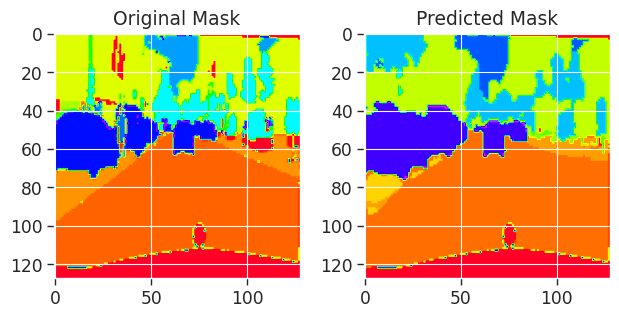

372/372 [==============================] - 42s 113ms/step - loss: 0.4103 - accuracy: 0.8809 - mean_iou: 0.4329 - val_loss: 0.5920 - val_accuracy: 0.8414 - val_mean_iou: 0.3260
Epoch 24/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4029 - accuracy: 0.8834 - mean_iou: 0.43


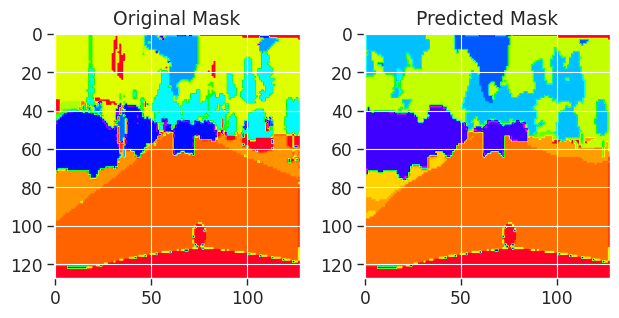

372/372 [==============================] - 44s 118ms/step - loss: 0.4029 - accuracy: 0.8834 - mean_iou: 0.4397 - val_loss: 0.6300 - val_accuracy: 0.8343 - val_mean_iou: 0.3190
Epoch 25/100
1/1 [==============================] - 0s 24ms/step- loss: 0.3920 - accuracy: 0.8859 - mean_iou: 0.45


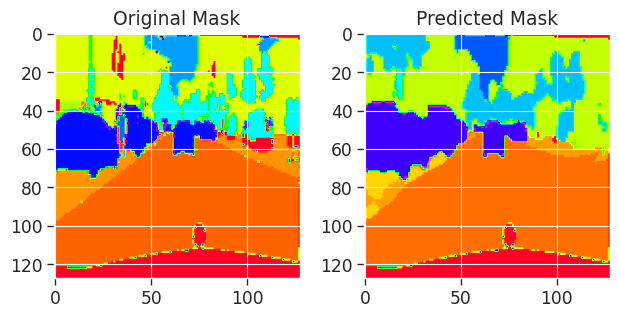

372/372 [==============================] - 43s 117ms/step - loss: 0.3920 - accuracy: 0.8859 - mean_iou: 0.4518 - val_loss: 0.5971 - val_accuracy: 0.8440 - val_mean_iou: 0.3340
Epoch 26/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3918 - accuracy: 0.8864 - mean_iou: 0.45


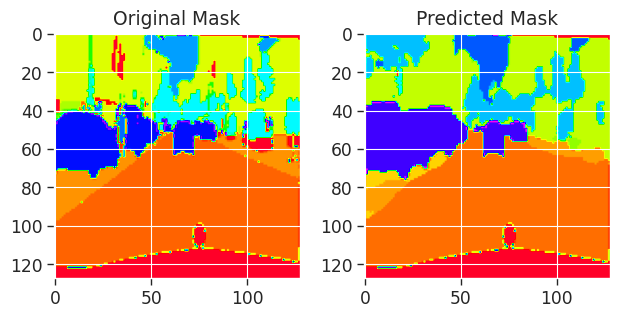

372/372 [==============================] - 42s 114ms/step - loss: 0.3918 - accuracy: 0.8864 - mean_iou: 0.4523 - val_loss: 0.6151 - val_accuracy: 0.8373 - val_mean_iou: 0.3289
Epoch 27/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3906 - accuracy: 0.8869 - mean_iou: 0.45


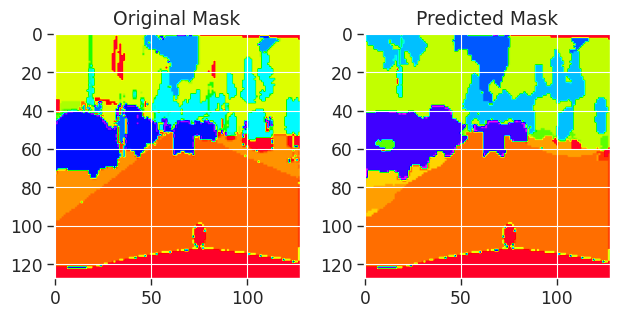

372/372 [==============================] - 42s 114ms/step - loss: 0.3906 - accuracy: 0.8869 - mean_iou: 0.4570 - val_loss: 0.5877 - val_accuracy: 0.8398 - val_mean_iou: 0.3353
Epoch 28/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3797 - accuracy: 0.8896 - mean_iou: 0.46


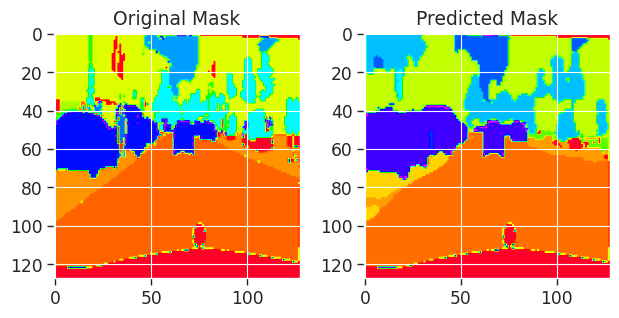

372/372 [==============================] - 42s 114ms/step - loss: 0.3797 - accuracy: 0.8896 - mean_iou: 0.4667 - val_loss: 0.5929 - val_accuracy: 0.8465 - val_mean_iou: 0.3394


In [20]:
input_shape = (128, 128, 3)
batchnorm=True
model = get_unet_model()
# model.summary()

# Training Configuration
BATCH_SIZE = 8
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("../input/cityscapes-image-pairs/cityscapes_data/val/122.jpg")
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = BATCH_SIZE, validation_data = (X_valid, Y_valid), callbacks=[viz_callback, early_stopping])

In [21]:
#model.save('/kaggle/working/unet_bs16')

#from tensorflow import keras
#model = keras.models.load_model('path/to/location')

# serialize model to JSON
model_json = model.to_json()
with open("unet_bs16_es.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("unet_bs8_es.h5")
print("Saved model to disk")

# # later...
 
# # load json and create model
# json_file = open('model.json', 'r')
# loaded_model_json = json_file.read()
# json_file.close()
# loaded_model = model_from_json(loaded_model_json)
# # load weights into new model
# loaded_model.load_weights("model.h5")
# print("Loaded model from disk")
 
# # evaluate loaded model on test data
# loaded_model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
# score = loaded_model.evaluate(X, Y, verbose=0)
# print("%s: %.2f%%" % (loaded_model.metrics_names[1], score[1]*100))

Saved model to disk


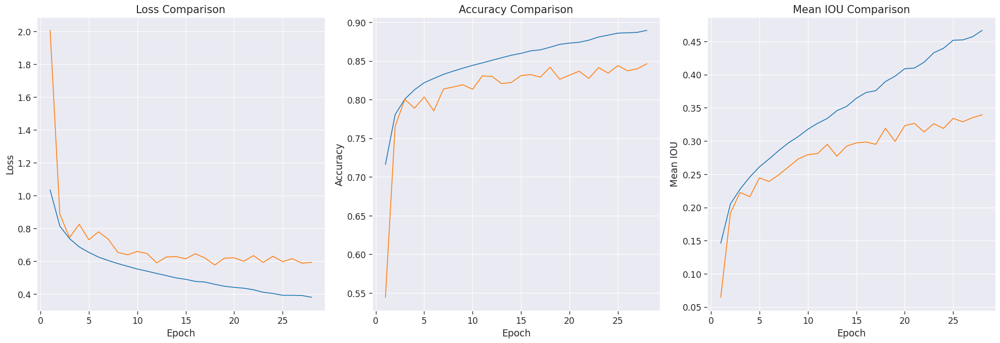

In [22]:
# Training Results
plot_history(history)

# Evaluating on Test data set

In [17]:
#Evaluating Model on test
input_shape = (128, 128, 3)
batchnorm=True
model = get_unet_model()


BATCH_SIZE = 8
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
# Loads the weights
model.load_weights("/kaggle/input/modelweights/unet_bs8_es.h5")

# Re-evaluate the model
print("Test Metrics: ")
out=model.evaluate(X_test, Y_test, verbose=2)


Test Metrics: 
10/10 - 4s - loss: 0.5722 - accuracy: 0.8411 - mean_iou: 0.3224 - 4s/epoch - 441ms/step


## 4.3 UNET + Residual

Epoch 1/100


2023-04-25 14:44:57.901776: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/dropout_16/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 1s 830ms/step loss: 1.0611 - accuracy: 0.7139 - mean_iou: 0.14


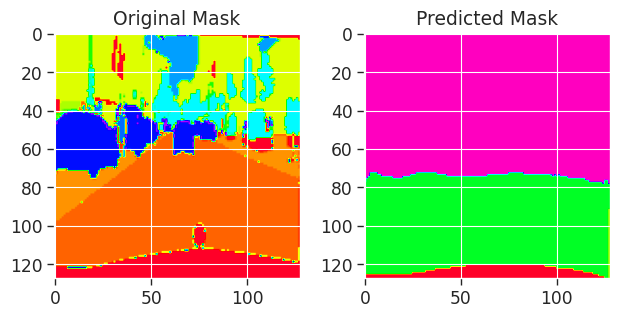

186/186 [==============================] - 69s 251ms/step - loss: 1.0611 - accuracy: 0.7139 - mean_iou: 0.1459 - val_loss: 2.1289 - val_accuracy: 0.5031 - val_mean_iou: 0.0522
Epoch 2/100
1/1 [==============================] - 0s 22ms/step- loss: 0.8000 - accuracy: 0.7846 - mean_iou: 0.20


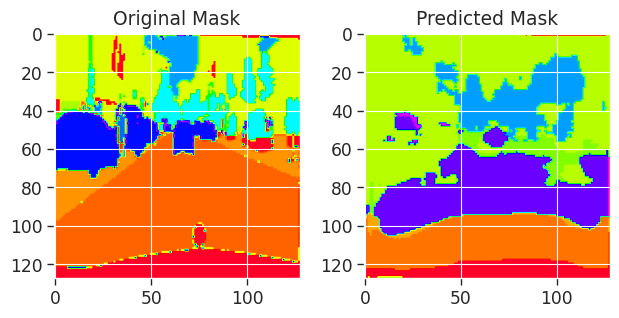

186/186 [==============================] - 41s 222ms/step - loss: 0.8000 - accuracy: 0.7846 - mean_iou: 0.2094 - val_loss: 2.1573 - val_accuracy: 0.4360 - val_mean_iou: 0.0647
Epoch 3/100
1/1 [==============================] - 0s 22ms/step- loss: 0.7222 - accuracy: 0.8042 - mean_iou: 0.23


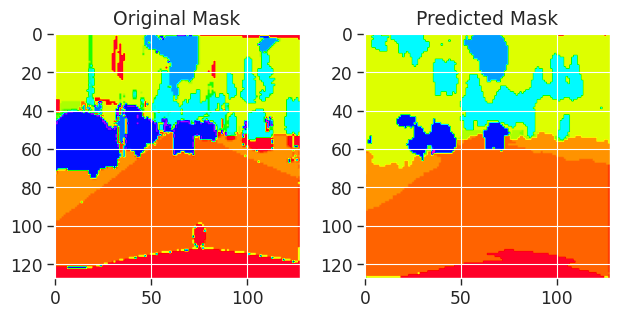

186/186 [==============================] - 41s 220ms/step - loss: 0.7222 - accuracy: 0.8042 - mean_iou: 0.2334 - val_loss: 1.0833 - val_accuracy: 0.7279 - val_mean_iou: 0.1630
Epoch 4/100
1/1 [==============================] - 0s 26ms/step- loss: 0.6686 - accuracy: 0.8170 - mean_iou: 0.25


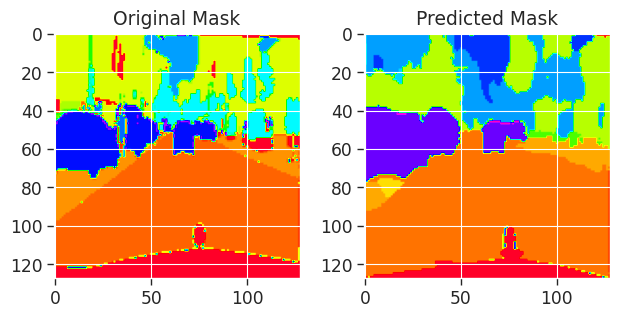

186/186 [==============================] - 42s 225ms/step - loss: 0.6686 - accuracy: 0.8170 - mean_iou: 0.2548 - val_loss: 0.7750 - val_accuracy: 0.7800 - val_mean_iou: 0.2254
Epoch 5/100
1/1 [==============================] - 0s 22ms/step- loss: 0.6291 - accuracy: 0.8257 - mean_iou: 0.27


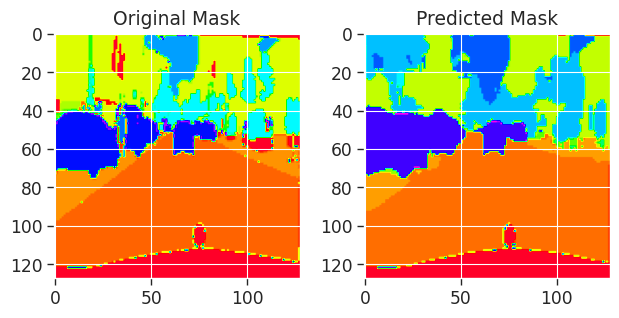

186/186 [==============================] - 42s 227ms/step - loss: 0.6291 - accuracy: 0.8257 - mean_iou: 0.2744 - val_loss: 0.7167 - val_accuracy: 0.8029 - val_mean_iou: 0.2463
Epoch 6/100
1/1 [==============================] - 0s 25ms/step- loss: 0.6021 - accuracy: 0.8320 - mean_iou: 0.28


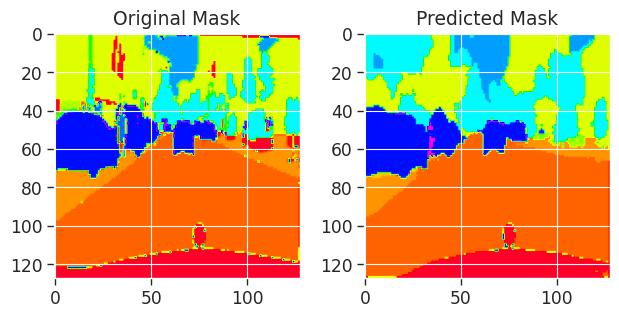

186/186 [==============================] - 41s 219ms/step - loss: 0.6021 - accuracy: 0.8320 - mean_iou: 0.2885 - val_loss: 0.6936 - val_accuracy: 0.8091 - val_mean_iou: 0.2481
Epoch 7/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5811 - accuracy: 0.8370 - mean_iou: 0.30


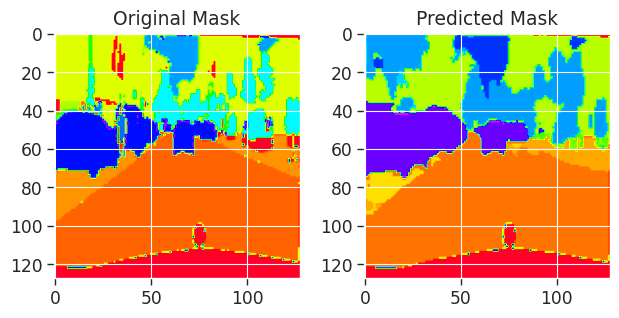

186/186 [==============================] - 41s 219ms/step - loss: 0.5811 - accuracy: 0.8370 - mean_iou: 0.3015 - val_loss: 0.6469 - val_accuracy: 0.8178 - val_mean_iou: 0.2635
Epoch 8/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5574 - accuracy: 0.8422 - mean_iou: 0.31


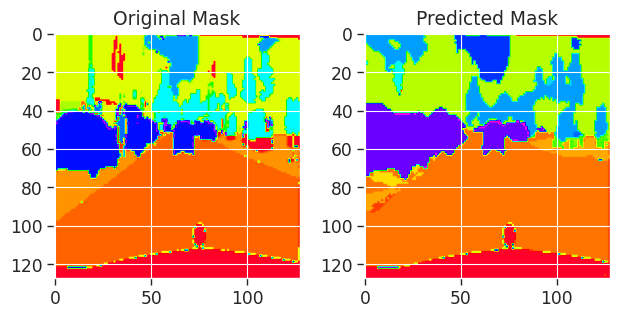

186/186 [==============================] - 40s 218ms/step - loss: 0.5574 - accuracy: 0.8422 - mean_iou: 0.3153 - val_loss: 0.6882 - val_accuracy: 0.8081 - val_mean_iou: 0.2638
Epoch 9/100
1/1 [==============================] - 0s 25ms/step- loss: 0.5419 - accuracy: 0.8458 - mean_iou: 0.32


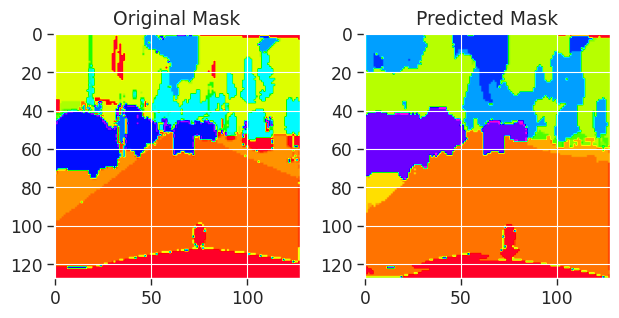

186/186 [==============================] - 41s 219ms/step - loss: 0.5419 - accuracy: 0.8458 - mean_iou: 0.3265 - val_loss: 0.6670 - val_accuracy: 0.8198 - val_mean_iou: 0.2709
Epoch 10/100
1/1 [==============================] - 0s 24ms/step- loss: 0.5322 - accuracy: 0.8481 - mean_iou: 0.33


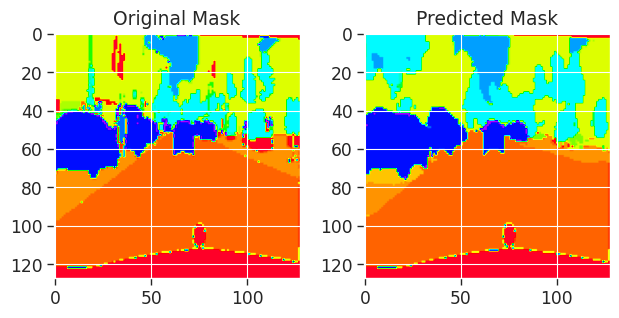

186/186 [==============================] - 41s 219ms/step - loss: 0.5322 - accuracy: 0.8481 - mean_iou: 0.3353 - val_loss: 0.6346 - val_accuracy: 0.8164 - val_mean_iou: 0.2846
Epoch 11/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5143 - accuracy: 0.8519 - mean_iou: 0.34


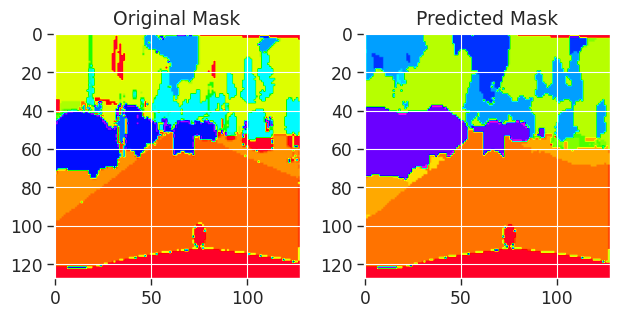

186/186 [==============================] - 41s 219ms/step - loss: 0.5143 - accuracy: 0.8519 - mean_iou: 0.3495 - val_loss: 0.6262 - val_accuracy: 0.8315 - val_mean_iou: 0.2926
Epoch 12/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4972 - accuracy: 0.8568 - mean_iou: 0.36


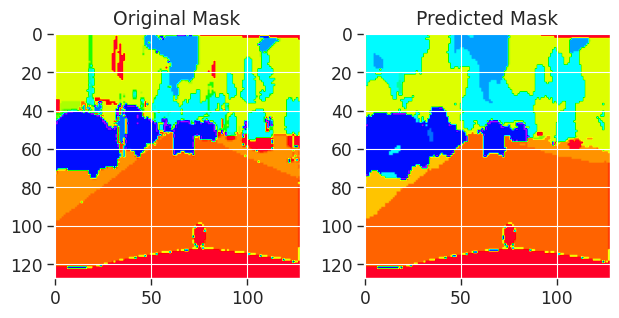

186/186 [==============================] - 42s 227ms/step - loss: 0.4972 - accuracy: 0.8568 - mean_iou: 0.3631 - val_loss: 0.6993 - val_accuracy: 0.8162 - val_mean_iou: 0.2827
Epoch 13/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4846 - accuracy: 0.8606 - mean_iou: 0.37


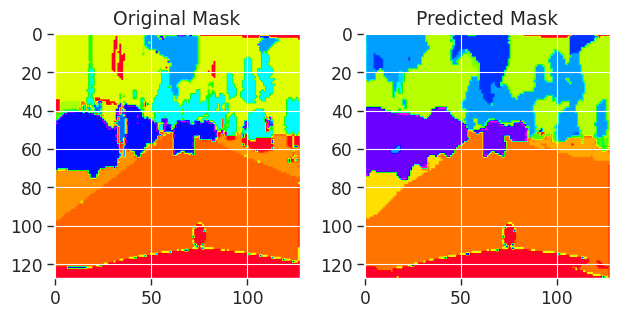

186/186 [==============================] - 42s 223ms/step - loss: 0.4846 - accuracy: 0.8606 - mean_iou: 0.3708 - val_loss: 0.6853 - val_accuracy: 0.8159 - val_mean_iou: 0.2855
Epoch 14/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4712 - accuracy: 0.8645 - mean_iou: 0.38


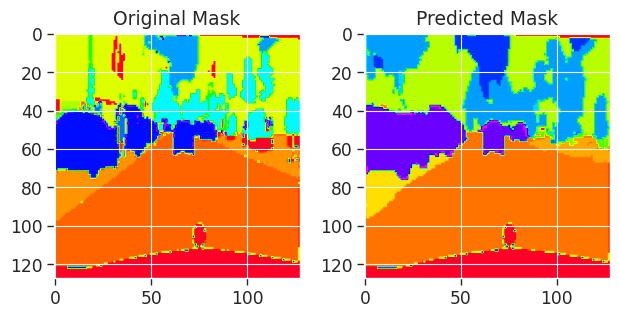

186/186 [==============================] - 42s 225ms/step - loss: 0.4712 - accuracy: 0.8645 - mean_iou: 0.3819 - val_loss: 0.6989 - val_accuracy: 0.8185 - val_mean_iou: 0.2935
Epoch 15/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4613 - accuracy: 0.8667 - mean_iou: 0.39


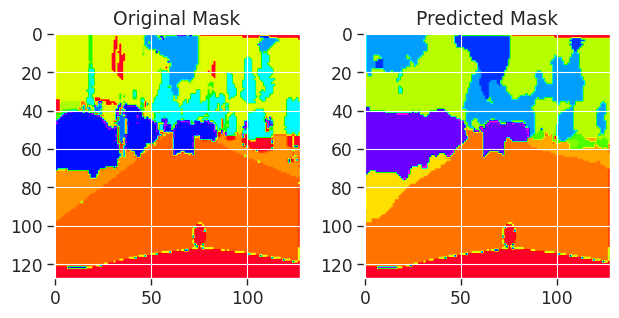

186/186 [==============================] - 43s 230ms/step - loss: 0.4613 - accuracy: 0.8667 - mean_iou: 0.3964 - val_loss: 0.6131 - val_accuracy: 0.8310 - val_mean_iou: 0.3011
Epoch 16/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4472 - accuracy: 0.8704 - mean_iou: 0.40


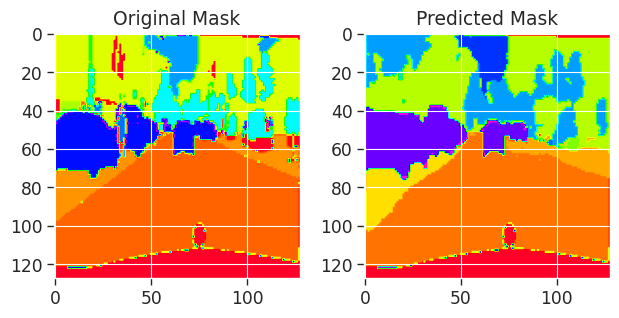

186/186 [==============================] - 41s 218ms/step - loss: 0.4472 - accuracy: 0.8704 - mean_iou: 0.4080 - val_loss: 0.6772 - val_accuracy: 0.8184 - val_mean_iou: 0.2915
Epoch 17/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4362 - accuracy: 0.8737 - mean_iou: 0.41


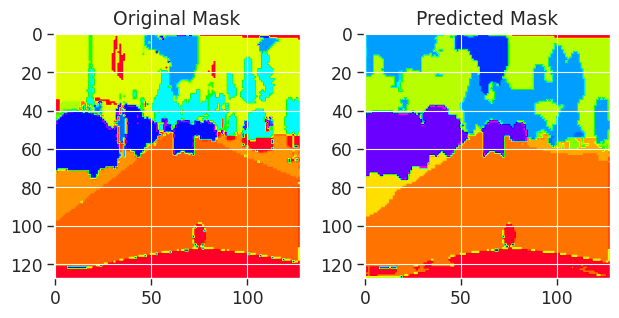

186/186 [==============================] - 41s 223ms/step - loss: 0.4362 - accuracy: 0.8737 - mean_iou: 0.4152 - val_loss: 0.6886 - val_accuracy: 0.8131 - val_mean_iou: 0.2838
Epoch 18/100
1/1 [==============================] - 0s 32ms/step- loss: 0.4237 - accuracy: 0.8775 - mean_iou: 0.42


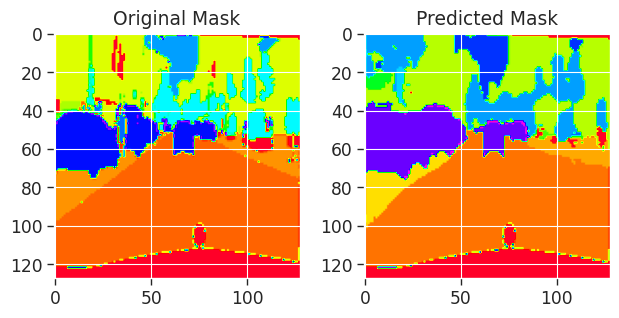

186/186 [==============================] - 42s 229ms/step - loss: 0.4237 - accuracy: 0.8775 - mean_iou: 0.4289 - val_loss: 0.5859 - val_accuracy: 0.8422 - val_mean_iou: 0.3278
Epoch 19/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4216 - accuracy: 0.8775 - mean_iou: 0.43


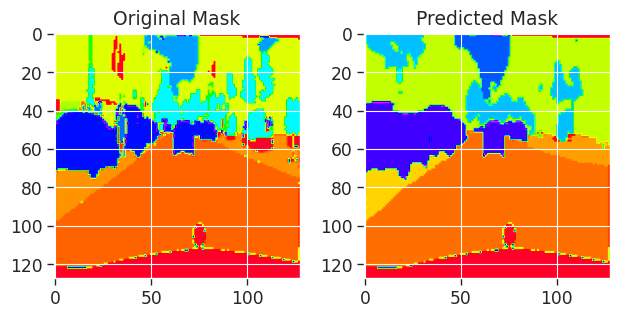

186/186 [==============================] - 42s 224ms/step - loss: 0.4216 - accuracy: 0.8775 - mean_iou: 0.4346 - val_loss: 0.6190 - val_accuracy: 0.8327 - val_mean_iou: 0.3151
Epoch 20/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4119 - accuracy: 0.8802 - mean_iou: 0.43


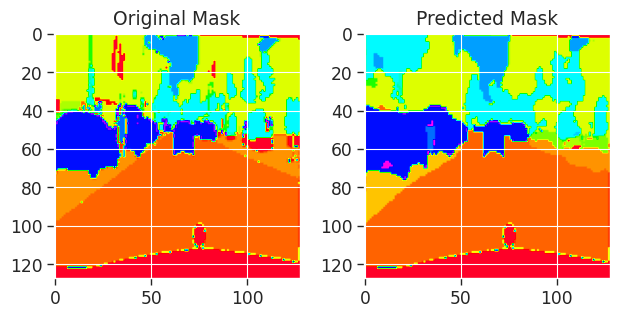

186/186 [==============================] - 42s 224ms/step - loss: 0.4119 - accuracy: 0.8802 - mean_iou: 0.4399 - val_loss: 0.6543 - val_accuracy: 0.8212 - val_mean_iou: 0.3058
Epoch 21/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3939 - accuracy: 0.8854 - mean_iou: 0.45


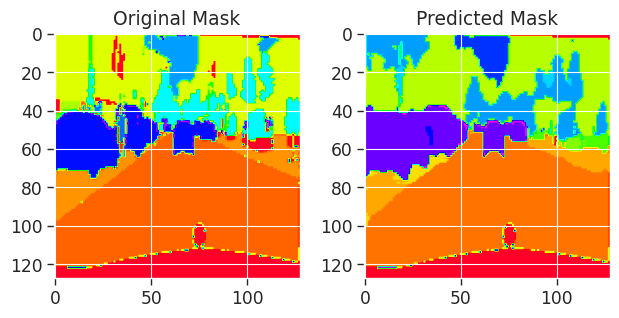

186/186 [==============================] - 42s 224ms/step - loss: 0.3939 - accuracy: 0.8854 - mean_iou: 0.4592 - val_loss: 0.6418 - val_accuracy: 0.8288 - val_mean_iou: 0.3240
Epoch 22/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3807 - accuracy: 0.8892 - mean_iou: 0.47


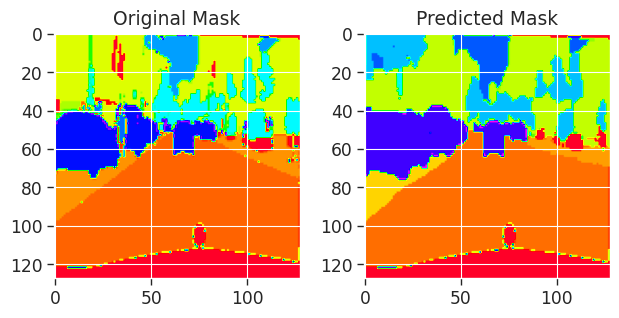

186/186 [==============================] - 41s 218ms/step - loss: 0.3807 - accuracy: 0.8892 - mean_iou: 0.4727 - val_loss: 0.6732 - val_accuracy: 0.8303 - val_mean_iou: 0.3231
Epoch 23/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3693 - accuracy: 0.8922 - mean_iou: 0.48


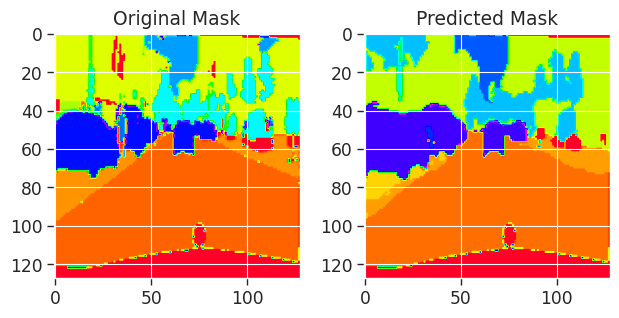

186/186 [==============================] - 41s 219ms/step - loss: 0.3693 - accuracy: 0.8922 - mean_iou: 0.4854 - val_loss: 0.6068 - val_accuracy: 0.8409 - val_mean_iou: 0.3360
Epoch 24/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3620 - accuracy: 0.8941 - mean_iou: 0.49


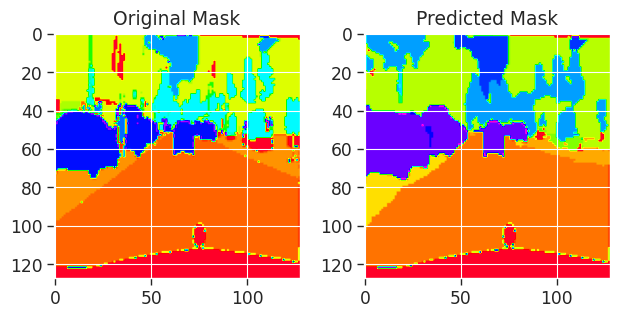

186/186 [==============================] - 41s 219ms/step - loss: 0.3620 - accuracy: 0.8941 - mean_iou: 0.4911 - val_loss: 0.6376 - val_accuracy: 0.8397 - val_mean_iou: 0.3331
Epoch 25/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3523 - accuracy: 0.8967 - mean_iou: 0.50


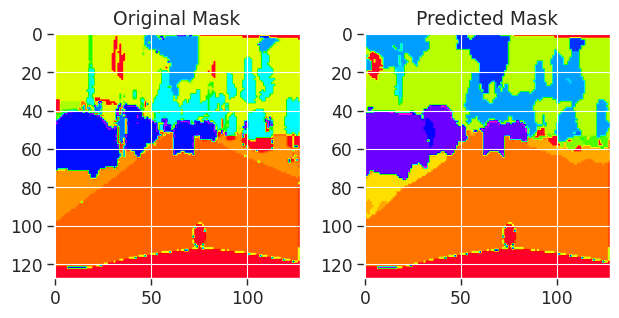

186/186 [==============================] - 41s 220ms/step - loss: 0.3523 - accuracy: 0.8967 - mean_iou: 0.5013 - val_loss: 0.6235 - val_accuracy: 0.8448 - val_mean_iou: 0.3369
Epoch 26/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3417 - accuracy: 0.8996 - mean_iou: 0.51


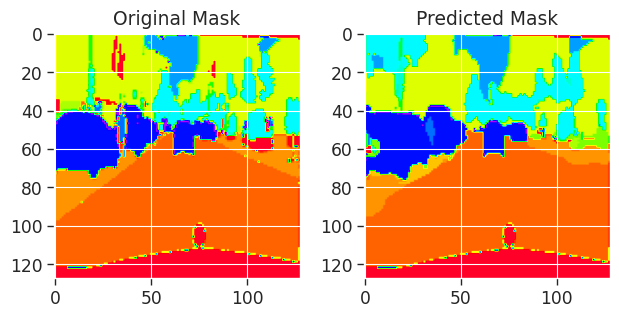

186/186 [==============================] - 42s 224ms/step - loss: 0.3417 - accuracy: 0.8996 - mean_iou: 0.5133 - val_loss: 0.6603 - val_accuracy: 0.8346 - val_mean_iou: 0.3361
Epoch 27/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3461 - accuracy: 0.8980 - mean_iou: 0.51


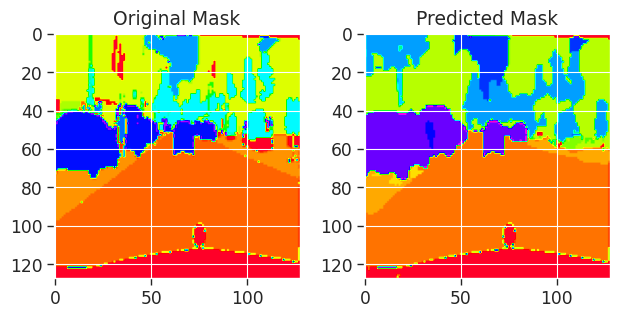

186/186 [==============================] - 41s 223ms/step - loss: 0.3461 - accuracy: 0.8980 - mean_iou: 0.5102 - val_loss: 0.6360 - val_accuracy: 0.8413 - val_mean_iou: 0.3286
Epoch 28/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3306 - accuracy: 0.9024 - mean_iou: 0.52


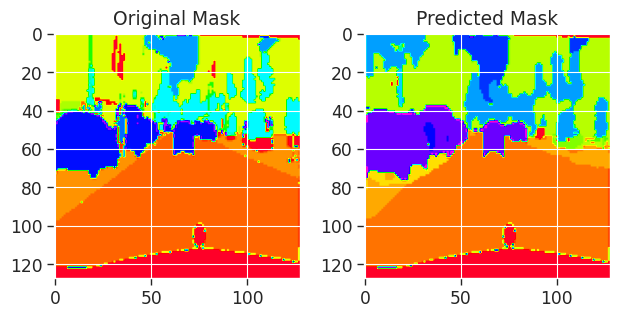

186/186 [==============================] - 42s 228ms/step - loss: 0.3306 - accuracy: 0.9024 - mean_iou: 0.5246 - val_loss: 0.6048 - val_accuracy: 0.8437 - val_mean_iou: 0.3446


In [30]:
input_shape = (128, 128, 3)
batchnorm=True
model = get_resunet_model()
# model.summary()

# Training Configuration
BATCH_SIZE = 16
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("../input/cityscapes-image-pairs/cityscapes_data/val/122.jpg")
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = BATCH_SIZE, validation_data = (X_valid, Y_valid), callbacks=[viz_callback, early_stopping])

In [31]:
# serialize model to JSON
model_json = model.to_json()
with open("unet_res_bs16_es.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("unet_res_bs16_es.h5")
print("Saved model to disk")

Saved model to disk


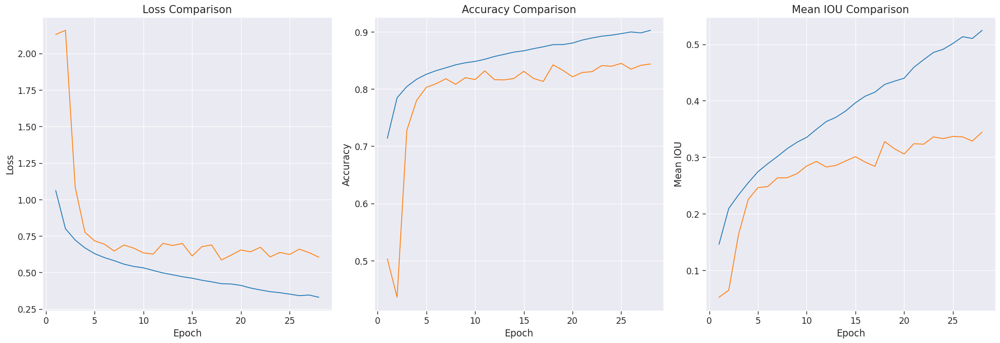

In [35]:
# Training Results
plot_history(history)

# Evaluating on Test data set

In [19]:
#Evaluating Model on test
input_shape = (128, 128, 3)
batchnorm=True
model = get_resunet_model()


BATCH_SIZE = 16
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
# Loads the weights
model.load_weights("/kaggle/input/modelweights/unet_res_bs16_es.h5")

# Re-evaluate the model
print("Test Metrics: ")
out=model.evaluate(X_test, Y_test, verbose=2)

Test Metrics: 
10/10 - 2s - loss: 0.5838 - accuracy: 0.8416 - mean_iou: 0.3260 - 2s/epoch - 214ms/step


## 4.4 UNET + Attention

Epoch 1/100


2023-04-25 15:08:15.862612: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/dropout_40/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 1s 882ms/step loss: 1.0167 - accuracy: 0.7220 - mean_iou: 0.15


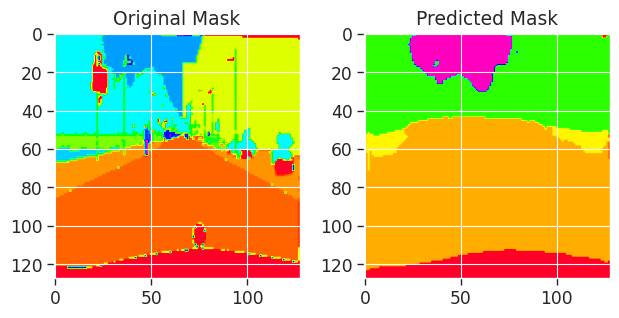

372/372 [==============================] - 76s 151ms/step - loss: 1.0167 - accuracy: 0.7220 - mean_iou: 0.1516 - val_loss: 2.5774 - val_accuracy: 0.5559 - val_mean_iou: 0.0726
Epoch 2/100
1/1 [==============================] - 0s 28ms/step- loss: 0.8093 - accuracy: 0.7812 - mean_iou: 0.20


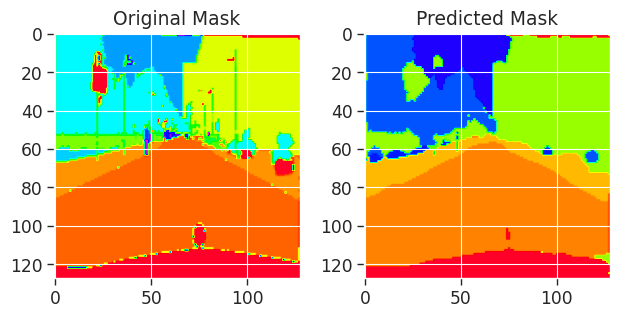

372/372 [==============================] - 51s 137ms/step - loss: 0.8093 - accuracy: 0.7812 - mean_iou: 0.2085 - val_loss: 0.8606 - val_accuracy: 0.7603 - val_mean_iou: 0.1955
Epoch 3/100
1/1 [==============================] - 0s 26ms/step- loss: 0.7363 - accuracy: 0.7998 - mean_iou: 0.23


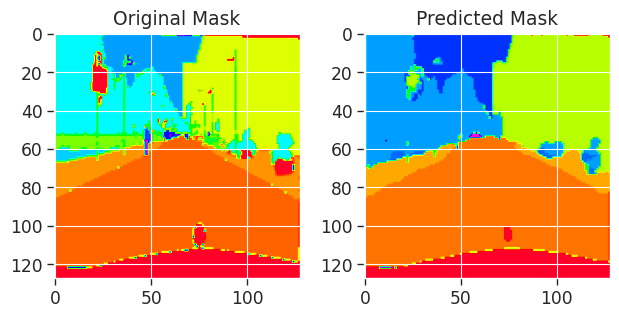

372/372 [==============================] - 52s 139ms/step - loss: 0.7363 - accuracy: 0.7998 - mean_iou: 0.2310 - val_loss: 0.7890 - val_accuracy: 0.7950 - val_mean_iou: 0.2229
Epoch 4/100
1/1 [==============================] - 0s 26ms/step- loss: 0.6906 - accuracy: 0.8122 - mean_iou: 0.24


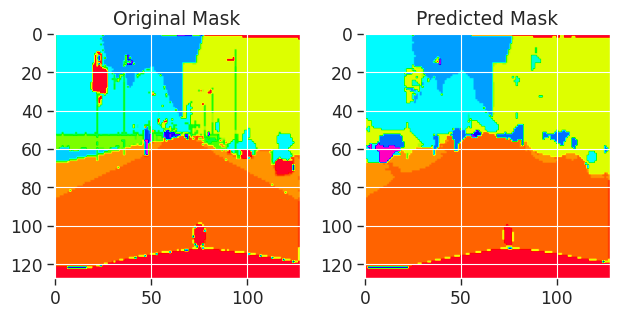

372/372 [==============================] - 52s 139ms/step - loss: 0.6906 - accuracy: 0.8122 - mean_iou: 0.2467 - val_loss: 0.7937 - val_accuracy: 0.7816 - val_mean_iou: 0.2164
Epoch 5/100
1/1 [==============================] - 0s 27ms/step- loss: 0.6551 - accuracy: 0.8199 - mean_iou: 0.25


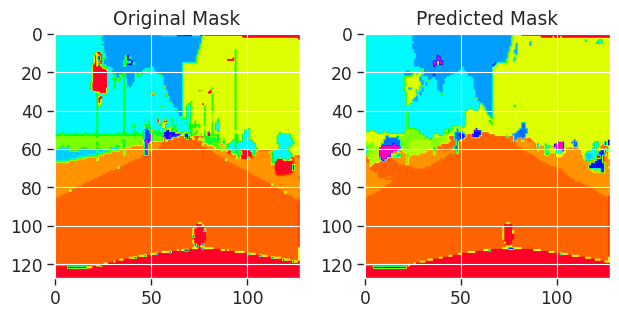

372/372 [==============================] - 52s 139ms/step - loss: 0.6551 - accuracy: 0.8199 - mean_iou: 0.2594 - val_loss: 0.7314 - val_accuracy: 0.7917 - val_mean_iou: 0.2308
Epoch 6/100
1/1 [==============================] - 0s 28ms/step- loss: 0.6329 - accuracy: 0.8251 - mean_iou: 0.26


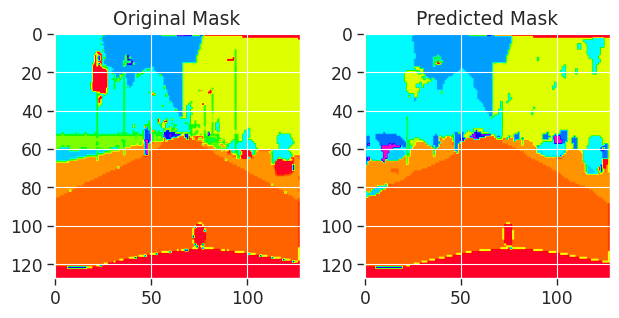

372/372 [==============================] - 52s 139ms/step - loss: 0.6329 - accuracy: 0.8251 - mean_iou: 0.2672 - val_loss: 0.7191 - val_accuracy: 0.8060 - val_mean_iou: 0.2470
Epoch 7/100
1/1 [==============================] - 0s 48ms/step- loss: 0.6071 - accuracy: 0.8313 - mean_iou: 0.28


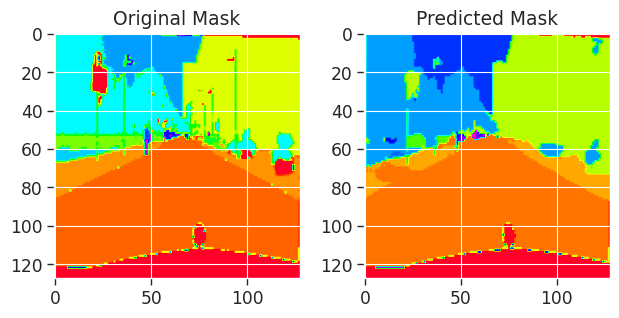

372/372 [==============================] - 52s 139ms/step - loss: 0.6071 - accuracy: 0.8313 - mean_iou: 0.2804 - val_loss: 0.6622 - val_accuracy: 0.8196 - val_mean_iou: 0.2514
Epoch 8/100
1/1 [==============================] - 0s 27ms/step- loss: 0.5943 - accuracy: 0.8342 - mean_iou: 0.28


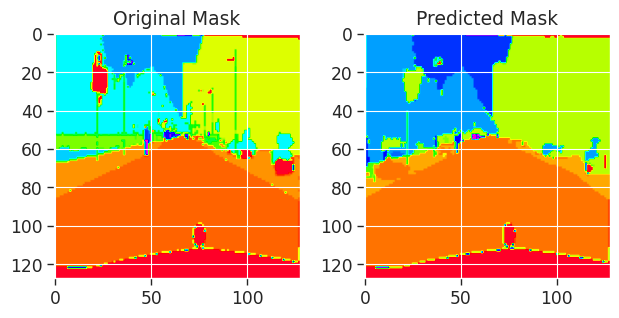

372/372 [==============================] - 51s 137ms/step - loss: 0.5943 - accuracy: 0.8342 - mean_iou: 0.2897 - val_loss: 0.6591 - val_accuracy: 0.8137 - val_mean_iou: 0.2642
Epoch 9/100
1/1 [==============================] - 0s 31ms/step- loss: 0.5768 - accuracy: 0.8382 - mean_iou: 0.30


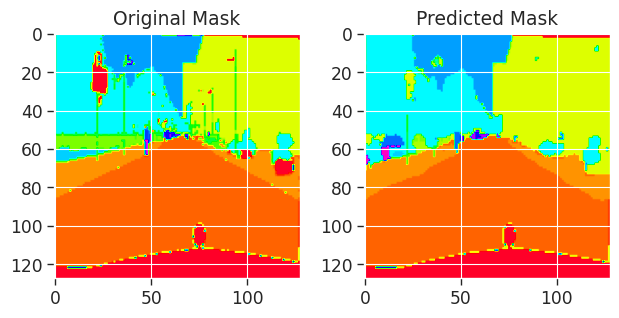

372/372 [==============================] - 51s 137ms/step - loss: 0.5768 - accuracy: 0.8382 - mean_iou: 0.3011 - val_loss: 0.6660 - val_accuracy: 0.8173 - val_mean_iou: 0.2660
Epoch 10/100
1/1 [==============================] - 0s 26ms/step- loss: 0.5605 - accuracy: 0.8417 - mean_iou: 0.30


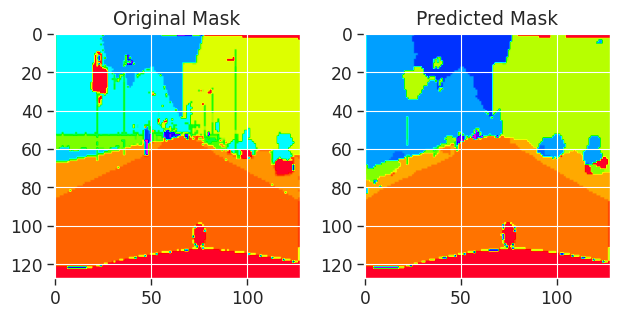

372/372 [==============================] - 51s 138ms/step - loss: 0.5605 - accuracy: 0.8417 - mean_iou: 0.3098 - val_loss: 0.6946 - val_accuracy: 0.8077 - val_mean_iou: 0.2461
Epoch 11/100
1/1 [==============================] - 0s 27ms/step- loss: 0.5472 - accuracy: 0.8450 - mean_iou: 0.31


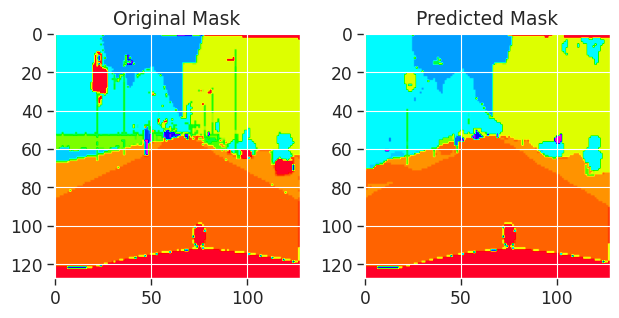

372/372 [==============================] - 51s 138ms/step - loss: 0.5472 - accuracy: 0.8450 - mean_iou: 0.3170 - val_loss: 0.6361 - val_accuracy: 0.8190 - val_mean_iou: 0.2783
Epoch 12/100
1/1 [==============================] - 0s 26ms/step- loss: 0.5303 - accuracy: 0.8490 - mean_iou: 0.33


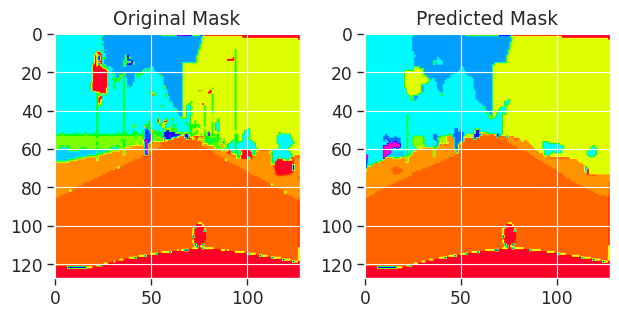

372/372 [==============================] - 52s 140ms/step - loss: 0.5303 - accuracy: 0.8490 - mean_iou: 0.3306 - val_loss: 0.6236 - val_accuracy: 0.8191 - val_mean_iou: 0.2843
Epoch 13/100
1/1 [==============================] - 0s 28ms/step- loss: 0.5200 - accuracy: 0.8518 - mean_iou: 0.33


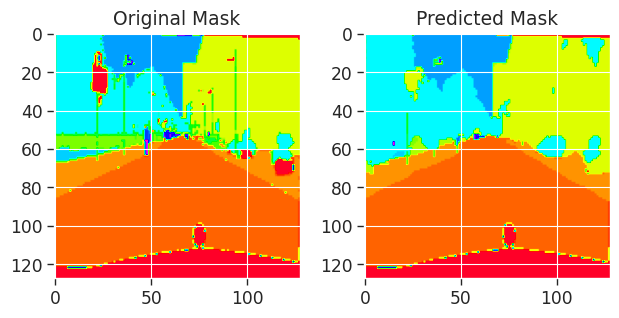

372/372 [==============================] - 51s 138ms/step - loss: 0.5200 - accuracy: 0.8518 - mean_iou: 0.3388 - val_loss: 0.6471 - val_accuracy: 0.8207 - val_mean_iou: 0.2851
Epoch 14/100
1/1 [==============================] - 0s 26ms/step- loss: 0.5122 - accuracy: 0.8536 - mean_iou: 0.34


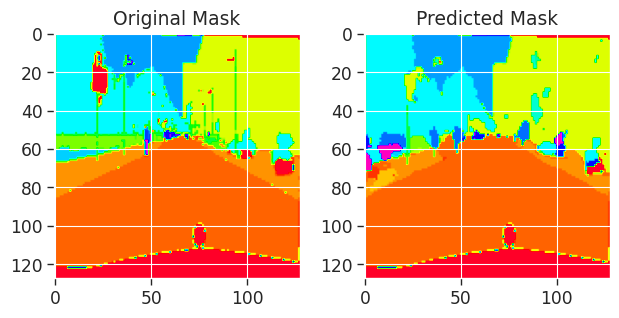

372/372 [==============================] - 51s 137ms/step - loss: 0.5122 - accuracy: 0.8536 - mean_iou: 0.3429 - val_loss: 0.6485 - val_accuracy: 0.8151 - val_mean_iou: 0.2823
Epoch 15/100
1/1 [==============================] - 0s 27ms/step- loss: 0.5037 - accuracy: 0.8561 - mean_iou: 0.34


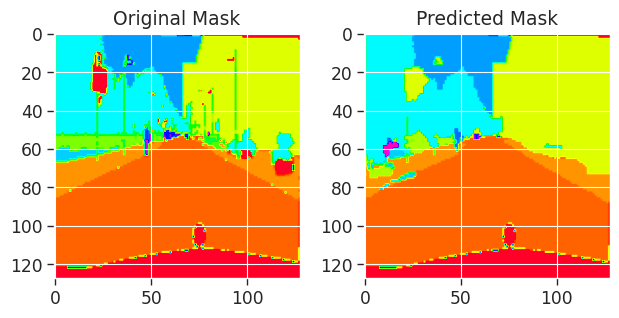

372/372 [==============================] - 51s 138ms/step - loss: 0.5037 - accuracy: 0.8561 - mean_iou: 0.3493 - val_loss: 0.6768 - val_accuracy: 0.8216 - val_mean_iou: 0.2845
Epoch 16/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4888 - accuracy: 0.8595 - mean_iou: 0.36


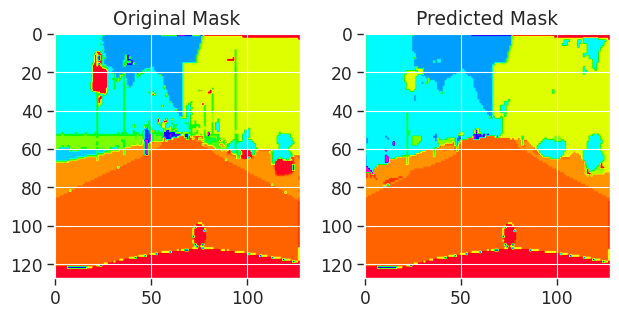

372/372 [==============================] - 51s 138ms/step - loss: 0.4888 - accuracy: 0.8595 - mean_iou: 0.3622 - val_loss: 0.6292 - val_accuracy: 0.8203 - val_mean_iou: 0.3033
Epoch 17/100
1/1 [==============================] - 0s 27ms/step- loss: 0.4901 - accuracy: 0.8599 - mean_iou: 0.36


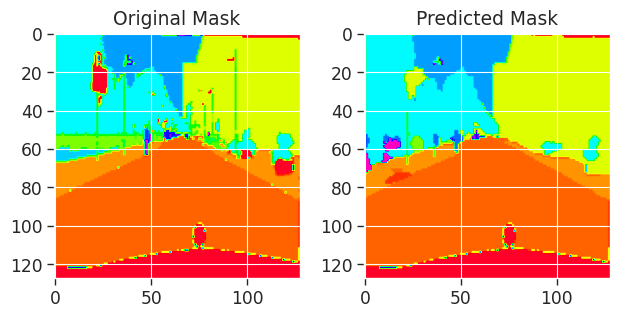

372/372 [==============================] - 51s 138ms/step - loss: 0.4901 - accuracy: 0.8599 - mean_iou: 0.3649 - val_loss: 0.6154 - val_accuracy: 0.8298 - val_mean_iou: 0.2965
Epoch 18/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4756 - accuracy: 0.8636 - mean_iou: 0.37


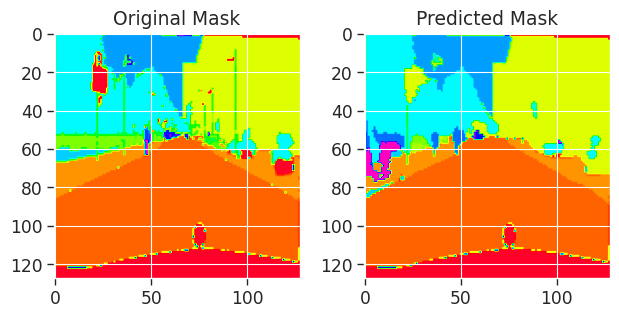

372/372 [==============================] - 51s 138ms/step - loss: 0.4756 - accuracy: 0.8636 - mean_iou: 0.3727 - val_loss: 0.6568 - val_accuracy: 0.8248 - val_mean_iou: 0.2859
Epoch 19/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4573 - accuracy: 0.8685 - mean_iou: 0.38


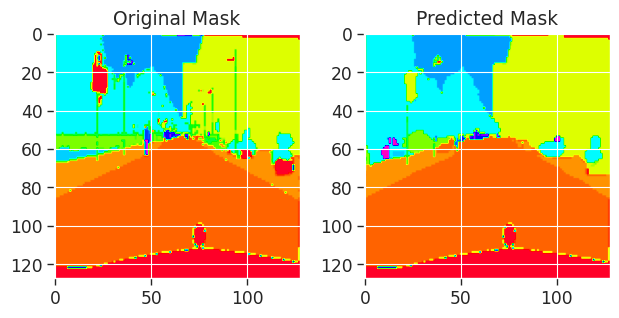

372/372 [==============================] - 51s 137ms/step - loss: 0.4573 - accuracy: 0.8685 - mean_iou: 0.3847 - val_loss: 0.6056 - val_accuracy: 0.8336 - val_mean_iou: 0.3030
Epoch 20/100
1/1 [==============================] - 0s 28ms/step- loss: 0.4543 - accuracy: 0.8691 - mean_iou: 0.38


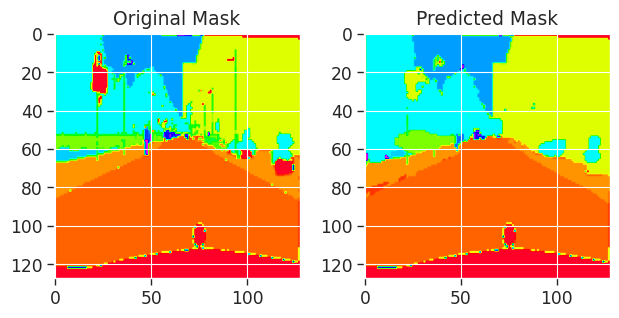

372/372 [==============================] - 51s 138ms/step - loss: 0.4543 - accuracy: 0.8691 - mean_iou: 0.3883 - val_loss: 0.6507 - val_accuracy: 0.8179 - val_mean_iou: 0.3094
Epoch 21/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4402 - accuracy: 0.8731 - mean_iou: 0.40


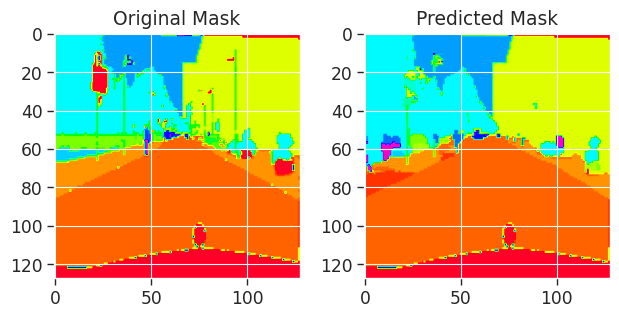

372/372 [==============================] - 51s 138ms/step - loss: 0.4402 - accuracy: 0.8731 - mean_iou: 0.4030 - val_loss: 0.6115 - val_accuracy: 0.8334 - val_mean_iou: 0.3113
Epoch 22/100
1/1 [==============================] - 0s 28ms/step- loss: 0.4446 - accuracy: 0.8718 - mean_iou: 0.39


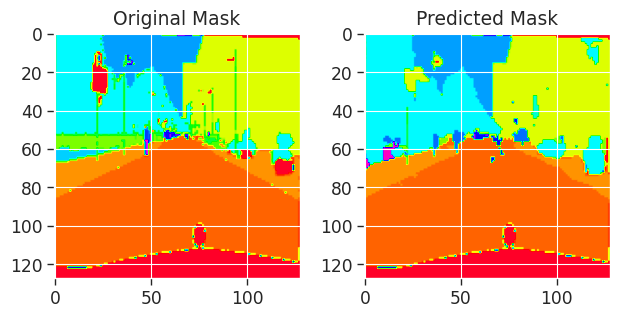

372/372 [==============================] - 51s 138ms/step - loss: 0.4446 - accuracy: 0.8718 - mean_iou: 0.3990 - val_loss: 0.6933 - val_accuracy: 0.8089 - val_mean_iou: 0.2847
Epoch 23/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4479 - accuracy: 0.8710 - mean_iou: 0.40


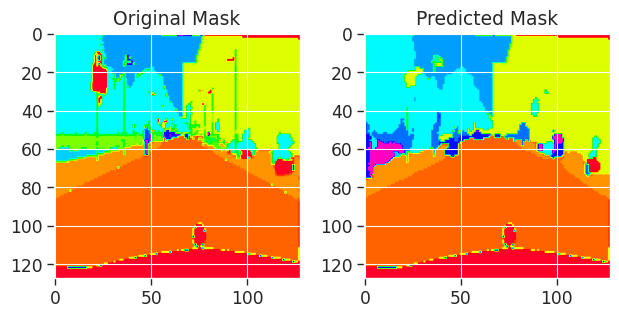

372/372 [==============================] - 51s 137ms/step - loss: 0.4479 - accuracy: 0.8710 - mean_iou: 0.4022 - val_loss: 0.7368 - val_accuracy: 0.8055 - val_mean_iou: 0.2751
Epoch 24/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4230 - accuracy: 0.8775 - mean_iou: 0.41


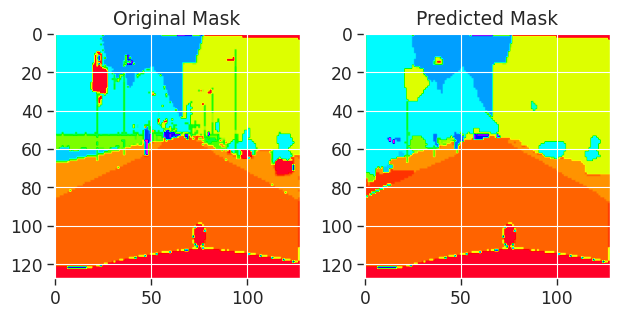

372/372 [==============================] - 51s 138ms/step - loss: 0.4230 - accuracy: 0.8775 - mean_iou: 0.4174 - val_loss: 0.6165 - val_accuracy: 0.8383 - val_mean_iou: 0.3207
Epoch 25/100
1/1 [==============================] - 0s 27ms/step- loss: 0.4135 - accuracy: 0.8801 - mean_iou: 0.42


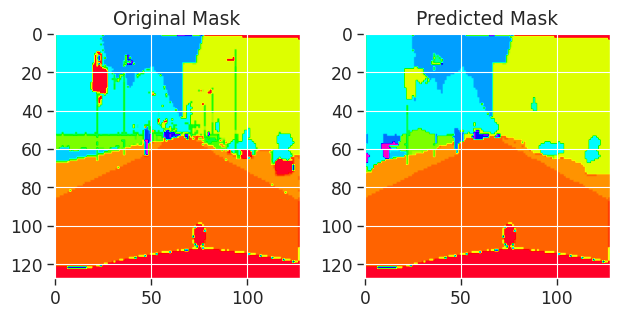

372/372 [==============================] - 51s 138ms/step - loss: 0.4135 - accuracy: 0.8801 - mean_iou: 0.4292 - val_loss: 0.5981 - val_accuracy: 0.8410 - val_mean_iou: 0.3277
Epoch 26/100
1/1 [==============================] - 0s 26ms/step- loss: 0.4060 - accuracy: 0.8821 - mean_iou: 0.43


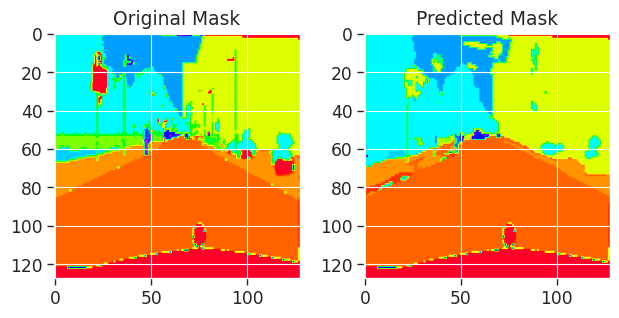

372/372 [==============================] - 51s 136ms/step - loss: 0.4060 - accuracy: 0.8821 - mean_iou: 0.4371 - val_loss: 0.6874 - val_accuracy: 0.8341 - val_mean_iou: 0.3083
Epoch 27/100
1/1 [==============================] - 0s 25ms/step- loss: 0.4017 - accuracy: 0.8834 - mean_iou: 0.43


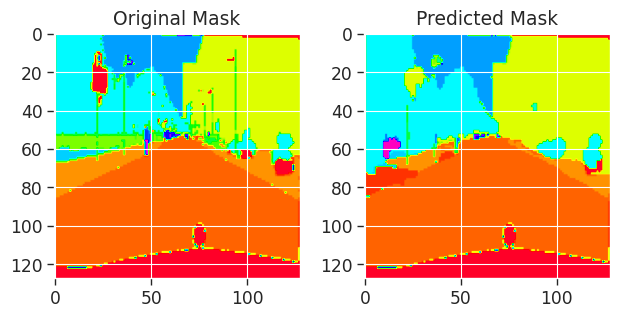

372/372 [==============================] - 51s 136ms/step - loss: 0.4017 - accuracy: 0.8834 - mean_iou: 0.4385 - val_loss: 0.5759 - val_accuracy: 0.8417 - val_mean_iou: 0.3288
Epoch 28/100
1/1 [==============================] - 0s 37ms/step- loss: 0.3994 - accuracy: 0.8842 - mean_iou: 0.44


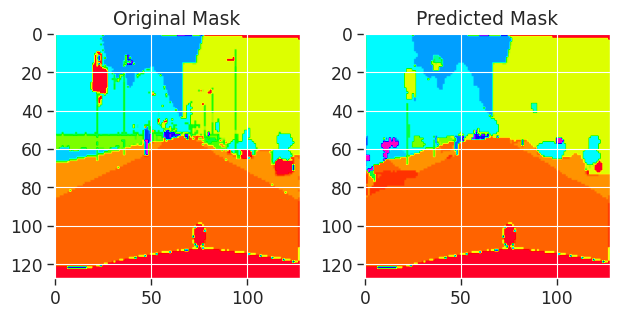

372/372 [==============================] - 51s 137ms/step - loss: 0.3994 - accuracy: 0.8842 - mean_iou: 0.4440 - val_loss: 0.6266 - val_accuracy: 0.8337 - val_mean_iou: 0.3212
Epoch 29/100
1/1 [==============================] - 0s 29ms/step- loss: 0.3946 - accuracy: 0.8853 - mean_iou: 0.45


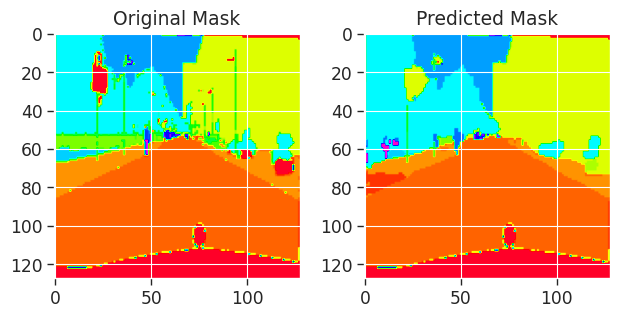

372/372 [==============================] - 51s 136ms/step - loss: 0.3946 - accuracy: 0.8853 - mean_iou: 0.4504 - val_loss: 0.6348 - val_accuracy: 0.8358 - val_mean_iou: 0.3152
Epoch 30/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3911 - accuracy: 0.8861 - mean_iou: 0.45


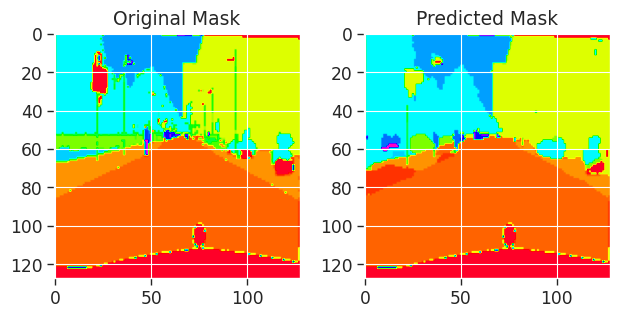

372/372 [==============================] - 51s 138ms/step - loss: 0.3911 - accuracy: 0.8861 - mean_iou: 0.4519 - val_loss: 0.6497 - val_accuracy: 0.8356 - val_mean_iou: 0.3207
Epoch 31/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3824 - accuracy: 0.8891 - mean_iou: 0.46


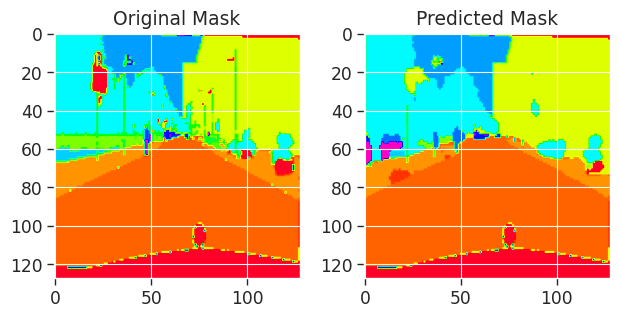

372/372 [==============================] - 51s 137ms/step - loss: 0.3824 - accuracy: 0.8891 - mean_iou: 0.4649 - val_loss: 0.6022 - val_accuracy: 0.8437 - val_mean_iou: 0.3380
Epoch 32/100
1/1 [==============================] - 0s 25ms/step- loss: 0.3771 - accuracy: 0.8901 - mean_iou: 0.46


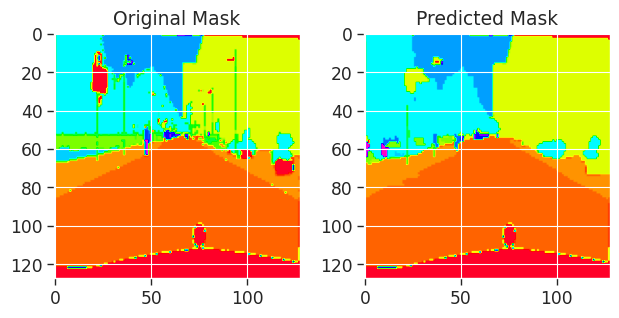

372/372 [==============================] - 51s 137ms/step - loss: 0.3771 - accuracy: 0.8901 - mean_iou: 0.4667 - val_loss: 0.6281 - val_accuracy: 0.8416 - val_mean_iou: 0.3295
Epoch 33/100
1/1 [==============================] - 0s 28ms/step- loss: 0.3793 - accuracy: 0.8892 - mean_iou: 0.46


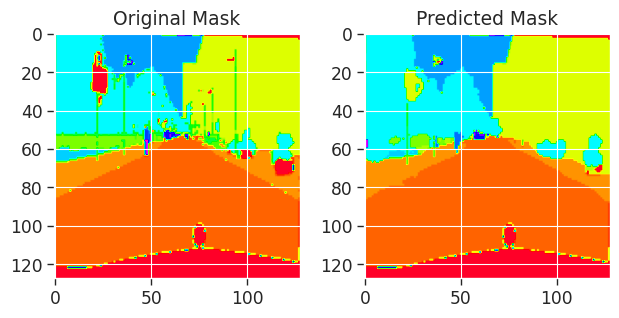

372/372 [==============================] - 51s 138ms/step - loss: 0.3793 - accuracy: 0.8892 - mean_iou: 0.4698 - val_loss: 0.6350 - val_accuracy: 0.8409 - val_mean_iou: 0.3280
Epoch 34/100
1/1 [==============================] - 0s 28ms/step- loss: 0.3863 - accuracy: 0.8878 - mean_iou: 0.46


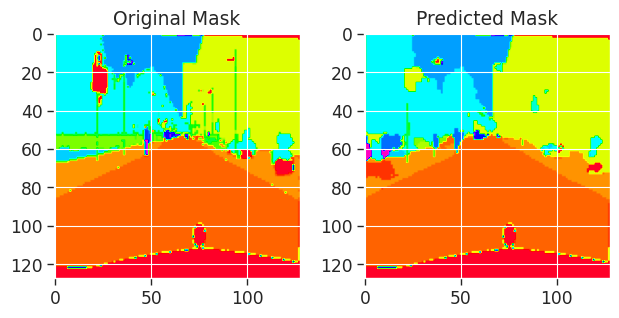

372/372 [==============================] - 51s 137ms/step - loss: 0.3863 - accuracy: 0.8878 - mean_iou: 0.4606 - val_loss: 0.6434 - val_accuracy: 0.8319 - val_mean_iou: 0.3241
Epoch 35/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3861 - accuracy: 0.8876 - mean_iou: 0.46


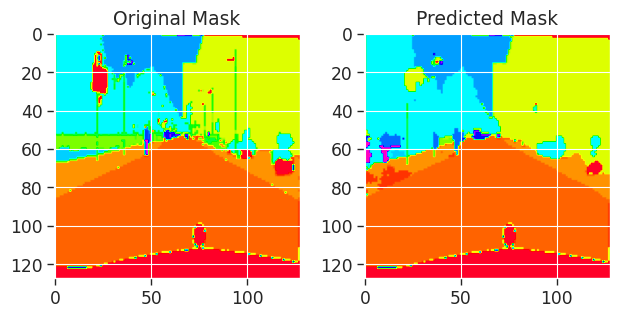

372/372 [==============================] - 52s 139ms/step - loss: 0.3861 - accuracy: 0.8876 - mean_iou: 0.4667 - val_loss: 0.5981 - val_accuracy: 0.8402 - val_mean_iou: 0.3341
Epoch 36/100
1/1 [==============================] - 0s 26ms/step- loss: 0.3585 - accuracy: 0.8954 - mean_iou: 0.49


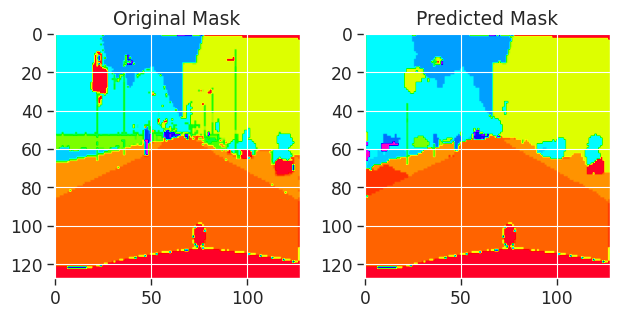

372/372 [==============================] - 51s 138ms/step - loss: 0.3585 - accuracy: 0.8954 - mean_iou: 0.4901 - val_loss: 0.6205 - val_accuracy: 0.8412 - val_mean_iou: 0.3356
Epoch 37/100
1/1 [==============================] - 0s 28ms/step- loss: 0.3482 - accuracy: 0.8981 - mean_iou: 0.49


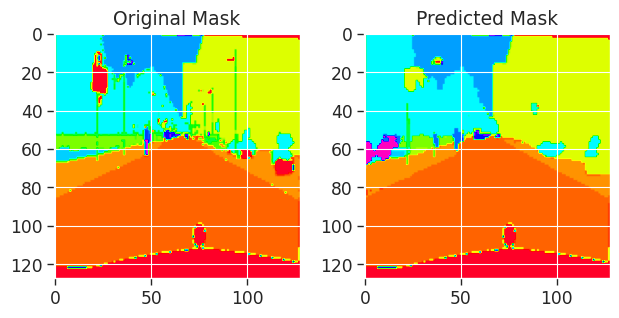

372/372 [==============================] - 51s 137ms/step - loss: 0.3482 - accuracy: 0.8981 - mean_iou: 0.4995 - val_loss: 0.6258 - val_accuracy: 0.8425 - val_mean_iou: 0.3432


In [36]:
input_shape = (128, 128, 3)
batchnorm=True
model = get_unet_attn_model()
# model.summary()

# Training Configuration
BATCH_SIZE = 8
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("../input/cityscapes-image-pairs/cityscapes_data/val/106.jpg")
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = BATCH_SIZE, validation_data = (X_valid, Y_valid), callbacks=[viz_callback, early_stopping])

In [37]:
# serialize model to JSON
model_json = model.to_json()
with open("unet_attn_bs8_es.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("unet_attn_bs8_es.h5")
print("Saved model to disk")

Saved model to disk


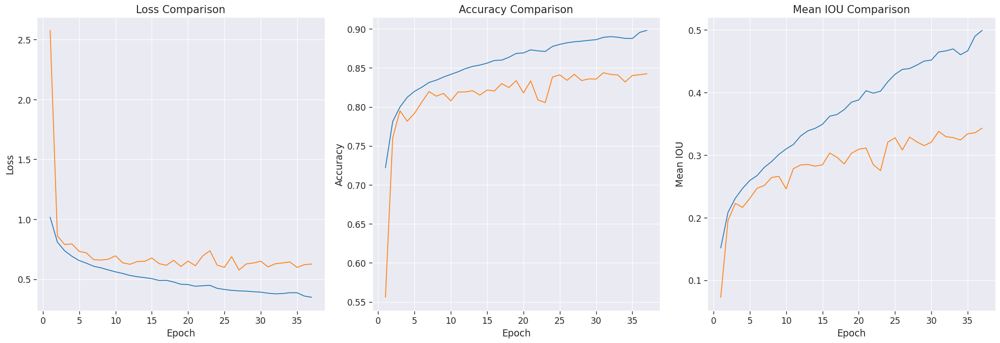

In [38]:
# Training Results
plot_history(history)

# Evaluating on Test data set

In [20]:
#Evaluating Model on test
input_shape = (128, 128, 3)
batchnorm=True
model = get_unet_attn_model()


BATCH_SIZE = 8
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
# Loads the weights
model.load_weights("/kaggle/input/modelweights/unet_attn_bs8_es.h5")

# Re-evaluate the model
print("Test Metrics: ")
out=model.evaluate(X_test, Y_test, verbose=2)

Test Metrics: 
10/10 - 3s - loss: 0.5729 - accuracy: 0.8407 - mean_iou: 0.3308 - 3s/epoch - 328ms/step


## 4.5 UNET + Residual + Attention

Epoch 1/100


2023-04-25 15:54:55.842074: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_6/dropout_48/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 0s 430ms/step loss: 1.0343 - accuracy: 0.7178 - mean_iou: 0.15


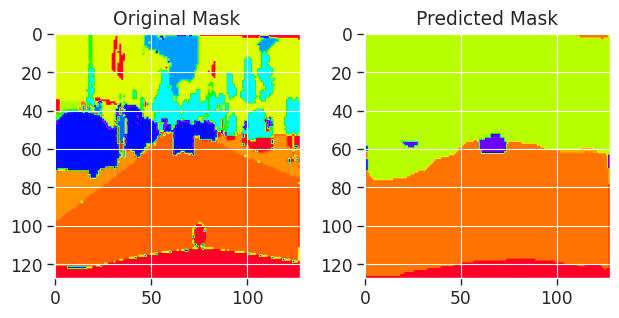

372/372 [==============================] - 67s 136ms/step - loss: 1.0343 - accuracy: 0.7178 - mean_iou: 0.1528 - val_loss: 1.6025 - val_accuracy: 0.5599 - val_mean_iou: 0.0657
Epoch 2/100
1/1 [==============================] - 0s 23ms/step- loss: 0.8000 - accuracy: 0.7825 - mean_iou: 0.21


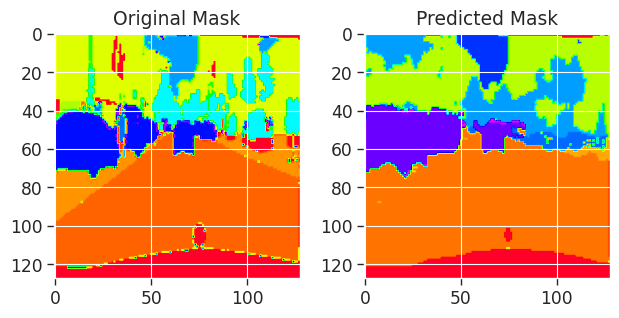

372/372 [==============================] - 49s 132ms/step - loss: 0.8000 - accuracy: 0.7825 - mean_iou: 0.2114 - val_loss: 0.9447 - val_accuracy: 0.7418 - val_mean_iou: 0.1766
Epoch 3/100
1/1 [==============================] - 0s 28ms/step- loss: 0.7114 - accuracy: 0.8061 - mean_iou: 0.23


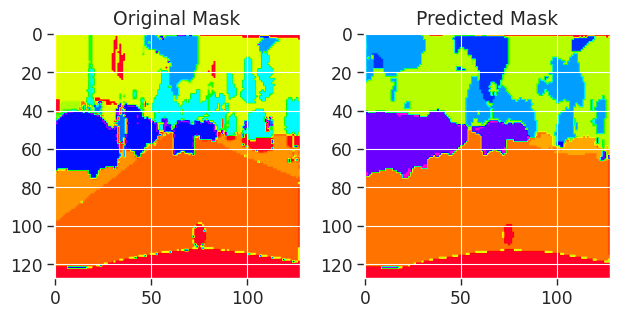

372/372 [==============================] - 49s 132ms/step - loss: 0.7114 - accuracy: 0.8061 - mean_iou: 0.2397 - val_loss: 0.7545 - val_accuracy: 0.7882 - val_mean_iou: 0.2296
Epoch 4/100
1/1 [==============================] - 0s 22ms/step- loss: 0.6650 - accuracy: 0.8177 - mean_iou: 0.25


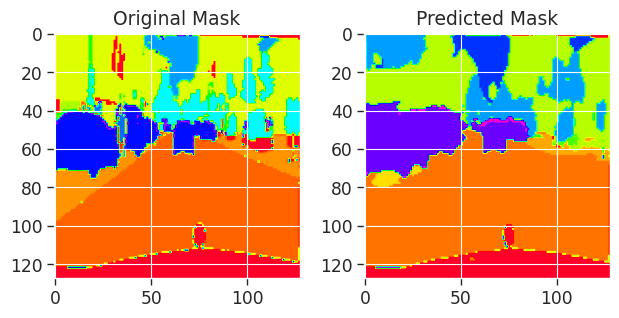

372/372 [==============================] - 49s 133ms/step - loss: 0.6650 - accuracy: 0.8177 - mean_iou: 0.2573 - val_loss: 0.7063 - val_accuracy: 0.8100 - val_mean_iou: 0.2483
Epoch 5/100
1/1 [==============================] - 0s 23ms/step- loss: 0.6298 - accuracy: 0.8263 - mean_iou: 0.27


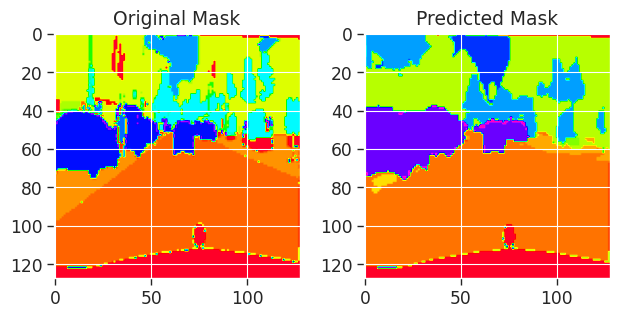

372/372 [==============================] - 49s 132ms/step - loss: 0.6298 - accuracy: 0.8263 - mean_iou: 0.2751 - val_loss: 0.6538 - val_accuracy: 0.8190 - val_mean_iou: 0.2541
Epoch 6/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5994 - accuracy: 0.8322 - mean_iou: 0.29


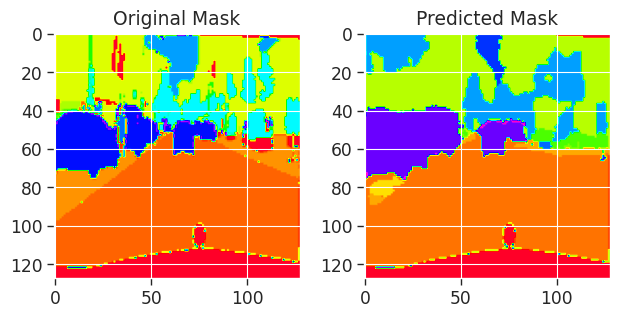

372/372 [==============================] - 49s 132ms/step - loss: 0.5994 - accuracy: 0.8322 - mean_iou: 0.2907 - val_loss: 0.7038 - val_accuracy: 0.8038 - val_mean_iou: 0.2482
Epoch 7/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5754 - accuracy: 0.8383 - mean_iou: 0.30


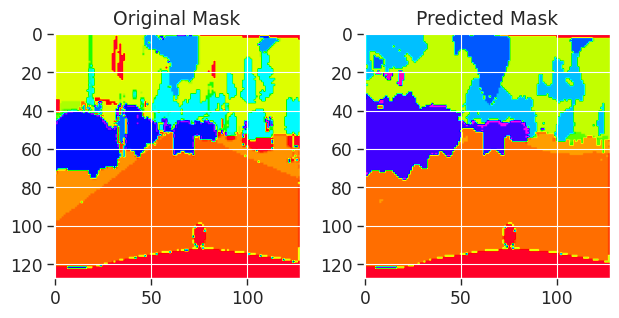

372/372 [==============================] - 49s 132ms/step - loss: 0.5754 - accuracy: 0.8383 - mean_iou: 0.3052 - val_loss: 0.6782 - val_accuracy: 0.8120 - val_mean_iou: 0.2651
Epoch 8/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5636 - accuracy: 0.8409 - mean_iou: 0.31


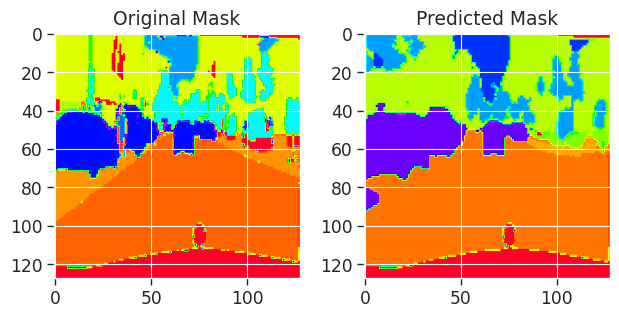

372/372 [==============================] - 49s 132ms/step - loss: 0.5636 - accuracy: 0.8409 - mean_iou: 0.3122 - val_loss: 0.7191 - val_accuracy: 0.7972 - val_mean_iou: 0.2468
Epoch 9/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5385 - accuracy: 0.8466 - mean_iou: 0.32


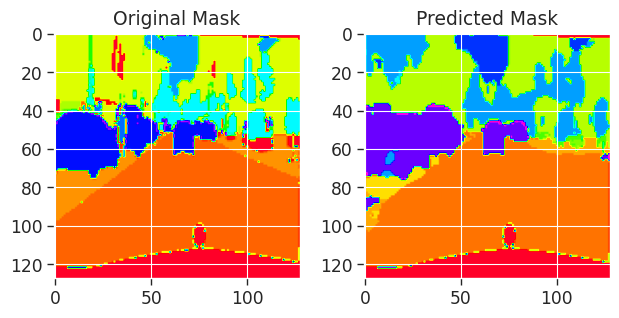

372/372 [==============================] - 49s 131ms/step - loss: 0.5385 - accuracy: 0.8466 - mean_iou: 0.3291 - val_loss: 0.7352 - val_accuracy: 0.7985 - val_mean_iou: 0.2608
Epoch 10/100
1/1 [==============================] - 0s 37ms/step- loss: 0.5269 - accuracy: 0.8494 - mean_iou: 0.33


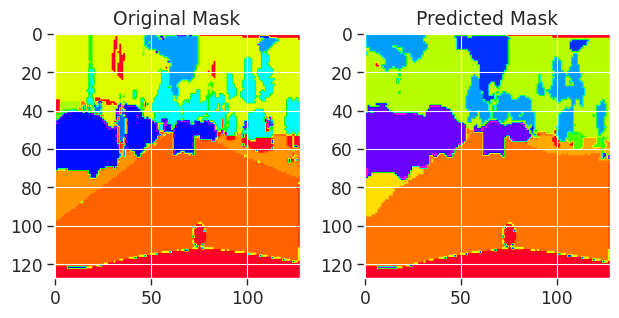

372/372 [==============================] - 50s 134ms/step - loss: 0.5269 - accuracy: 0.8494 - mean_iou: 0.3366 - val_loss: 0.6100 - val_accuracy: 0.8267 - val_mean_iou: 0.2937
Epoch 11/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5113 - accuracy: 0.8535 - mean_iou: 0.34


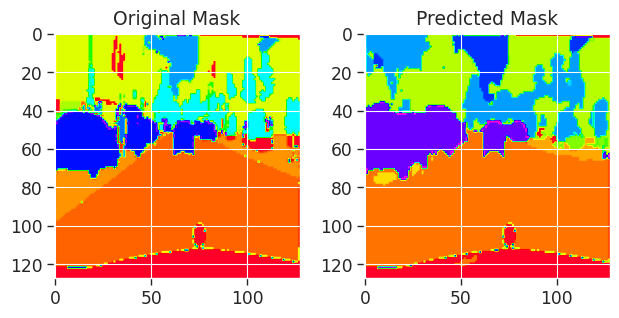

372/372 [==============================] - 49s 133ms/step - loss: 0.5113 - accuracy: 0.8535 - mean_iou: 0.3484 - val_loss: 0.6899 - val_accuracy: 0.8087 - val_mean_iou: 0.2720
Epoch 12/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4975 - accuracy: 0.8568 - mean_iou: 0.36


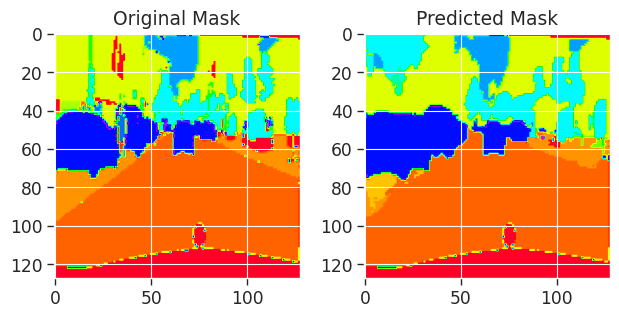

372/372 [==============================] - 49s 133ms/step - loss: 0.4975 - accuracy: 0.8568 - mean_iou: 0.3613 - val_loss: 0.6399 - val_accuracy: 0.8206 - val_mean_iou: 0.2859
Epoch 13/100
1/1 [==============================] - 0s 27ms/step- loss: 0.4789 - accuracy: 0.8618 - mean_iou: 0.37


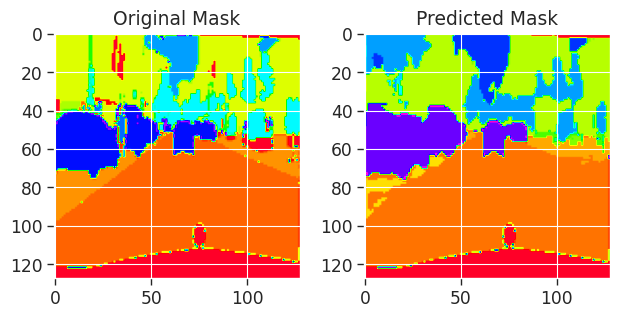

372/372 [==============================] - 49s 131ms/step - loss: 0.4789 - accuracy: 0.8618 - mean_iou: 0.3721 - val_loss: 0.5848 - val_accuracy: 0.8335 - val_mean_iou: 0.3110
Epoch 14/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4654 - accuracy: 0.8657 - mean_iou: 0.38


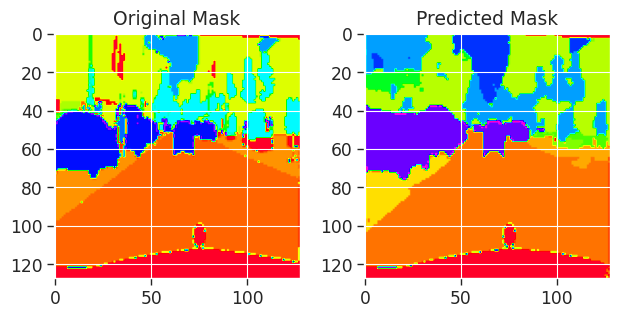

372/372 [==============================] - 49s 131ms/step - loss: 0.4654 - accuracy: 0.8657 - mean_iou: 0.3861 - val_loss: 0.6900 - val_accuracy: 0.8178 - val_mean_iou: 0.2865
Epoch 15/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4590 - accuracy: 0.8671 - mean_iou: 0.39


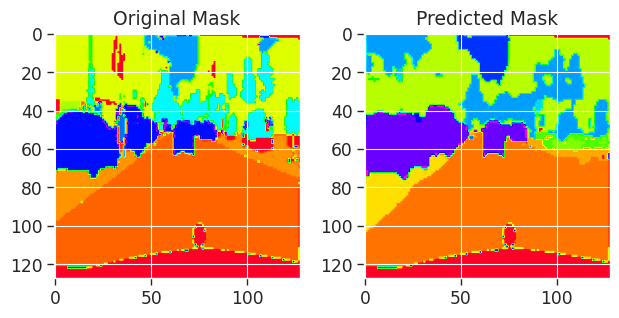

372/372 [==============================] - 49s 132ms/step - loss: 0.4590 - accuracy: 0.8671 - mean_iou: 0.3924 - val_loss: 0.6414 - val_accuracy: 0.8166 - val_mean_iou: 0.3021
Epoch 16/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4426 - accuracy: 0.8716 - mean_iou: 0.40


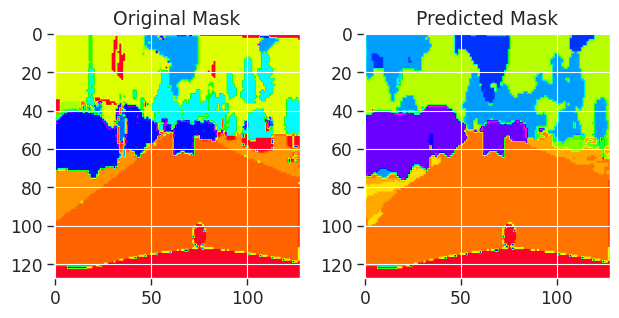

372/372 [==============================] - 49s 131ms/step - loss: 0.4426 - accuracy: 0.8716 - mean_iou: 0.4049 - val_loss: 0.6572 - val_accuracy: 0.8209 - val_mean_iou: 0.2975
Epoch 17/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4356 - accuracy: 0.8734 - mean_iou: 0.41


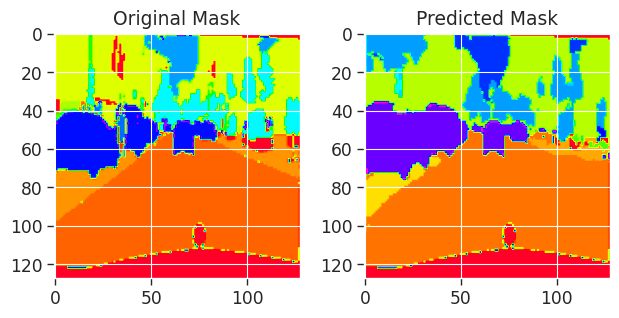

372/372 [==============================] - 50s 133ms/step - loss: 0.4356 - accuracy: 0.8734 - mean_iou: 0.4134 - val_loss: 0.6602 - val_accuracy: 0.8223 - val_mean_iou: 0.3025
Epoch 18/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4206 - accuracy: 0.8780 - mean_iou: 0.42


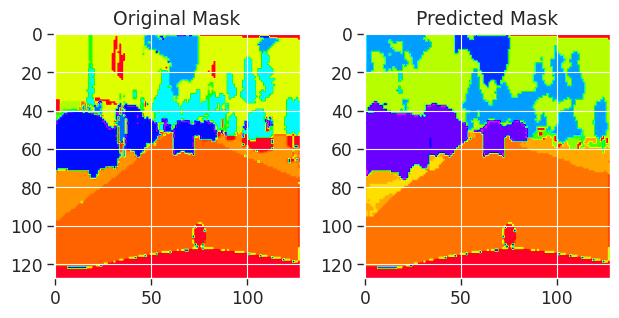

372/372 [==============================] - 49s 131ms/step - loss: 0.4206 - accuracy: 0.8780 - mean_iou: 0.4277 - val_loss: 0.5826 - val_accuracy: 0.8393 - val_mean_iou: 0.3223
Epoch 19/100
1/1 [==============================] - 0s 24ms/step- loss: 0.4066 - accuracy: 0.8816 - mean_iou: 0.44


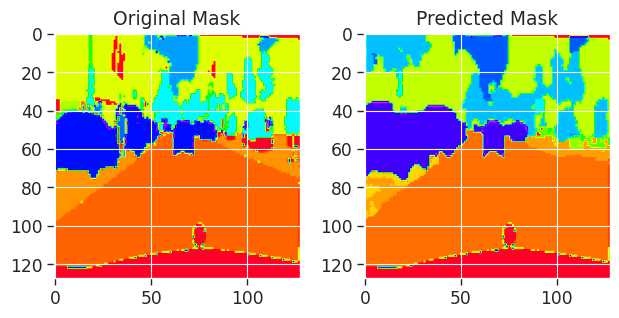

372/372 [==============================] - 49s 132ms/step - loss: 0.4066 - accuracy: 0.8816 - mean_iou: 0.4410 - val_loss: 0.5931 - val_accuracy: 0.8402 - val_mean_iou: 0.3306
Epoch 20/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3983 - accuracy: 0.8839 - mean_iou: 0.45


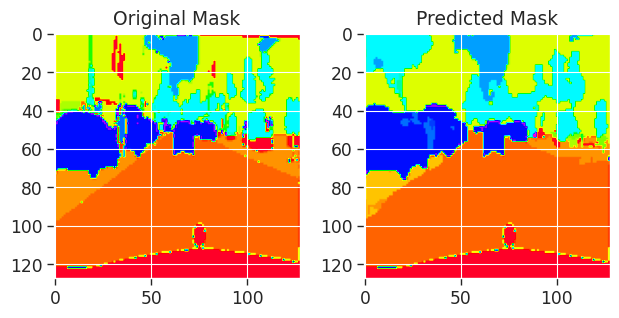

372/372 [==============================] - 49s 132ms/step - loss: 0.3983 - accuracy: 0.8839 - mean_iou: 0.4509 - val_loss: 0.6143 - val_accuracy: 0.8376 - val_mean_iou: 0.3192
Epoch 21/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3981 - accuracy: 0.8840 - mean_iou: 0.44


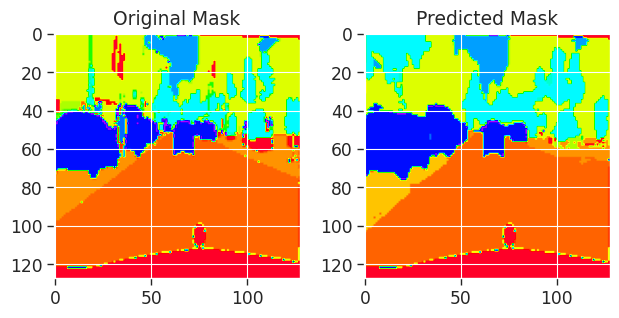

372/372 [==============================] - 50s 134ms/step - loss: 0.3981 - accuracy: 0.8840 - mean_iou: 0.4498 - val_loss: 0.5950 - val_accuracy: 0.8387 - val_mean_iou: 0.3319
Epoch 22/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3781 - accuracy: 0.8896 - mean_iou: 0.46


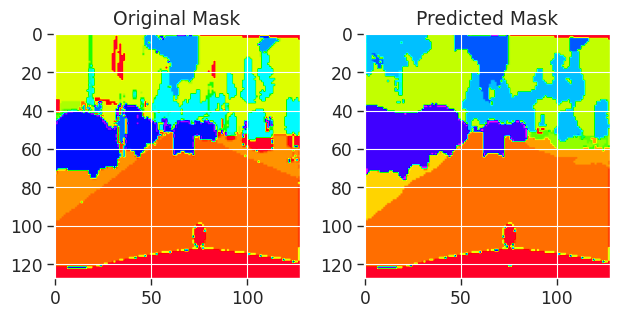

372/372 [==============================] - 49s 132ms/step - loss: 0.3781 - accuracy: 0.8896 - mean_iou: 0.4698 - val_loss: 0.5919 - val_accuracy: 0.8441 - val_mean_iou: 0.3333
Epoch 23/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3706 - accuracy: 0.8915 - mean_iou: 0.47


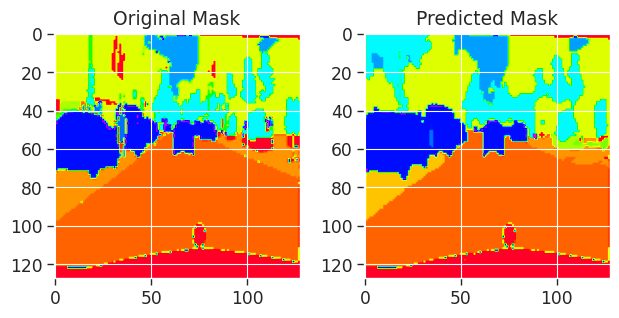

372/372 [==============================] - 49s 132ms/step - loss: 0.3706 - accuracy: 0.8915 - mean_iou: 0.4763 - val_loss: 0.6369 - val_accuracy: 0.8376 - val_mean_iou: 0.3259
Epoch 24/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3821 - accuracy: 0.8885 - mean_iou: 0.47


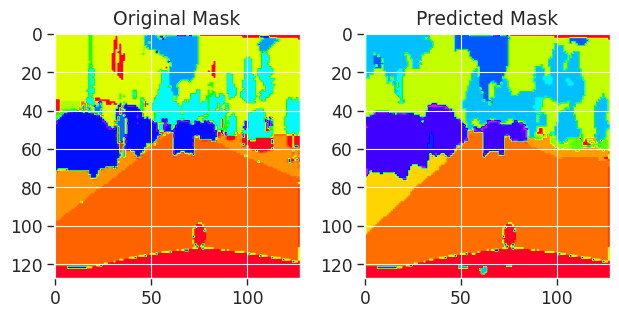

372/372 [==============================] - 49s 132ms/step - loss: 0.3821 - accuracy: 0.8885 - mean_iou: 0.4731 - val_loss: 0.6211 - val_accuracy: 0.8368 - val_mean_iou: 0.3375
Epoch 25/100
1/1 [==============================] - 0s 24ms/step- loss: 0.3538 - accuracy: 0.8964 - mean_iou: 0.50


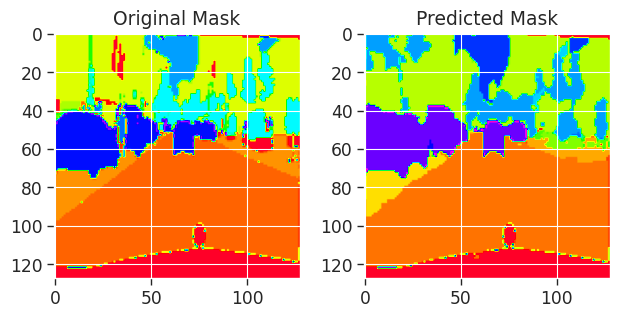

372/372 [==============================] - 49s 131ms/step - loss: 0.3538 - accuracy: 0.8964 - mean_iou: 0.5000 - val_loss: 0.6406 - val_accuracy: 0.8386 - val_mean_iou: 0.3291
Epoch 26/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3379 - accuracy: 0.9006 - mean_iou: 0.51


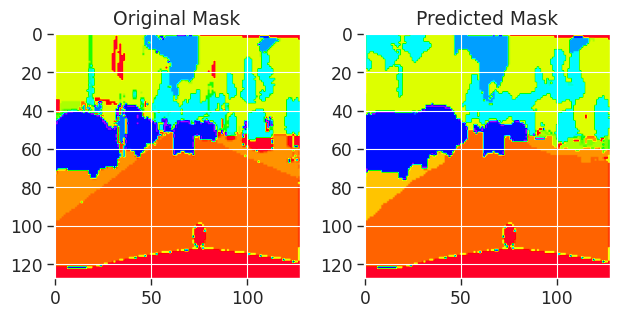

372/372 [==============================] - 48s 130ms/step - loss: 0.3379 - accuracy: 0.9006 - mean_iou: 0.5140 - val_loss: 0.6352 - val_accuracy: 0.8448 - val_mean_iou: 0.3397
Epoch 27/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3293 - accuracy: 0.9031 - mean_iou: 0.52


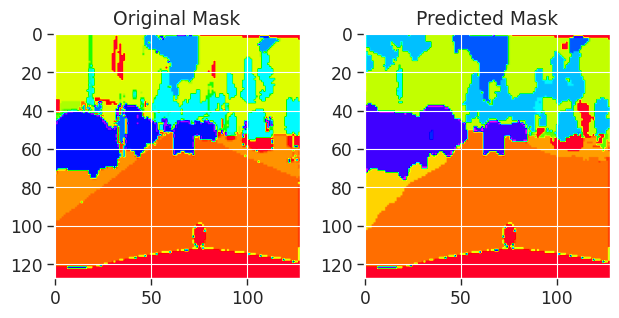

372/372 [==============================] - 49s 132ms/step - loss: 0.3293 - accuracy: 0.9031 - mean_iou: 0.5257 - val_loss: 0.6459 - val_accuracy: 0.8390 - val_mean_iou: 0.3379
Epoch 28/100
1/1 [==============================] - 0s 23ms/step- loss: 0.3400 - accuracy: 0.8996 - mean_iou: 0.51


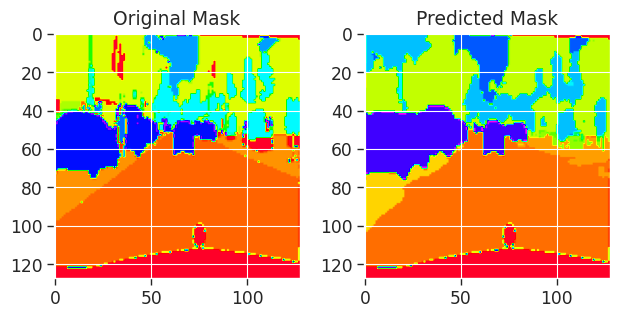

372/372 [==============================] - 49s 131ms/step - loss: 0.3400 - accuracy: 0.8996 - mean_iou: 0.5190 - val_loss: 0.6596 - val_accuracy: 0.8384 - val_mean_iou: 0.3371


In [39]:
input_shape = (128, 128, 3)
batchnorm=True
model = get_res_att_unet_model()
# model.summary()

# Training Configuration
BATCH_SIZE = 8
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("../input/cityscapes-image-pairs/cityscapes_data/val/122.jpg")
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = BATCH_SIZE, validation_data = (X_valid, Y_valid), callbacks=[viz_callback, early_stopping])

In [40]:
# serialize model to JSON
model_json = model.to_json()
with open("unetresatt_bs8.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("unetresatt_bs8.h5")
print("Saved model to disk")

Saved model to disk


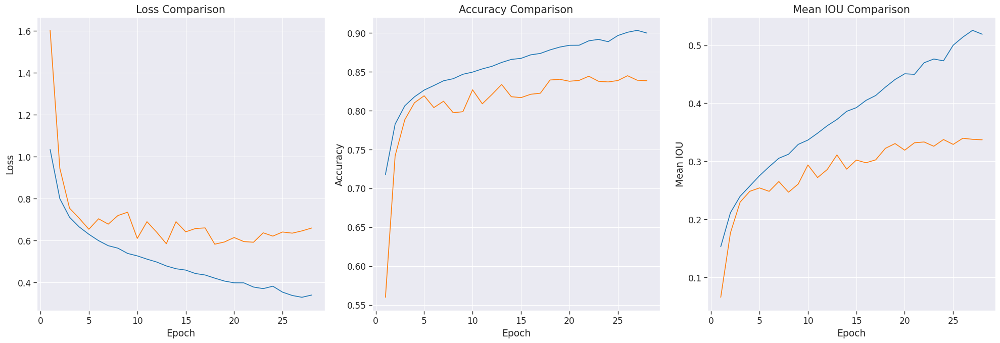

In [41]:
# Training Results
plot_history(history)

# Evaluating on Test data set

In [22]:
#Evaluating Model on test
input_shape = (128, 128, 3)
batchnorm=True
model = get_res_att_unet_model()


BATCH_SIZE = 8
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
# Loads the weights
model.load_weights("/kaggle/input/modelweights/unetresatt_bs8.h5")

# Re-evaluate the model
print("Test Metrics: ")
out=model.evaluate(X_test, Y_test, verbose=2)

Test Metrics: 
10/10 - 2s - loss: 0.5789 - accuracy: 0.8387 - mean_iou: 0.3254 - 2s/epoch - 195ms/step


## 4.6 UNET + ASPP

Epoch 1/100


2023-04-25 16:21:49.923449: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_7/dropout_56/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 1s 874ms/step loss: 1.0214 - accuracy: 0.7204 - mean_iou: 0.15


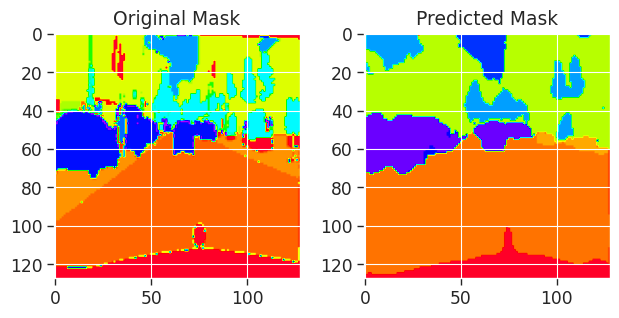

744/744 [==============================] - 93s 107ms/step - loss: 1.0214 - accuracy: 0.7204 - mean_iou: 0.1508 - val_loss: 1.0935 - val_accuracy: 0.7300 - val_mean_iou: 0.1627
Epoch 2/100
1/1 [==============================] - 0s 22ms/step- loss: 0.8164 - accuracy: 0.7805 - mean_iou: 0.20


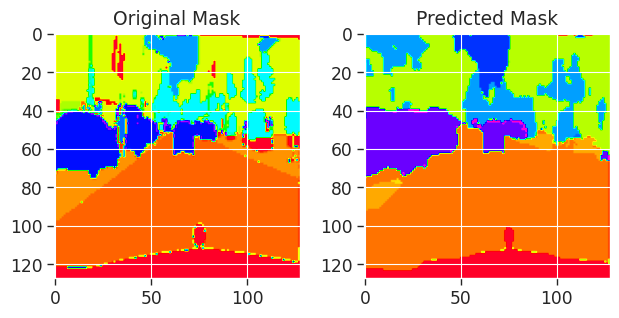

744/744 [==============================] - 76s 103ms/step - loss: 0.8164 - accuracy: 0.7805 - mean_iou: 0.2078 - val_loss: 0.8094 - val_accuracy: 0.7891 - val_mean_iou: 0.2144
Epoch 3/100
1/1 [==============================] - 0s 22ms/step- loss: 0.7334 - accuracy: 0.8030 - mean_iou: 0.23


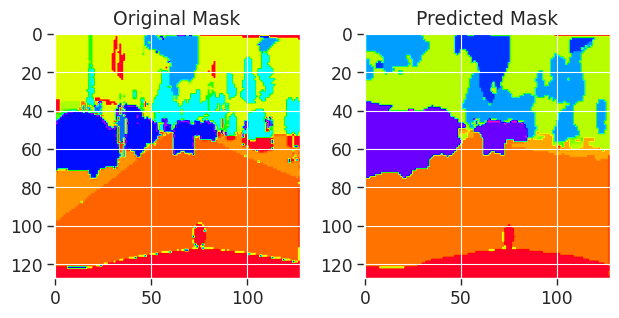

744/744 [==============================] - 76s 103ms/step - loss: 0.7334 - accuracy: 0.8030 - mean_iou: 0.2304 - val_loss: 0.7339 - val_accuracy: 0.8020 - val_mean_iou: 0.2279
Epoch 4/100
1/1 [==============================] - 0s 22ms/step- loss: 0.6856 - accuracy: 0.8146 - mean_iou: 0.24


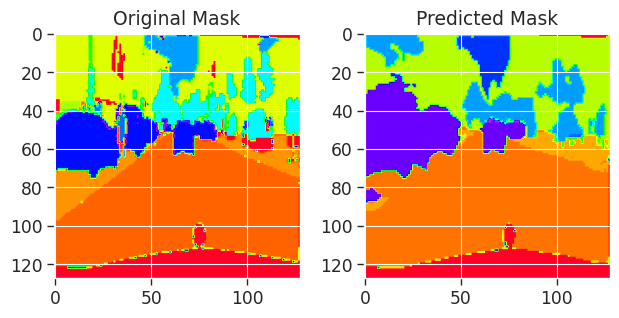

744/744 [==============================] - 75s 100ms/step - loss: 0.6856 - accuracy: 0.8146 - mean_iou: 0.2489 - val_loss: 0.7640 - val_accuracy: 0.7866 - val_mean_iou: 0.2245
Epoch 5/100
1/1 [==============================] - 0s 22ms/step- loss: 0.6424 - accuracy: 0.8252 - mean_iou: 0.26


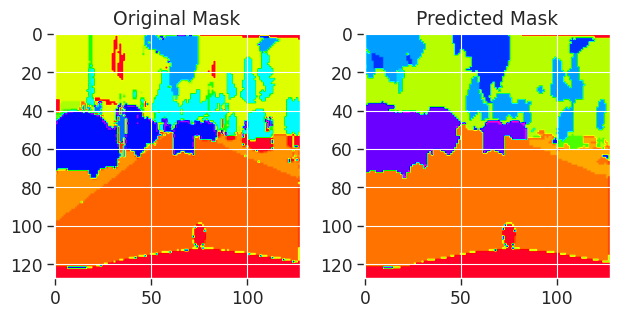

744/744 [==============================] - 76s 103ms/step - loss: 0.6424 - accuracy: 0.8252 - mean_iou: 0.2654 - val_loss: 0.7758 - val_accuracy: 0.7821 - val_mean_iou: 0.2279
Epoch 6/100
1/1 [==============================] - 0s 22ms/step- loss: 0.6160 - accuracy: 0.8311 - mean_iou: 0.27


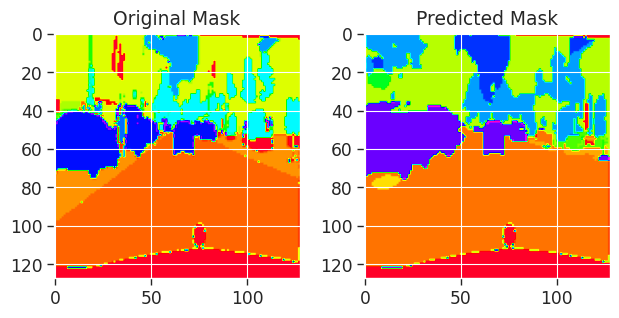

744/744 [==============================] - 77s 103ms/step - loss: 0.6160 - accuracy: 0.8311 - mean_iou: 0.2788 - val_loss: 0.7031 - val_accuracy: 0.8054 - val_mean_iou: 0.2607
Epoch 7/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5981 - accuracy: 0.8358 - mean_iou: 0.29


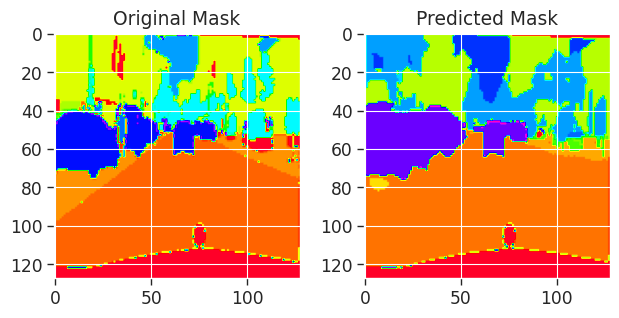

744/744 [==============================] - 77s 103ms/step - loss: 0.5981 - accuracy: 0.8358 - mean_iou: 0.2900 - val_loss: 0.6798 - val_accuracy: 0.8061 - val_mean_iou: 0.2597
Epoch 8/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5797 - accuracy: 0.8390 - mean_iou: 0.29


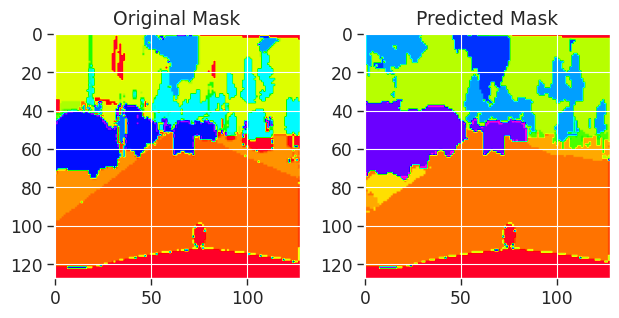

744/744 [==============================] - 76s 103ms/step - loss: 0.5797 - accuracy: 0.8390 - mean_iou: 0.2996 - val_loss: 0.6120 - val_accuracy: 0.8285 - val_mean_iou: 0.2685
Epoch 9/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5579 - accuracy: 0.8447 - mean_iou: 0.31


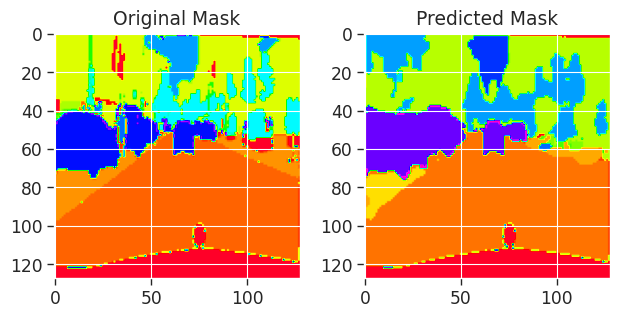

744/744 [==============================] - 76s 102ms/step - loss: 0.5579 - accuracy: 0.8447 - mean_iou: 0.3118 - val_loss: 0.7386 - val_accuracy: 0.7771 - val_mean_iou: 0.2685
Epoch 10/100
1/1 [==============================] - 0s 23ms/step- loss: 0.5419 - accuracy: 0.8478 - mean_iou: 0.32


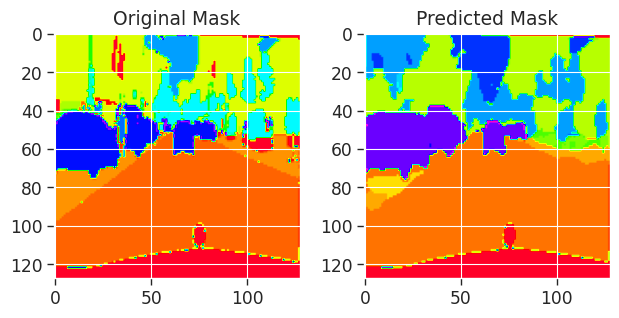

744/744 [==============================] - 76s 102ms/step - loss: 0.5419 - accuracy: 0.8478 - mean_iou: 0.3203 - val_loss: 0.6466 - val_accuracy: 0.8178 - val_mean_iou: 0.2765
Epoch 11/100
1/1 [==============================] - 0s 21ms/step- loss: 0.5342 - accuracy: 0.8491 - mean_iou: 0.32


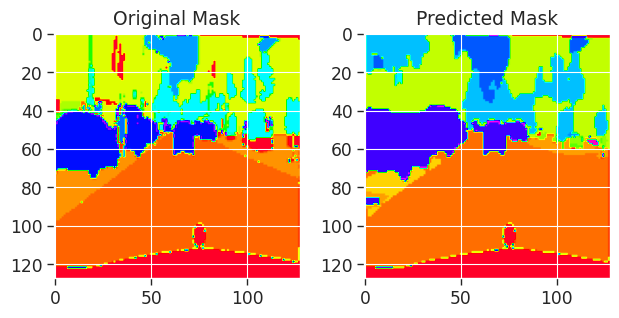

744/744 [==============================] - 76s 103ms/step - loss: 0.5342 - accuracy: 0.8491 - mean_iou: 0.3270 - val_loss: 0.6012 - val_accuracy: 0.8259 - val_mean_iou: 0.2880
Epoch 12/100
1/1 [==============================] - 0s 21ms/step- loss: 0.5214 - accuracy: 0.8521 - mean_iou: 0.33


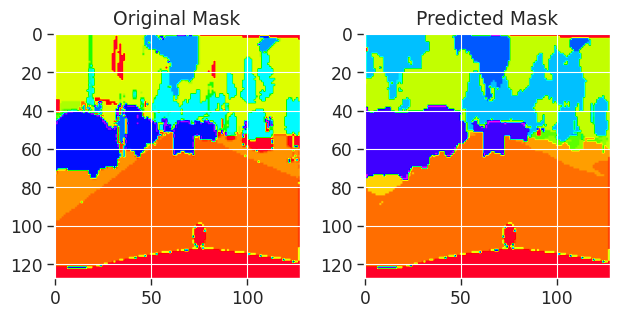

744/744 [==============================] - 75s 101ms/step - loss: 0.5214 - accuracy: 0.8521 - mean_iou: 0.3365 - val_loss: 0.6450 - val_accuracy: 0.8145 - val_mean_iou: 0.2830
Epoch 13/100
1/1 [==============================] - 0s 22ms/step- loss: 0.5028 - accuracy: 0.8561 - mean_iou: 0.34


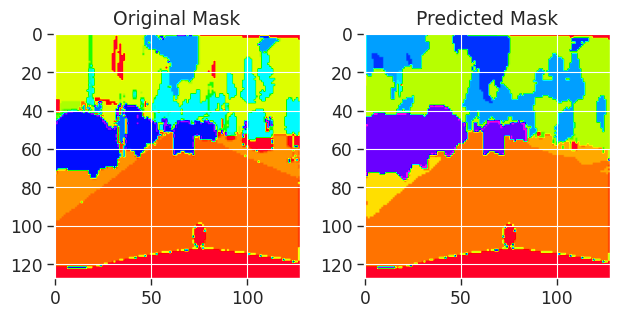

744/744 [==============================] - 76s 103ms/step - loss: 0.5028 - accuracy: 0.8561 - mean_iou: 0.3455 - val_loss: 0.6117 - val_accuracy: 0.8260 - val_mean_iou: 0.2881
Epoch 14/100
1/1 [==============================] - 0s 30ms/step- loss: 0.4878 - accuracy: 0.8605 - mean_iou: 0.36


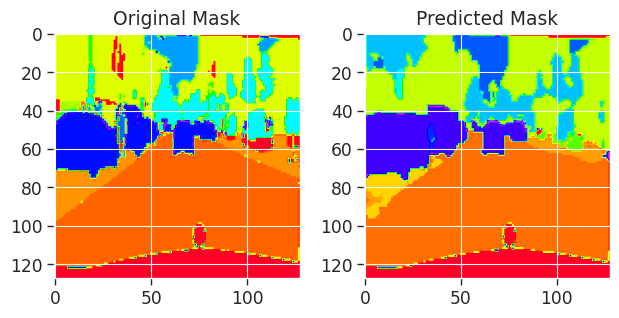

744/744 [==============================] - 76s 103ms/step - loss: 0.4878 - accuracy: 0.8605 - mean_iou: 0.3607 - val_loss: 0.5750 - val_accuracy: 0.8337 - val_mean_iou: 0.3042
Epoch 15/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4776 - accuracy: 0.8631 - mean_iou: 0.37


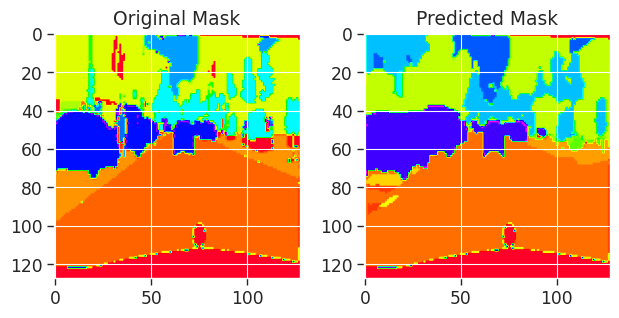

744/744 [==============================] - 76s 103ms/step - loss: 0.4776 - accuracy: 0.8631 - mean_iou: 0.3700 - val_loss: 0.5950 - val_accuracy: 0.8296 - val_mean_iou: 0.3083
Epoch 16/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4698 - accuracy: 0.8651 - mean_iou: 0.37


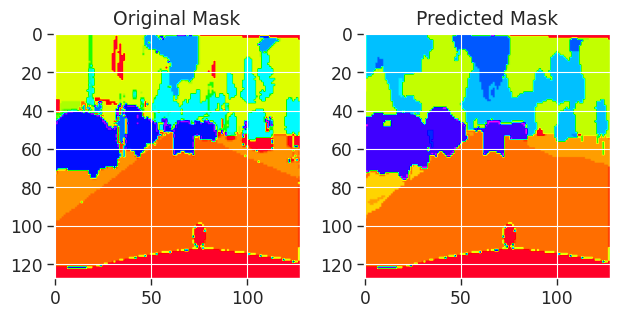

744/744 [==============================] - 75s 101ms/step - loss: 0.4698 - accuracy: 0.8651 - mean_iou: 0.3763 - val_loss: 0.7058 - val_accuracy: 0.8020 - val_mean_iou: 0.2805
Epoch 17/100
1/1 [==============================] - 0s 21ms/step- loss: 0.4597 - accuracy: 0.8681 - mean_iou: 0.38


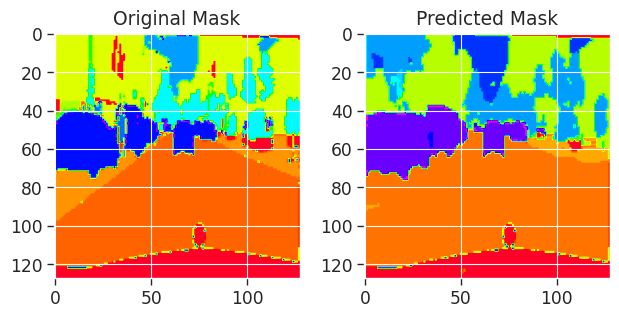

744/744 [==============================] - 76s 102ms/step - loss: 0.4597 - accuracy: 0.8681 - mean_iou: 0.3852 - val_loss: 0.6301 - val_accuracy: 0.8191 - val_mean_iou: 0.2992
Epoch 18/100
1/1 [==============================] - 0s 23ms/step- loss: 0.4492 - accuracy: 0.8705 - mean_iou: 0.39


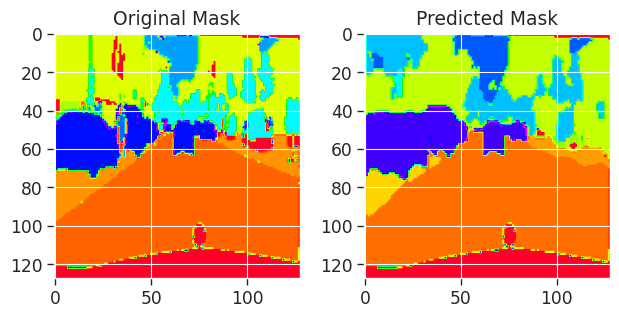

744/744 [==============================] - 75s 101ms/step - loss: 0.4492 - accuracy: 0.8705 - mean_iou: 0.3945 - val_loss: 0.5656 - val_accuracy: 0.8397 - val_mean_iou: 0.3142
Epoch 19/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4475 - accuracy: 0.8711 - mean_iou: 0.39


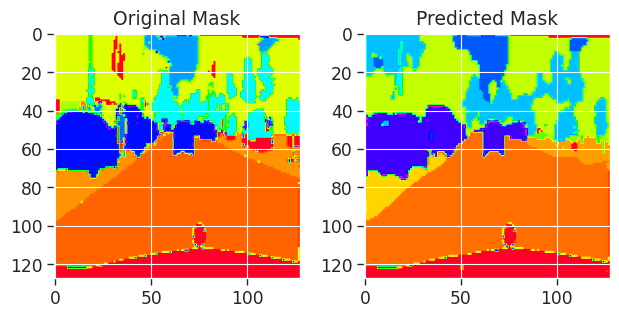

744/744 [==============================] - 76s 102ms/step - loss: 0.4475 - accuracy: 0.8711 - mean_iou: 0.3983 - val_loss: 0.5852 - val_accuracy: 0.8345 - val_mean_iou: 0.3169
Epoch 20/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4296 - accuracy: 0.8757 - mean_iou: 0.41


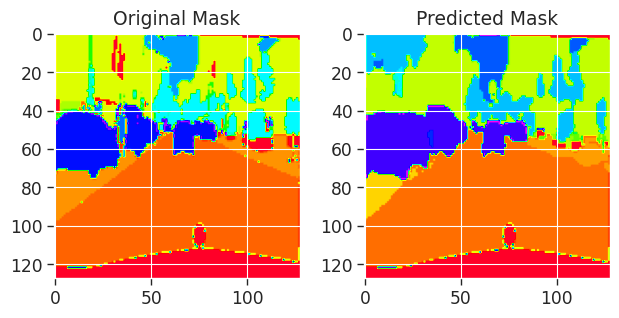

744/744 [==============================] - 76s 102ms/step - loss: 0.4296 - accuracy: 0.8757 - mean_iou: 0.4106 - val_loss: 0.5879 - val_accuracy: 0.8375 - val_mean_iou: 0.3195
Epoch 21/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4149 - accuracy: 0.8797 - mean_iou: 0.42


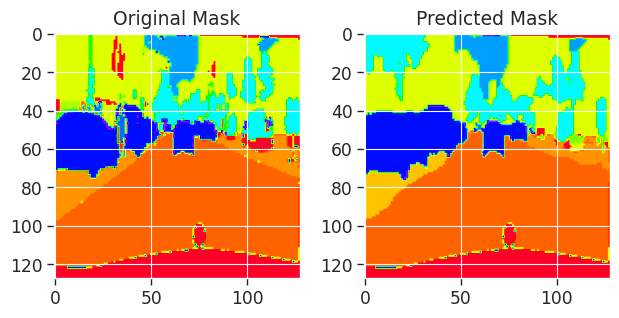

744/744 [==============================] - 76s 102ms/step - loss: 0.4149 - accuracy: 0.8797 - mean_iou: 0.4227 - val_loss: 0.5885 - val_accuracy: 0.8422 - val_mean_iou: 0.3282
Epoch 22/100
1/1 [==============================] - 0s 22ms/step- loss: 0.4102 - accuracy: 0.8809 - mean_iou: 0.43


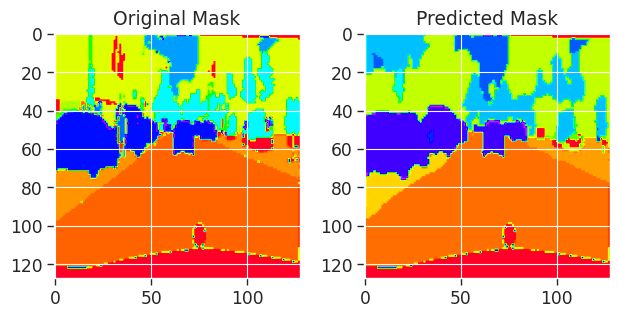

744/744 [==============================] - 76s 102ms/step - loss: 0.4102 - accuracy: 0.8809 - mean_iou: 0.4329 - val_loss: 0.5955 - val_accuracy: 0.8369 - val_mean_iou: 0.3312
Epoch 23/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3983 - accuracy: 0.8845 - mean_iou: 0.44


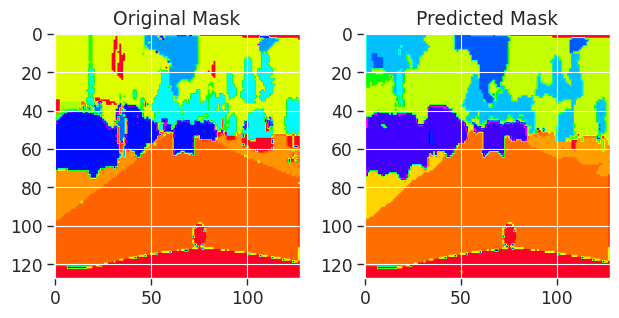

744/744 [==============================] - 77s 103ms/step - loss: 0.3983 - accuracy: 0.8845 - mean_iou: 0.4433 - val_loss: 0.5866 - val_accuracy: 0.8448 - val_mean_iou: 0.3367
Epoch 24/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3895 - accuracy: 0.8869 - mean_iou: 0.45


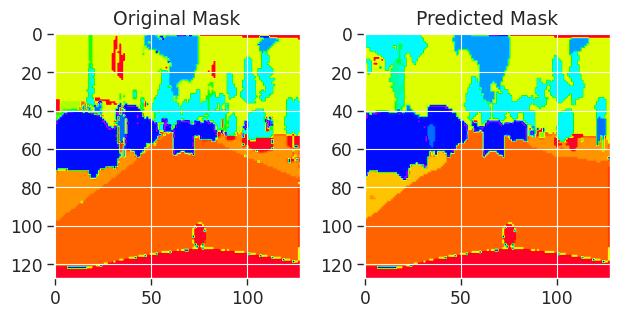

744/744 [==============================] - 76s 103ms/step - loss: 0.3895 - accuracy: 0.8869 - mean_iou: 0.4543 - val_loss: 0.6593 - val_accuracy: 0.8305 - val_mean_iou: 0.3070
Epoch 25/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3892 - accuracy: 0.8868 - mean_iou: 0.45


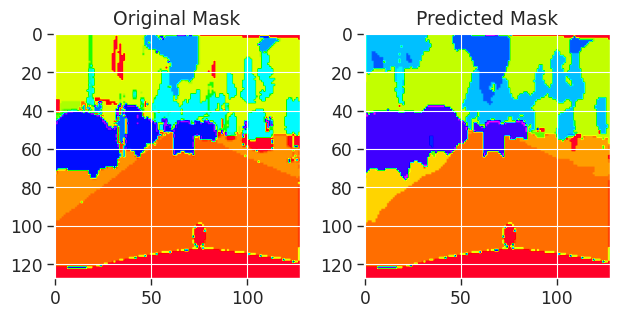

744/744 [==============================] - 76s 102ms/step - loss: 0.3892 - accuracy: 0.8868 - mean_iou: 0.4523 - val_loss: 0.6078 - val_accuracy: 0.8396 - val_mean_iou: 0.3274
Epoch 26/100
1/1 [==============================] - 0s 21ms/step- loss: 0.3749 - accuracy: 0.8907 - mean_iou: 0.46


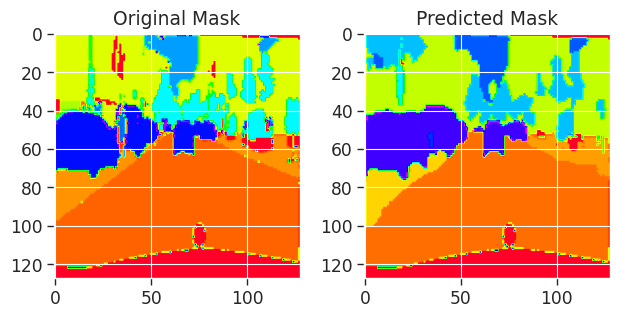

744/744 [==============================] - 76s 103ms/step - loss: 0.3749 - accuracy: 0.8907 - mean_iou: 0.4683 - val_loss: 0.5861 - val_accuracy: 0.8427 - val_mean_iou: 0.3321
Epoch 27/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3708 - accuracy: 0.8921 - mean_iou: 0.47


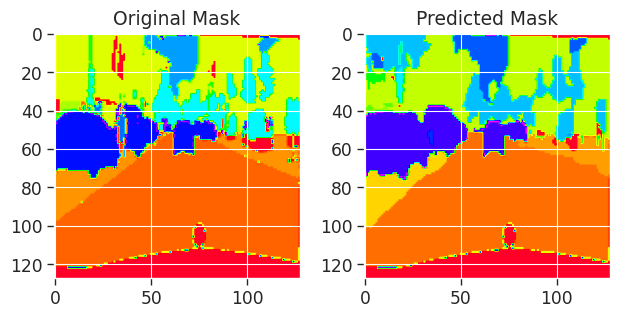

744/744 [==============================] - 75s 100ms/step - loss: 0.3708 - accuracy: 0.8921 - mean_iou: 0.4756 - val_loss: 0.5846 - val_accuracy: 0.8453 - val_mean_iou: 0.3371
Epoch 28/100
1/1 [==============================] - 0s 22ms/step- loss: 0.3605 - accuracy: 0.8950 - mean_iou: 0.48


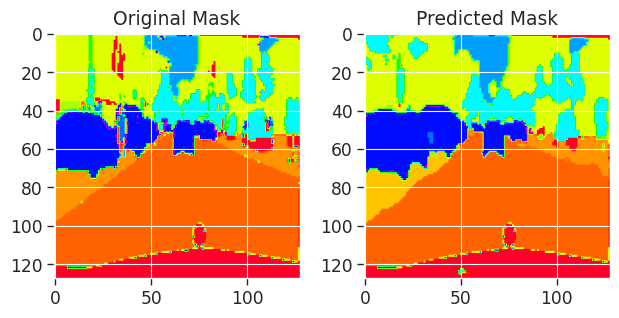

744/744 [==============================] - 76s 102ms/step - loss: 0.3605 - accuracy: 0.8950 - mean_iou: 0.4849 - val_loss: 0.5894 - val_accuracy: 0.8459 - val_mean_iou: 0.3422


In [42]:
input_shape = (128, 128, 3)
batchnorm=True
model = get_unet_aspp_model()
# model.summary()

# Training Configuration
BATCH_SIZE = 4
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("../input/cityscapes-image-pairs/cityscapes_data/val/122.jpg")
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = BATCH_SIZE, validation_data = (X_valid, Y_valid), callbacks=[viz_callback, early_stopping])

In [43]:
model_json = model.to_json()
with open("unetaspp_bs4.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("unetaspp_bs4.h5")
print("Saved model to disk")

Saved model to disk


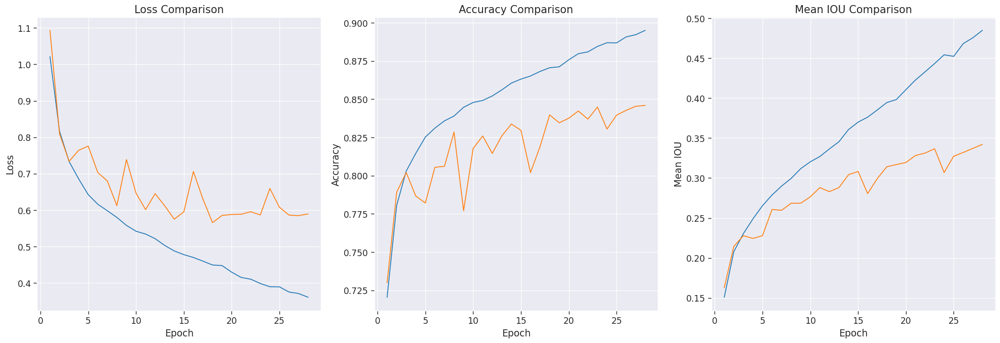

In [44]:
# Training Results
plot_history(history)

# Evaluating on Test data set

In [28]:
#Evaluating Model on test
input_shape = (128, 128, 3)
batchnorm=True
model = get_unet_aspp_model()


BATCH_SIZE = 16
model.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])
# Loads the weights
model.load_weights("/kaggle/input/modelweights/unetaspp_bs4.h5")

# Re-evaluate the model
print("Test Metrics: ")
out=model.evaluate(X_test, Y_test, verbose=2)

Test Metrics: 
7/7 - 2s - loss: 0.5686 - accuracy: 0.8381 - mean_iou: 0.3562 - 2s/epoch - 276ms/step
